In [410]:
from hossam import load_data
from hossam.util import hs_load_data
from matplotlib import pyplot as plt
from matplotlib import font_manager as fm
import seaborn as sb
import numpy as np
import pandas as pd
from pandas import DataFrame

import statsmodels.api as sm
from statsmodels.stats.diagnostic import linear_reset
from scipy.stats import zscore, probplot, shapiro, anderson, pearsonr
from statsmodels.stats.api import het_breuschpagan
from statsmodels.stats.stattools import durbin_watson
from scipy.stats import spearmanr

from itertools import combinations
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [411]:
my_dpi = 200
font_path = "../data_visualization/NotoSansKR-Regular.ttf"
fm.fontManager.addfont(font_path)
font_prop = fm.FontProperties(fname=font_path)
font_name = font_prop.get_name()
my_font_name = "Noto Sans KR"
my_theme = "dark"

sb.set_theme(style=my_theme)
plt.rcParams['font.family'] = my_font_name
plt.rcParams['font.size'] = 5
plt.rcParams['axes.unicode_minus'] = False

In [412]:
origin = hs_load_data('california_cluster.xlsx')

print("\n===== 데이터 크기 확인 =====")
print(f"데이터셋 크기 : {origin.shape}")
print(f"열 개수: {origin.shape[1]}")
print(f"행 개수: {origin.shape[0]}")

origin.head()


✅ 테이블 정보
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   longitude   20640 non-null  float64
 1   latitude    20640 non-null  float64
 2   housing_me  20640 non-null  int64  
 3   total_room  20640 non-null  int64  
 4   total_bedr  20433 non-null  float64
 5   population  20640 non-null  int64  
 6   households  20640 non-null  int64  
 7   median_inc  20640 non-null  float64
 8   median_hou  20640 non-null  int64  
 9   ocean_prox  20640 non-null  object 
 10  CLUSTER_ID  20640 non-null  int64  
dtypes: float64(4), int64(6), object(1)
memory usage: 1.7+ MB


✅ 상위 5개 행
+---+-----------+----------+------------+------------+------------+------------+------------+-------------------+------------+------------+------------+
|   | longitude | latitude | housing_me | total_room | total_bedr | population | households |    median_inc     | median_

,longitude,latitude,housing_me,total_room,total_bedr,population,households,median_inc,median_hou,ocean_prox,CLUSTER_ID
0,-122.23,37.88,41,880,129.0,322,126,8.3252,452600,NEAR BAY,5
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,358500,NEAR BAY,5
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,352100,NEAR BAY,5
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,341300,NEAR BAY,5
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,342200,NEAR BAY,5


In [413]:
# 컬럼명 기존 코드대로 맞추기
origin.columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms',
                  'total_bedrooms', 'population', 'households',
                  'median_income', 'median_house_value', 'ocean_proximity','CLUSTER_ID']
df = origin.copy()
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,CLUSTER_ID
0,-122.23,37.88,41,880,129.0,322,126,8.3252,452600,NEAR BAY,5
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,358500,NEAR BAY,5
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,352100,NEAR BAY,5
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,341300,NEAR BAY,5
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,342200,NEAR BAY,5


In [525]:
# print("\n===== 데이터 타입 확인 =====")
# print(df.info())
# 연속형 변수의 기술 통계량
df.filter(items=['housing_median_age', 'total_rooms',
                'population','median_income', 'median_house_value']).describe()

,housing_median_age,total_rooms,population,median_income,median_house_value
count,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000
mean,28.633094,2636.504233,1424.946949,3.871162,206864.413155
std,12.591805,2185.269567,1133.208490,1.899291,115435.667099
min,1.000000,2.000000,3.000000,0.499900,14999.000000
25%,18.000000,1450.000000,787.000000,2.563700,119500.000000
50%,29.000000,2127.000000,1166.000000,3.536500,179700.000000
75%,37.000000,3143.000000,1722.000000,4.744000,264700.000000
max,52.000000,39320.000000,35682.000000,15.000100,500001.000000


### 미션 1. 이 데이터의 신뢰성
- 1. 결측치, 이상치, 편향 점검 - 처리 기준 제시
- 2. 주요 변수의 범위가 현실적인지 판단
- 3. 특정 변수의 데이터 확인 및 영향 검토(housing_median_age의 값이 52인 값들)
- 4. 전처리 전,후가 어떻게 달라졌는지 한눈에 비교하는 표나 요약

In [415]:
# 1. 결측치, 이상치, 편향 점검 - 처리 기준 제시
print("\n===== 결측치 확인 =====")
print(df.isnull().sum())


===== 결측치 확인 =====
longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
CLUSTER_ID              0
dtype: int64


In [416]:
# 결측치 삭제
df.dropna(subset=['total_bedrooms'], inplace=True)
print("\n===== 결측치 삭제 후 확인 =====")
df.isnull().sum()
df.info()


===== 결측치 삭제 후 확인 =====
<class 'pandas.core.frame.DataFrame'>
Index: 20433 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20433 non-null  float64
 1   latitude            20433 non-null  float64
 2   housing_median_age  20433 non-null  int64  
 3   total_rooms         20433 non-null  int64  
 4   total_bedrooms      20433 non-null  float64
 5   population          20433 non-null  int64  
 6   households          20433 non-null  int64  
 7   median_income       20433 non-null  float64
 8   median_house_value  20433 non-null  int64  
 9   ocean_proximity     20433 non-null  object 
 10  CLUSTER_ID          20433 non-null  int64  
dtypes: float64(4), int64(6), object(1)
memory usage: 1.9+ MB


 총 데이터 수 `20640개` 중 `total_bedrooms`의 결측치 갯수 `207개`의 비율은 `약 1%` 밖에 되지 않기 때문에
>
> `total_bedrooms의 결측치를 제거 하는 것`으로 결정.


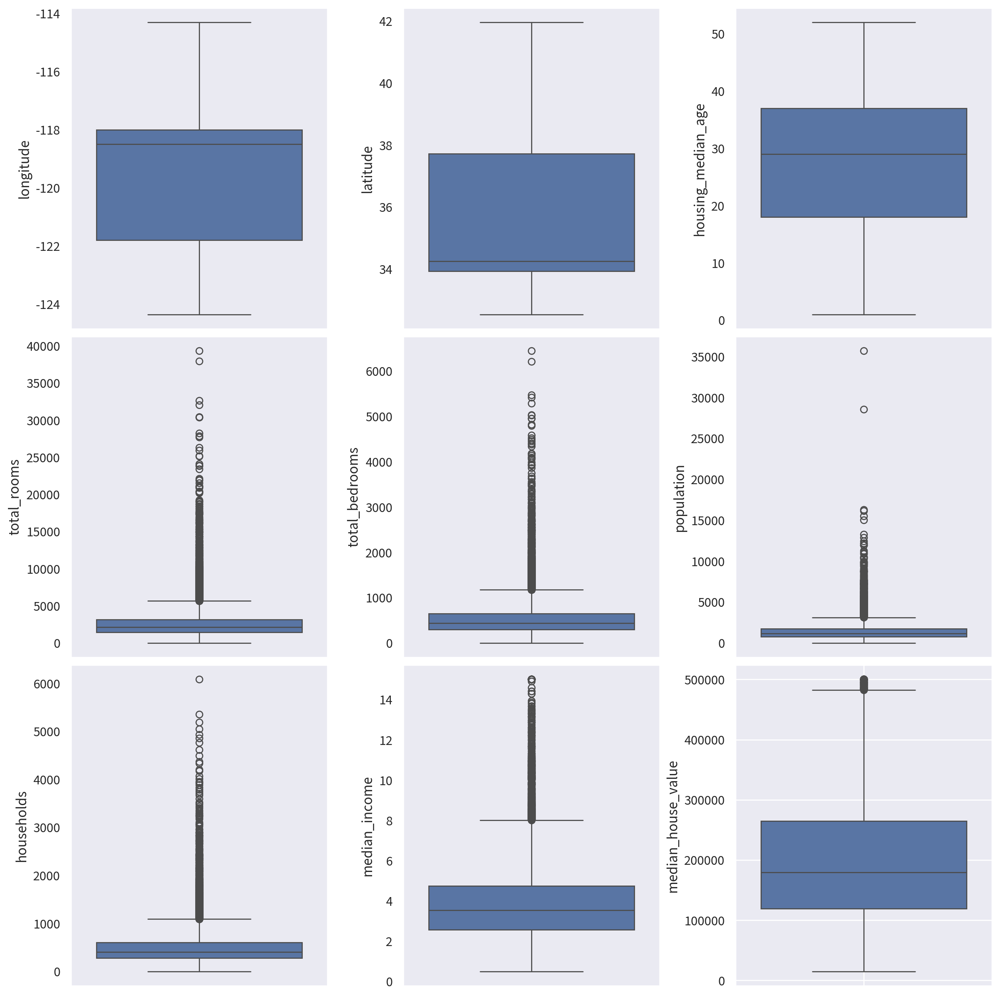

In [417]:
# 이상치를 알기 위해 박스플롯 시각화
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 2500             #그래프 세로 크기
rows = 3                    #도화지의 행 수
cols = 3                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.boxplot(data=df['longitude'],orient='v',ax=ax[0][0])
sb.boxplot(data=df['latitude'],orient='v',ax=ax[0][1])
sb.boxplot(data=df['housing_median_age'],orient='v',ax=ax[0][2])
sb.boxplot(data=df['total_rooms'],orient='v',ax=ax[1][0])
sb.boxplot(data=df['total_bedrooms'],orient='v',ax=ax[1][1])
sb.boxplot(data=df['population'],orient='v',ax=ax[1][2])
sb.boxplot(data=df['households'],orient='v',ax=ax[2][0])
sb.boxplot(data=df['median_income'],orient='v',ax=ax[2][1])
sb.boxplot(data=df['median_house_value'],orient='v',ax=ax[2][2])

# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용
plt.grid(True)

# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

- 전체 구역을 두고 보았을 때는 이상치가 상당히 많이 존재함
    - 지역별로 주택 가격의 차이가 존재함

### 미션 2. 가격과 핵심 변수의 첫 인상
- 1. median_house_value, median_income, housing_median_age, total_rooms 분포를 히스토그램/KDE로 확인 및 객관적 사실 서술
- 2. 왜도/이상치가 회귀에 줄 수 있는 영향과 변환할 필요가 있는지 서술
- 3. 분포 비교는 동일 축 스케일로 제시하고, 평균/중앙값/꼬리의 차이를 문장으로 요약
- 4. 지역별(Latitude/Longitude) 편향이나 시계열 문제(1990년 데이터만)가 해석에 미치는 영향도 짧게 언급

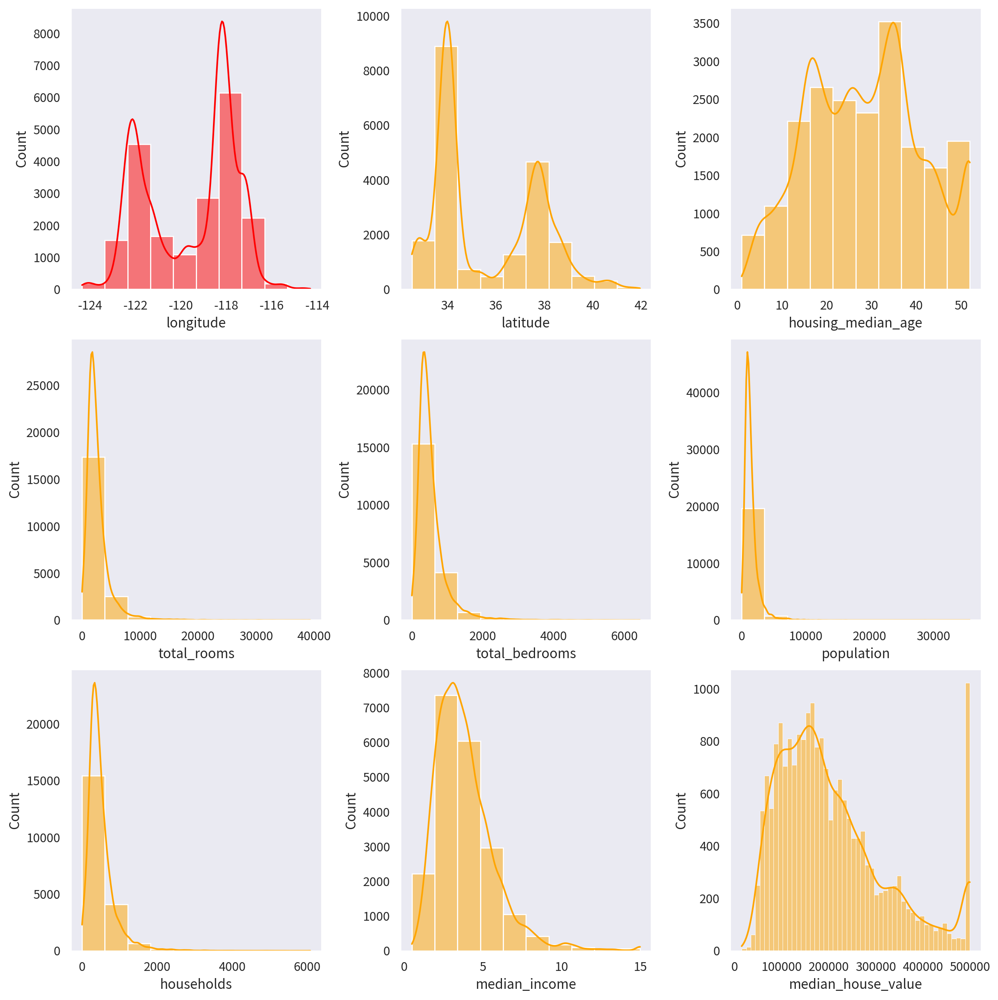

In [418]:
#1. median_house_value, median_income, housing_median_age, total_rooms 분포를 히스토그램/KDE로 확인 및 객관적 사실 서술
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 2500             #그래프 세로 크기
rows = 3                    #도화지의 행 수
cols = 3                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.histplot(data=df, x='longitude', bins=10, kde=True, color='red', ax=ax[0,0])
sb.histplot(data=df, x='latitude', bins=10, kde=True, color='orange', ax=ax[0,1])
sb.histplot(data=df, x='housing_median_age', bins=10, kde=True, color='orange', ax=ax[0,2])
sb.histplot(data=df, x='total_rooms', bins=10, kde=True, color='orange', ax=ax[1,0])
sb.histplot(data=df, x='total_bedrooms', bins=10, kde=True, color='orange', ax=ax[1,1])
sb.histplot(data=df, x='population', bins=10, kde=True, color='orange',ax=ax[1,2])
sb.histplot(data=df, x='households', bins=10, kde=True, color='orange',ax=ax[2,0])
sb.histplot(data=df, x='median_income', bins=10, kde=True, color='orange',ax=ax[2,1])
sb.histplot(data=df, x='median_house_value', bins=50, kde=True, color='orange',ax=ax[2,2])

# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용


# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

- 알 수 있는 사실
    - housing_median_age의 경우 30~40년 사이의 집이 많이 분포함
    - total_rooms,total_bedrooms,population,households의 경우 왼쪽으로 치우쳐져있음.
        - 일부 극단값들이 존재한다는 뜻 - 로그 변환 고려
    - median_income과 median_house_value는 다른 변수에 비해 고루 퍼져있지만 왼쪽으로 조금 치우쳐져있음
        - 로그 변환 고려, median_house_value의 경우 50만이라는 상한선이 존재하는듯함.
> - 연속형 독립변수 중 `housing_median_age`는 3사분위 수 밖 구간에서 peak가 확인 됨
>   - 이는 `1940년 이전 건축 주택이 모두 52년으로 코딩 된 결과에서 비롯되었다`고 보여짐
>   - -> **이유**: 1940년 이전 건축 주택이 모두 52로 코딩 된 이유는 미국의 `역사 보존법`에 근거하여 `50년 이상 된 건물들`은 국가 사적지 등록부로 `행정적 분류`가 되는 것에서 비롯됨 **(근거 필요)**
> - `'median_house_value'`의 1990년 명목가는 `약 194,300` 달러인데 **(근거 필요)**, 이 값은 사실을 기반으로 만들어진 지금 데이터셋의 `'median_house_value'` 변수의 `평균(206855.816909), 중앙값(179700.000000) 그리고 3사분위 수 밖의 peak` 의 영향으로 보여짐
>   - 최빈값(≒162500) < 중앙값(≒179700) < 평균(≒206860) 이면서 극단치가 오른쪽에 peak 형태로 몰빵되있는 형태는 전형적인 **우편향 분포**를 의미
> - 그 밖의 `total_rooms, total_bedrooms, population, households, median_income` 변수 5개에서는 오른쪽으로 꼬리가 긴 **우편향 분포**를 보임

        

- 상한선 데이터 확인

<Axes: xlabel='longitude', ylabel='latitude'>

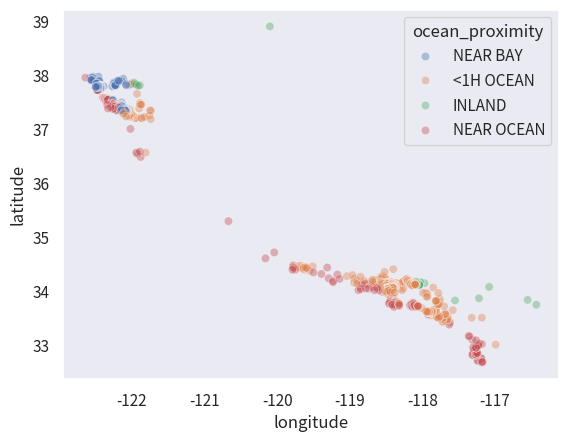

In [514]:
# 전체 데이터에서 주택 가격이 상한선에 해당하는 값만 추출
df3 = df[df['median_house_value'] == 500001]
# scatter plot으로 상한선 값의 위경도 값이 어디에 몰려있는지 확인
sb.scatterplot(
    x='longitude',
    y='latitude',
    hue='ocean_proximity',
    data=df3,
    alpha=0.4
)

- 상한선 값은 샌프란시스코, LA, 샌디에고 쪽에 위치하는것을 확인함
- 해안 지역에 많이 위치하는 것을 보아 비싼 주택은 해안쪽에 위치해있을 것으로 예상할 수 있음

In [420]:
df_cluster_0=df[df['CLUSTER_ID']==0]
df_cluster_1=df[df['CLUSTER_ID']==1]
df_cluster_2=df[df['CLUSTER_ID']==2]
df_cluster_3=df[df['CLUSTER_ID']==3]
df_cluster_4=df[df['CLUSTER_ID']==4]
df_cluster_5=df[df['CLUSTER_ID']==5]
print(df_cluster_0.shape)
print(df_cluster_1.shape)
print(df_cluster_2.shape)
print(df_cluster_3.shape)
print(df_cluster_4.shape)
print(df_cluster_5.shape)


(681, 11)
(2137, 11)
(1726, 11)
(2307, 11)
(8803, 11)
(4779, 11)


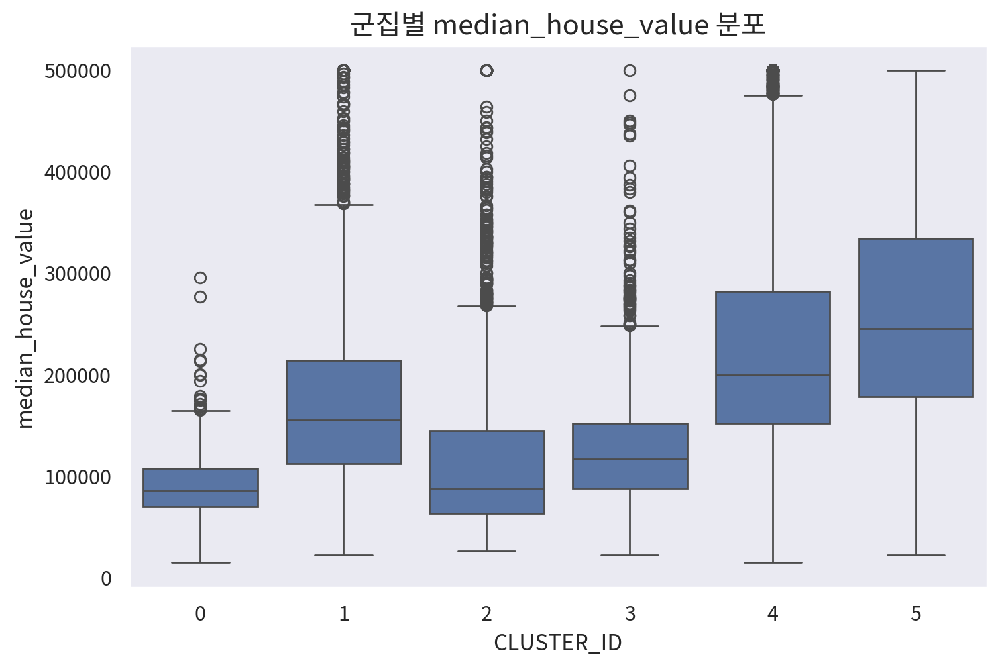

In [421]:
# 군집별 집값 중앙값 확인하는 boxplot
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 1500             #그래프 가로 크기
height_px = 1000             #그래프 세로 크기
rows = 1                    #도화지의 행 수
cols = 1                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)
# 2) 그래프 그리기 -> seaborn 사용
sb.boxplot(data=df, x='CLUSTER_ID', y='median_house_value', ax=ax)
# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용
ax.set_title('군집별 median_house_value 분포', fontsize=15)
ax.set_xlabel('CLUSTER_ID', fontsize=12)
ax.set_ylabel('median_house_value', fontsize=12)
# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료


- 데이터 건 수가 큰 순서 : 4-5-3-1-2-0
- CLUSTER ID 별로 주택 가격 수준과 분포가 명확함
    - 주택 시장의 구조적 차이가 반영되어 있다고 볼 수 있음.
- 중앙값이 가장 높은 클러스터 = 5 - 4 - 1 - 3 - 2 - 0
    - 중앙값이 높고 상자 폭이 넓음 -> 다양한 값의 주택이 존재함
    - 상한선(500,000)이 이상치로 잡히지 않음
        - 고소득, 고가 주거 지역으로 꼽을 수 있음.

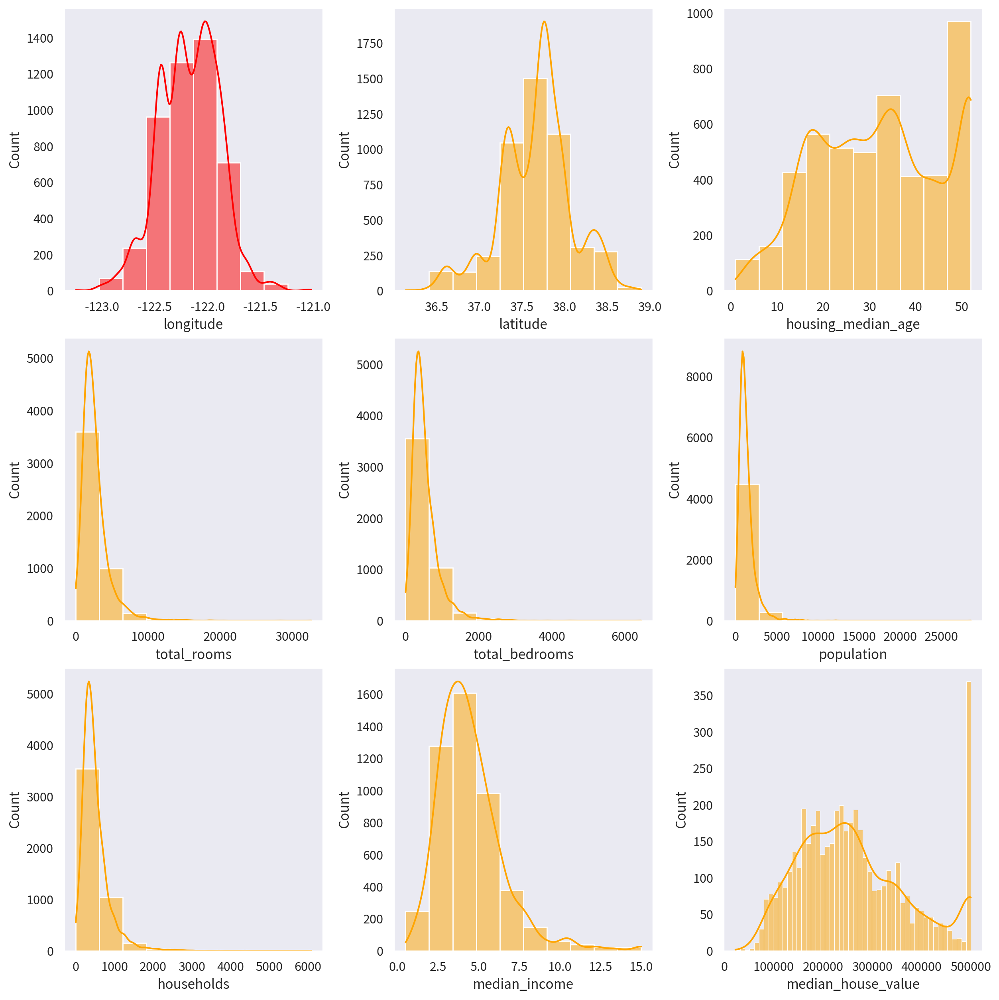

In [422]:
#1. median_house_value, median_income, housing_median_age, total_rooms 분포를 히스토그램/KDE로 확인 및 객관적 사실 서술
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 2500             #그래프 세로 크기
rows = 3                    #도화지의 행 수
cols = 3                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.histplot(data=df_cluster_5, x='longitude', bins=10, kde=True, color='red', ax=ax[0,0])
sb.histplot(data=df_cluster_5, x='latitude', bins=10, kde=True, color='orange', ax=ax[0,1])
sb.histplot(data=df_cluster_5, x='housing_median_age', bins=10, kde=True, color='orange', ax=ax[0,2])
sb.histplot(data=df_cluster_5, x='total_rooms', bins=10, kde=True, color='orange', ax=ax[1,0])
sb.histplot(data=df_cluster_5, x='total_bedrooms', bins=10, kde=True, color='orange', ax=ax[1,1])
sb.histplot(data=df_cluster_5, x='population', bins=10, kde=True, color='orange',ax=ax[1,2])
sb.histplot(data=df_cluster_5, x='households', bins=10, kde=True, color='orange',ax=ax[2,0])
sb.histplot(data=df_cluster_5, x='median_income', bins=10, kde=True, color='orange',ax=ax[2,1])
sb.histplot(data=df_cluster_5, x='median_house_value', bins=50, kde=True, color='orange',ax=ax[2,2])

# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용


# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

- CLUSTER 5의 경우 36.5~39, -123~-121 부근에 집중된 군집임
    - 20~50년 구간의 주택이 고르게 분포하며 52에 도달한 주택 비중이 가장 큼
        - 오래전에 형성된 도시 주거 지역의 특성을 띄고 있음
    - 소득은 4~7구간으로 오른쪽 꼬리가 길며 고소득 가구 비중이 높음
        - 일부 지역은 (12.5 이상) 매우 높은 소득 구간까지 확장되어있는 모습
    - 주택 가격의 분포는 20~40만 달러 구간이 주로 이뤄짐
        - 50만 달러 상한선에 도달한 관측치가 집중적으로 나타남
        - 주로 25~40만 달러 사이로 이뤄져 군집 중 가장 집값이 높은 군집임을 보이고 있음

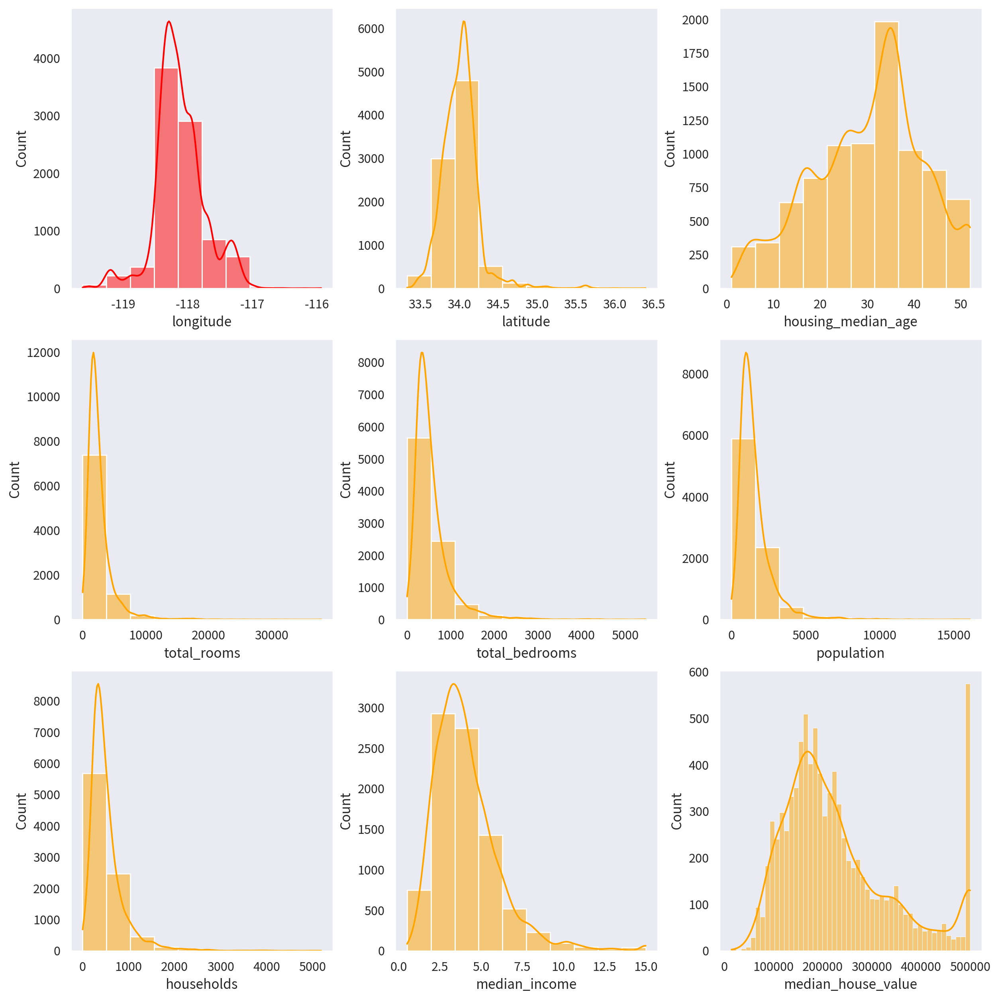

<class 'pandas.core.frame.DataFrame'>
Index: 8803 entries, 2799 to 20506
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           8803 non-null   float64
 1   latitude            8803 non-null   float64
 2   housing_median_age  8803 non-null   int64  
 3   total_rooms         8803 non-null   int64  
 4   total_bedrooms      8803 non-null   float64
 5   population          8803 non-null   int64  
 6   households          8803 non-null   int64  
 7   median_income       8803 non-null   float64
 8   median_house_value  8803 non-null   int64  
 9   ocean_proximity     8803 non-null   object 
 10  CLUSTER_ID          8803 non-null   int64  
dtypes: float64(4), int64(6), object(1)
memory usage: 825.3+ KB


In [423]:
#1. median_house_value, median_income, housing_median_age, total_rooms 분포를 히스토그램/KDE로 확인 및 객관적 사실 서술
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 2500             #그래프 세로 크기
rows = 3                    #도화지의 행 수
cols = 3                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.histplot(data=df_cluster_4, x='longitude', bins=10, kde=True, color='red', ax=ax[0,0])
sb.histplot(data=df_cluster_4, x='latitude', bins=10, kde=True, color='orange', ax=ax[0,1])
sb.histplot(data=df_cluster_4, x='housing_median_age', bins=10, kde=True, color='orange', ax=ax[0,2])
sb.histplot(data=df_cluster_4, x='total_rooms', bins=10, kde=True, color='orange', ax=ax[1,0])
sb.histplot(data=df_cluster_4, x='total_bedrooms', bins=10, kde=True, color='orange', ax=ax[1,1])
sb.histplot(data=df_cluster_4, x='population', bins=10, kde=True, color='orange',ax=ax[1,2])
sb.histplot(data=df_cluster_4, x='households', bins=10, kde=True, color='orange',ax=ax[2,0])
sb.histplot(data=df_cluster_4, x='median_income', bins=10, kde=True, color='orange',ax=ax[2,1])
sb.histplot(data=df_cluster_4, x='median_house_value', bins=50, kde=True, color='orange',ax=ax[2,2])
# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용


# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료
df_cluster_4.info()

- CLUSTER 4의 경우 33.5~35, -119~-117 부근에 집중된 군집임
    - 20~40년 구간의 주택 비중이 가장 크고 노후 주택의 비율도 상당히 많은 차지를 함
        - 비교적 오래전에 형성된 주거 지역의 특성을 나타내고 있음
    - 소득은 3~6구간으로 대부분 이뤄지며 고소득 구간이 다른 클러스터들에 비해 상대적으로 큼
    - 주택 가격의 분포는 20~35만 달러 구간이 주로 이뤄짐
        - 30만 달러 이상 고가 주택 비중이 큼
        - 50만 달러 상한선에 도달한 관측치가 제일 많이 나타남


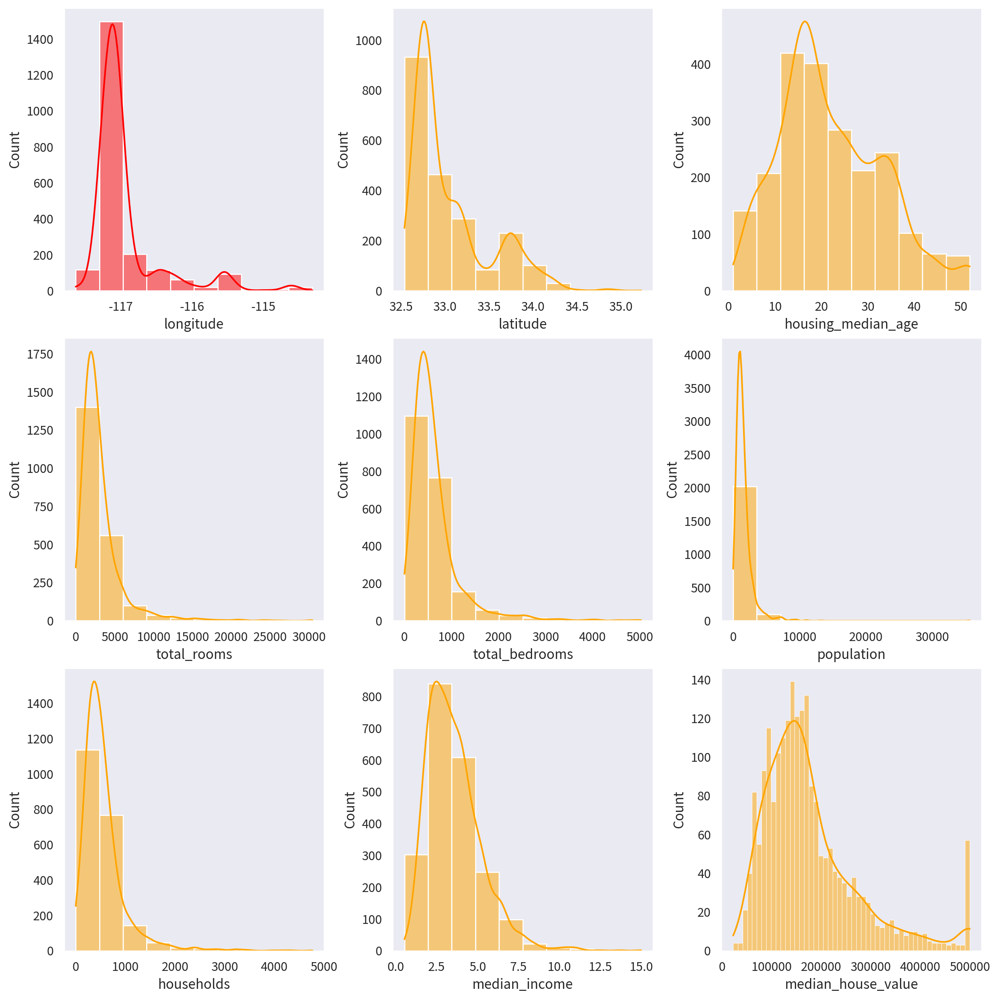

In [424]:
#1. median_house_value, median_income, housing_median_age, total_rooms 분포를 히스토그램/KDE로 확인 및 객관적 사실 서술
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 2500             #그래프 세로 크기
rows = 3                    #도화지의 행 수
cols = 3                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.histplot(data=df_cluster_1, x='longitude', bins=10, kde=True, color='red', ax=ax[0,0])
sb.histplot(data=df_cluster_1, x='latitude', bins=10, kde=True, color='orange', ax=ax[0,1])
sb.histplot(data=df_cluster_1, x='housing_median_age', bins=10, kde=True, color='orange', ax=ax[0,2])
sb.histplot(data=df_cluster_1, x='total_rooms', bins=10, kde=True, color='orange', ax=ax[1,0])
sb.histplot(data=df_cluster_1, x='total_bedrooms', bins=10, kde=True, color='orange', ax=ax[1,1])
sb.histplot(data=df_cluster_1, x='population', bins=10, kde=True, color='orange',ax=ax[1,2])
sb.histplot(data=df_cluster_1, x='households', bins=10, kde=True, color='orange',ax=ax[2,0])
sb.histplot(data=df_cluster_1, x='median_income', bins=10, kde=True, color='orange',ax=ax[2,1])
sb.histplot(data=df_cluster_1, x='median_house_value', bins=50, kde=True, color='orange',ax=ax[2,2])
# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용

# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

- CLUSTER 1의 경우 32.5~35, -117~-115 부근에 집중된 군집임
    - 10~30년간 구간의 주택이 가장 많이 분포하며 52에 도달한 주택도 일부 존재함
        - 비교적 오래된 주택과 혼합된 지역
    - 소득은 2~5구간으로 대부분 이뤄지며 고소득 구간이 일부 존재함
    - CLUSTER 0,2에 비해 상위 구간 비중이 좀 더 큼
    - 주택 가격의 분포는 15~30만 달러 구간이 주로 이뤄짐
        - 30만 달러 이상 고가 주택 비중이 CLUSTER 0,2에 비해 큼
        - 50만 달러 상한선에 도달한 관측치가 꽤 존재함


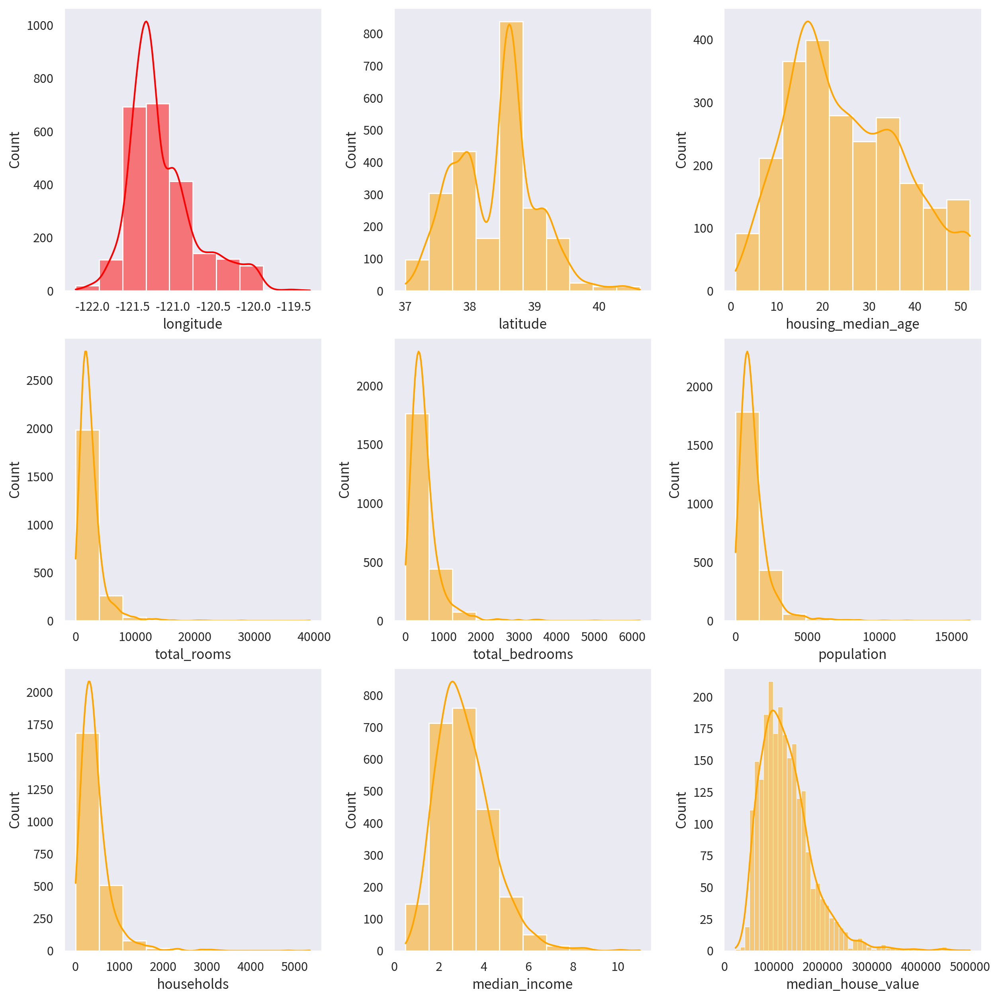

In [425]:
#1. median_house_value, median_income, housing_median_age, total_rooms 분포를 히스토그램/KDE로 확인 및 객관적 사실 서술
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 2500             #그래프 세로 크기
rows = 3                    #도화지의 행 수
cols = 3                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.histplot(data=df_cluster_3, x='longitude', bins=10, kde=True, color='red', ax=ax[0,0])
sb.histplot(data=df_cluster_3, x='latitude', bins=10, kde=True, color='orange', ax=ax[0,1])
sb.histplot(data=df_cluster_3, x='housing_median_age', bins=10, kde=True, color='orange', ax=ax[0,2])
sb.histplot(data=df_cluster_3, x='total_rooms', bins=10, kde=True, color='orange', ax=ax[1,0])
sb.histplot(data=df_cluster_3, x='total_bedrooms', bins=10, kde=True, color='orange', ax=ax[1,1])
sb.histplot(data=df_cluster_3, x='population', bins=10, kde=True, color='orange',ax=ax[1,2])
sb.histplot(data=df_cluster_3, x='households', bins=10, kde=True, color='orange',ax=ax[2,0])
sb.histplot(data=df_cluster_3, x='median_income', bins=10, kde=True, color='orange',ax=ax[2,1])
sb.histplot(data=df_cluster_3, x='median_house_value', bins=50, kde=True, color='orange',ax=ax[2,2])
# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용


# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

- CLUSTER 3의 경우 37 ~ 40, -122~-120 부근에 집중된 군집임
    - 10~30년간 구간의 주택이 가장 많이 분포하며 52에 도달한 주택도 일부 존재함
        - 40년 이상 주택도 일부 존재, 신축과 기존 주택의 혼합된 지역
    - 소득은 2~4구간으로 대부분 이뤄지며 고소득 구간이 극소수 존재함
    - 주택 가격의 분포는 10~20만 달러 구간이 주로 이뤄짐
        - 30만 달러 이상 고가 주택은 소수 존재
        - 50만 달러 상한선에 도달한 관측치가 거의 존재하지 않음

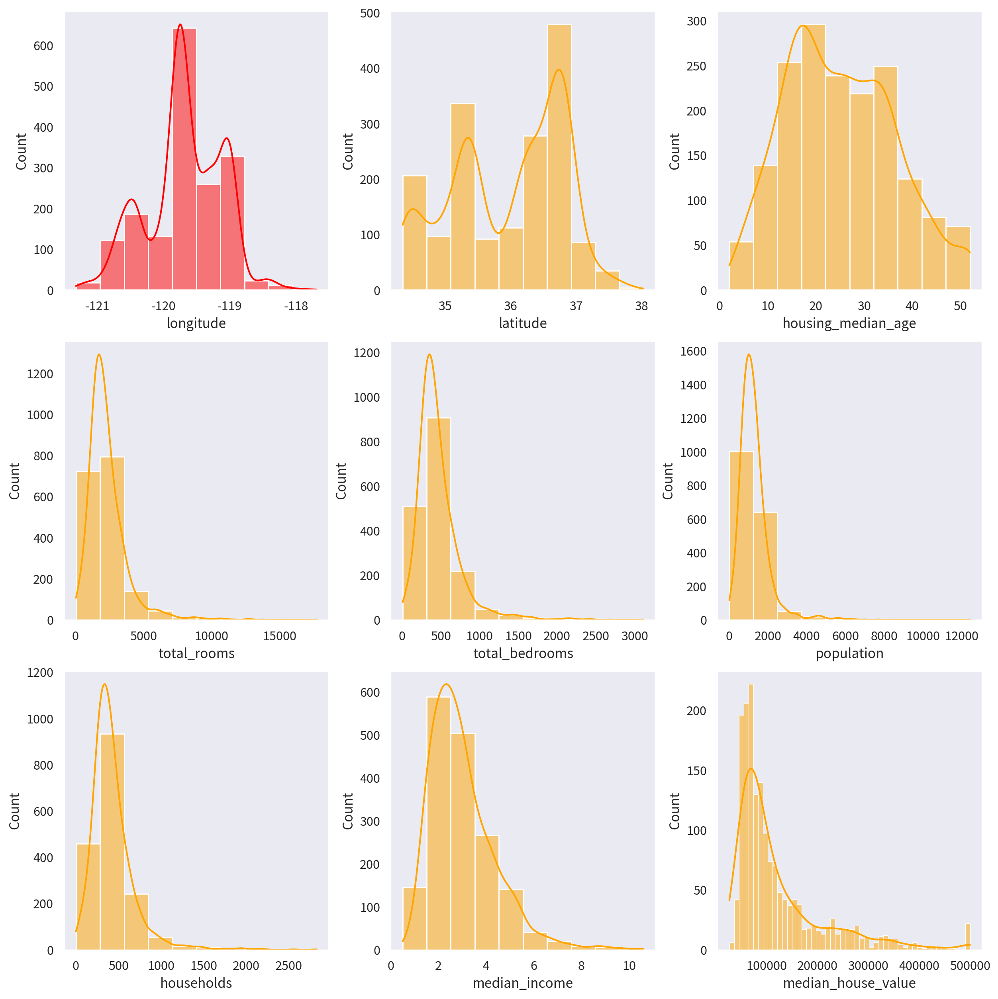

In [426]:
#1. median_house_value, median_income, housing_median_age, total_rooms 분포를 히스토그램/KDE로 확인 및 객관적 사실 서술
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 2500             #그래프 세로 크기
rows = 3                    #도화지의 행 수
cols = 3                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.histplot(data=df_cluster_2, x='longitude', bins=10, kde=True, color='red', ax=ax[0,0])
sb.histplot(data=df_cluster_2, x='latitude', bins=10, kde=True, color='orange', ax=ax[0,1])
sb.histplot(data=df_cluster_2, x='housing_median_age', bins=10, kde=True, color='orange', ax=ax[0,2])
sb.histplot(data=df_cluster_2, x='total_rooms', bins=10, kde=True, color='orange', ax=ax[1,0])
sb.histplot(data=df_cluster_2, x='total_bedrooms', bins=10, kde=True, color='orange', ax=ax[1,1])
sb.histplot(data=df_cluster_2, x='population', bins=10, kde=True, color='orange',ax=ax[1,2])
sb.histplot(data=df_cluster_2, x='households', bins=10, kde=True, color='orange',ax=ax[2,0])
sb.histplot(data=df_cluster_2, x='median_income', bins=10, kde=True, color='orange',ax=ax[2,1])
sb.histplot(data=df_cluster_2, x='median_house_value', bins=50, kde=True, color='orange',ax=ax[2,2])
# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용


# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

- CLUSTER 2의 경우 (34~38, -118~-121) 사이의 위치한 군집임
    - 해당 군집의 집 나이는 20년 넘은 집이 가장 많음
        - 신축과 기존 주택이 존재하는 지역 
    - 중,저소득 구간에 분포, 고소득이 일부 존재함
    - 대부분 10~20만 달러 사이에 존재, 50만 상한선에 소수 존재함
> 전반적으로 오른쪽으로 꼬리가 난 비대칭 분포이며 소득과 주택 가격에서 긴 꼬리가 존재함

> 일부 높은 관측치가 존재하지만 군집 내에서의 차이가 존재할 것이라고 판단됨

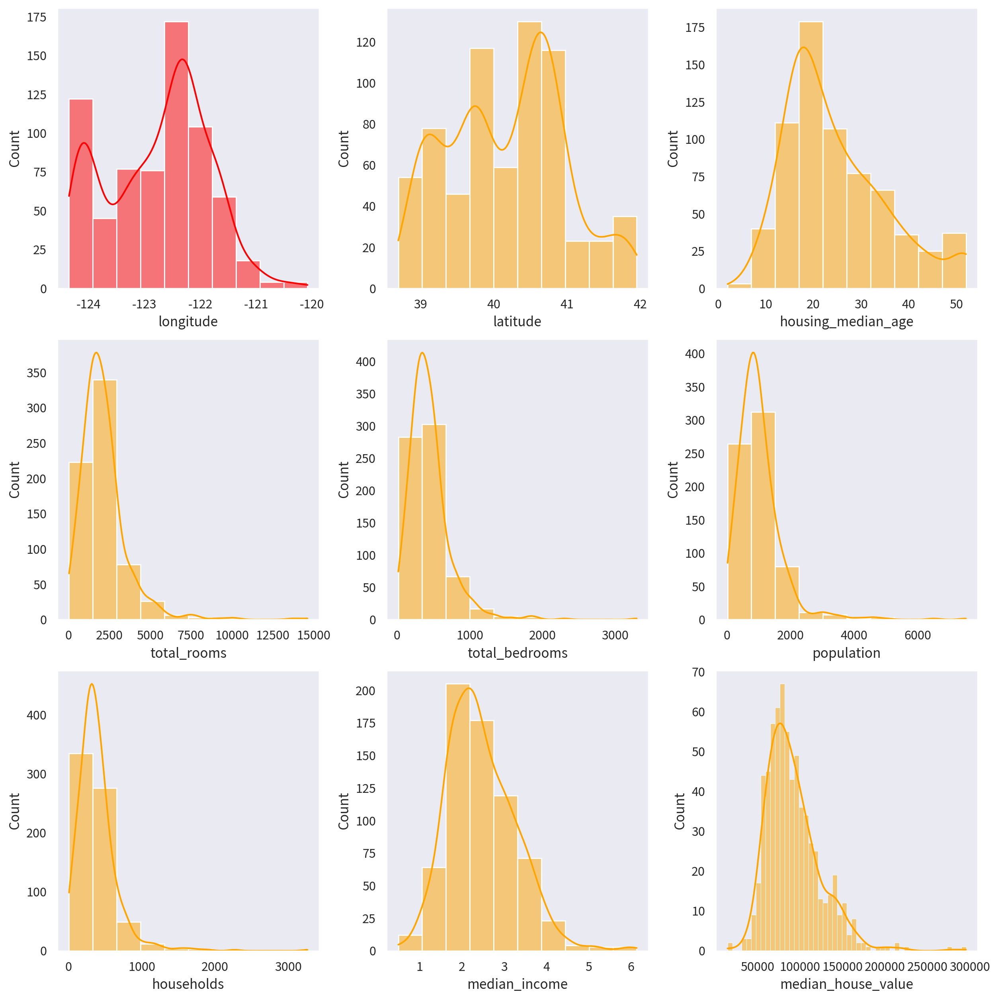

In [427]:
#1. median_house_value, median_income, housing_median_age, total_rooms 분포를 히스토그램/KDE로 확인 및 객관적 사실 서술
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 2500             #그래프 세로 크기
rows = 3                    #도화지의 행 수
cols = 3                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.histplot(data=df_cluster_0, x='longitude', bins=10, kde=True, color='red', ax=ax[0,0])
sb.histplot(data=df_cluster_0, x='latitude', bins=10, kde=True, color='orange', ax=ax[0,1])
sb.histplot(data=df_cluster_0, x='housing_median_age', bins=10, kde=True, color='orange', ax=ax[0,2])
sb.histplot(data=df_cluster_0, x='total_rooms', bins=10, kde=True, color='orange', ax=ax[1,0])
sb.histplot(data=df_cluster_0, x='total_bedrooms', bins=10, kde=True, color='orange', ax=ax[1,1])
sb.histplot(data=df_cluster_0, x='population', bins=10, kde=True, color='orange',ax=ax[1,2])
sb.histplot(data=df_cluster_0, x='households', bins=10, kde=True, color='orange',ax=ax[2,0])
sb.histplot(data=df_cluster_0, x='median_income', bins=10, kde=True, color='orange',ax=ax[2,1])
sb.histplot(data=df_cluster_0, x='median_house_value', bins=50, kde=True, color='orange',ax=ax[2,2])
# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용


# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

- CLUSTER 0의 경우 (39~42, -120~-124) 사이의 위치한 군집임
    - 해당 군집의 집 나이는 20년 넘은 집이 가장 많음
    - 소득 분위는 2~3사이가 가장 많이 몰려있음
    - 집값은 7~10만 달러 사이로 보임
- > 부자동네는 아닌 것 같다!

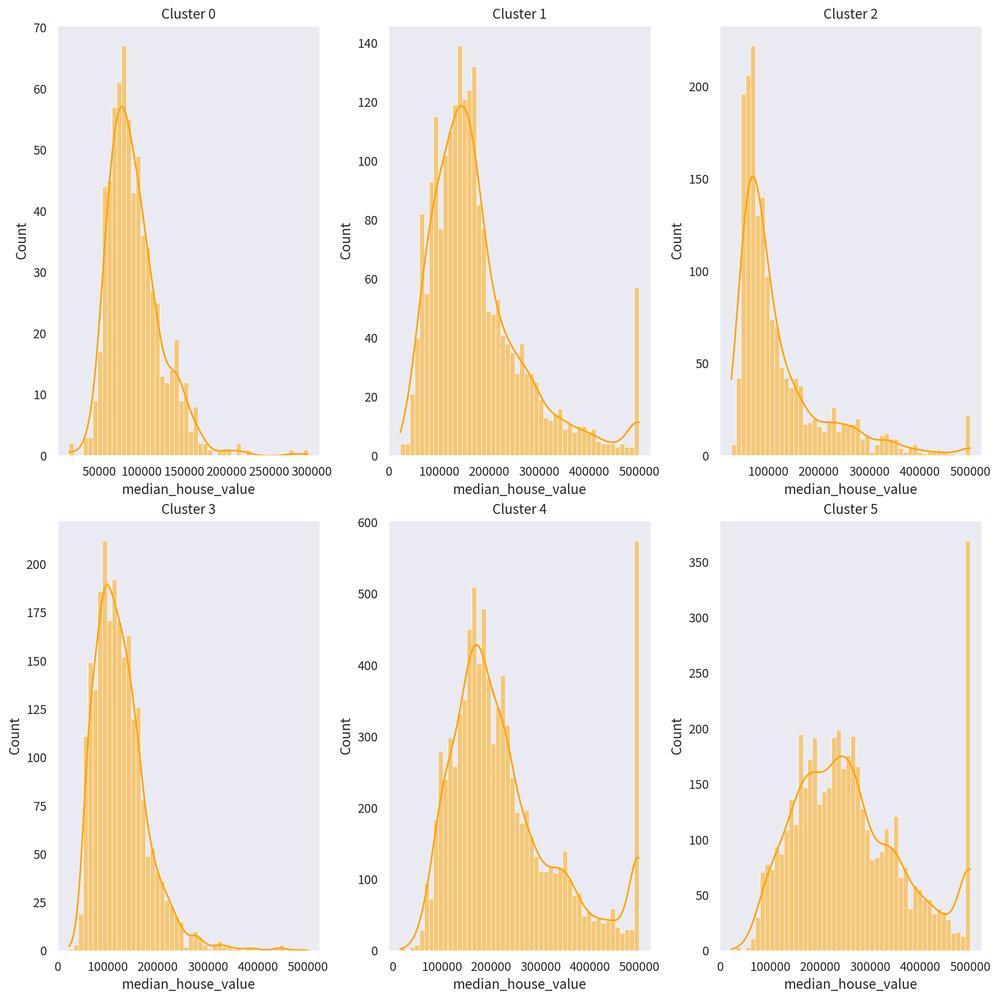

In [428]:
# print(df_cluster_0.info())
# print(df_cluster_1.info())
# print(df_cluster_2.info())
# print(df_cluster_3.info())
# print(df_cluster_4.info())
# print(df_cluster_5.info())
#1. median_house_value, median_income, housing_median_age, total_rooms 분포를 히스토그램/KDE로 확인 및 객관적 사실 서술
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 2500             #그래프 세로 크기
rows = 2                    #도화지의 행 수
cols = 3                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.histplot(data=df_cluster_0, x='median_house_value', bins=50, kde=True, color='orange', ax=ax[0,0])
sb.histplot(data=df_cluster_1, x='median_house_value', bins=50, kde=True, color='orange', ax=ax[0,1])
sb.histplot(data=df_cluster_2, x='median_house_value', bins=50, kde=True, color='orange', ax=ax[0,2])
sb.histplot(data=df_cluster_3, x='median_house_value', bins=50, kde=True, color='orange',ax=ax[1,0])
sb.histplot(data=df_cluster_4, x='median_house_value', bins=50, kde=True, color='orange',ax=ax[1,1])
sb.histplot(data=df_cluster_5, x='median_house_value', bins=50, kde=True, color='orange',ax=ax[1,2])
# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용


# 4) 출력
# 그림마다 클러스터 번호 추가
ax[0,0].set_title('Cluster 0')
ax[0,1].set_title('Cluster 1')
ax[0,2].set_title('Cluster 2')
ax[1,0].set_title('Cluster 3')
ax[1,1].set_title('Cluster 4')
ax[1,2].set_title('Cluster 5')
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

- 군집별 평균/중앙값/분포 확인

In [429]:
# 군집별 평균/중앙값/분포 확인, 집값이 높은 순으로 정렬
df.groupby('CLUSTER_ID')[[
    'median_income',
    'total_bedrooms',
    'total_rooms',
    'population',
    'households',
    'housing_median_age',
    'median_house_value'
]].mean().sort_values(by='median_house_value', ascending=False)


,median_income,total_bedrooms,total_rooms,population,households,housing_median_age,median_house_value
CLUSTER_ID,,,,,,,
5,4.470056,527.541745,2664.826114,1349.029504,500.235614,32.175141,262982.934296
4,4.088769,552.469613,2631.926502,1541.657844,519.276951,30.234920,230074.808588
1,3.565761,631.154890,3103.293870,1537.896116,556.547496,22.137108,177835.634534
3,3.143754,498.660598,2545.473775,1265.909840,453.892068,25.044213,125893.238405
2,3.007218,465.944959,2313.763036,1275.986674,428.545191,25.088644,122516.640209
0,2.467665,444.035242,2158.496329,1010.901615,392.016153,24.596182,92191.480176


- 우연찮게 집값이 높은 순으로 정렬했는데 소득 또한 높은 순으로 정렬됨
- 특이한 것은 1번 클러스터의 집 특징에 관한 데이터인데, 방의 개수도 가장 많고, 가구 수도 가장 많고, 집의 나이가 가장 어리며? 신축인? 특징을 보이고 있다. 그럼에도 집 값이 중간에 해당한다는 것은 total_bedrooms, total_rooms, population, households, housing_median_age보다 집값을 정하는데 관여하는 더 큰 요인이 있다고 생각할 수 있다.
    - 남은 변수는 median_income과 명목형 변수들(ocean_proximity, CLUSTER_ID)

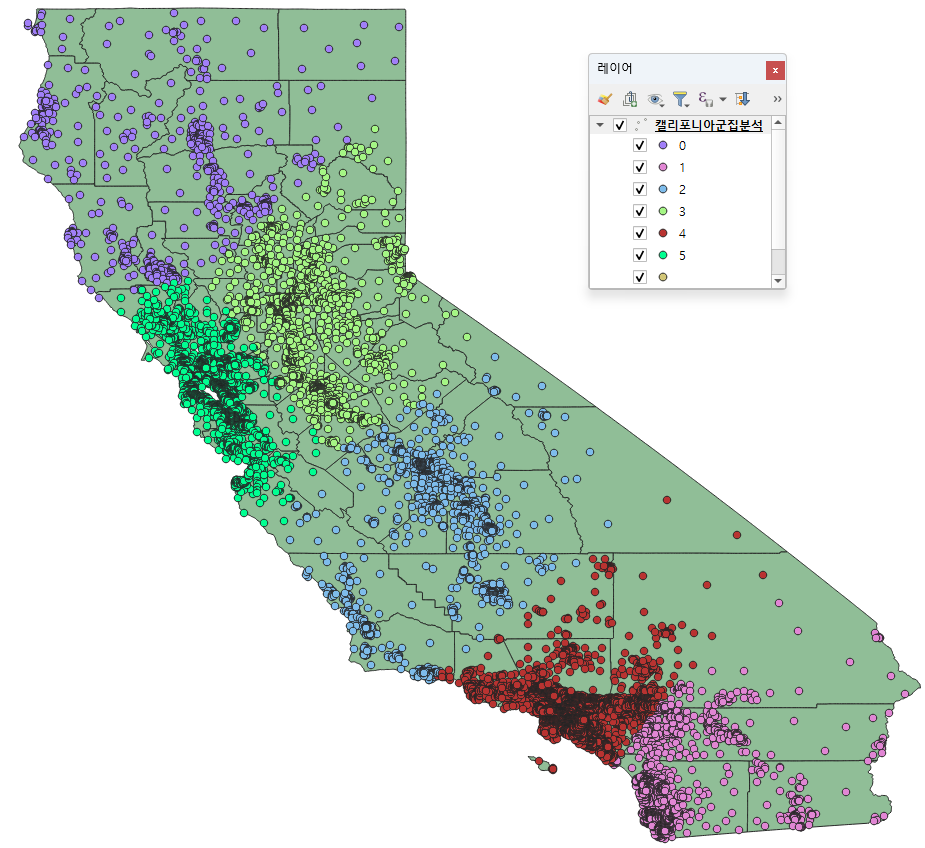
- 전체 분포에서 주택 가격과 중위 소득을 포함한 연속형 변수들은 전체적으로 비대칭 분포를 보임(오른쪽 꼬리가 존재함)
- 군집별로 분리하여 확인한 결과, 비대칭성은 일부 군집에서 고가-고소득 관측치가 집중되어 나타난 결과임을 알 수 있었음.
- 따라서 단순한 이상치 제거보다는 분포 특성을 고려하여 변환 여부를 결정해야함.

### 미션 3. 로그/비선형 변환을 고민해보자.
- 1. 주요변수에 로그 변환을 적용해 전 후 분포를 나란히 비교
- 2. 변환이 해석과 모델 적합에 주는 장단점, 해석이 어떻게 달라지는지 예상
- 3. 이 변환이 없으면 어떤 함정에 빠질까?를 한 줄로 정리
- 4. 선택 기준을 명시 : 왜 이 변수에 log 변환을 적용하였는지를 데이터 분포 근거로 설명

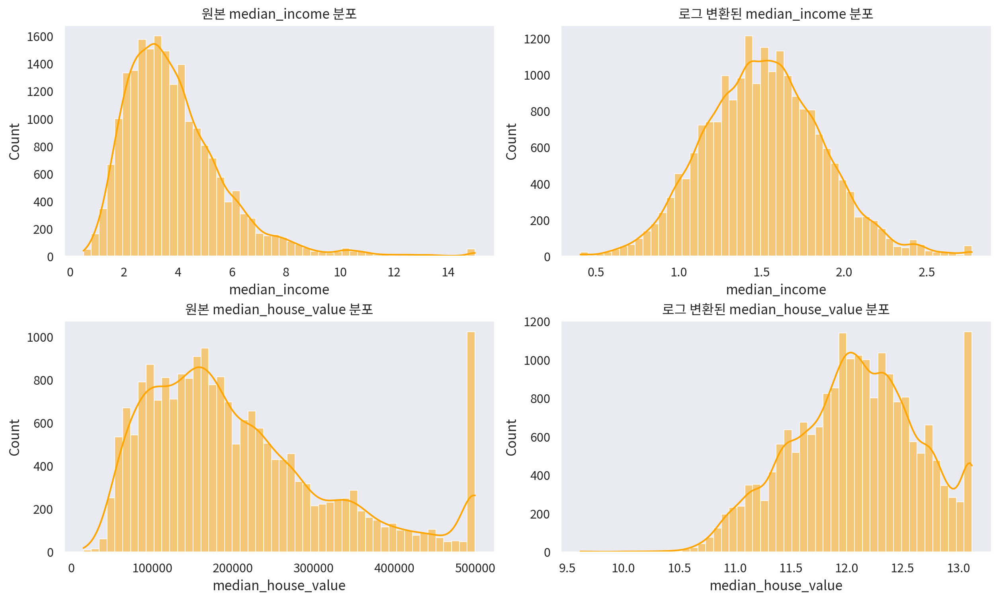

In [430]:
# 주요 변수에 로그 변환을 적용해 전 후 분포를 나란히 비교 - median_income, median_house_value
# 여기서 중요한점은 군집마다 하는 것이 아닌 전체 데이터에 적용하여 비교하는 것임
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 1500             #그래프 세로 크기
rows = 2                    #도화지의 행 수
cols = 2                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)
# 2) 그래프 그리기 -> seaborn 사용
sb.histplot(data=df, x='median_income', bins=50, kde=True, color='orange', ax=ax[0,0])
sb.histplot(data=np.log1p(df['median_income']), bins=50, kde=True, color='orange', ax=ax[0,1])
sb.histplot(data=df, x='median_house_value', bins=50, kde=True, color='orange', ax=ax[1,0])
sb.histplot(data=np.log1p(df['median_house_value']), bins=50, kde=True, color='orange', ax=ax[1,1])
# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용
ax[0,0].set_title('원본 median_income 분포', fontsize=12)
ax[0,1].set_title('로그 변환된 median_income 분포', fontsize=12)
ax[1,0].set_title('원본 median_house_value 분포', fontsize=12)
ax[1,1].set_title('로그 변환된 median_house_value 분포', fontsize=12)
# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

- 원본에서 median_income은 오른쪽으로 긴 꼬리를 가진 비대칭 분포이며, 일부 고소득 관측치가 분포의 평균과 분산을 크게 증가시키고 있었음
    - 변환 후 분포의 대칭성이 크게 개선되었으며 중앙값을 기준으로 좌우 대칭이 맞음
- 원본에서 median_house_value는 오른쪽 꼬리가 매우 길었으며 50만 달러 상한선에 값이 집중되어 있어 분포를 왜곡할 수 있음
    - 오른쪽 꼬리가 완화되었으며 상한선 값의 영향이 상대적으로 줄어들었음
- 로그 변환이 없으면 빠지는 함정?
    - 소수의 고가 주택 및 고소득 관측치가 너무 큰 영향을 주어 제대로 된 분석이 안될 것임.
4. 그래서 선택기준:
> - 로그변환으로 분포의 편향, 왜도/첨도, 정규성이 개선되는 변수: `total_rooms, total_bedrooms, population, households, median_income`, `median_house_value`는 로그변환 시키는 걸로~

### 미션 4. 지리적 위치는 정말 중요할까?
- 1. 위도(Latitude)와 경도(Longitude)를 활용한 지리적 시각화 수행
- 2. 산점도(경도 X 위도, 점의 색상 = median_house_value)를 그려 주택 가격의 지리적 불평등 관찰
- 3. 어느 지역이 비싼가?, 가격 차이가 얼마나 뚜렷한가? 를 데이터 기반으로 설명
- 4. 위도/경도가 개별 변수보다 지역 표상(Proxy,대리자)이라는 점을 인식하고, 이것이 회귀에 주는 의미를 논의

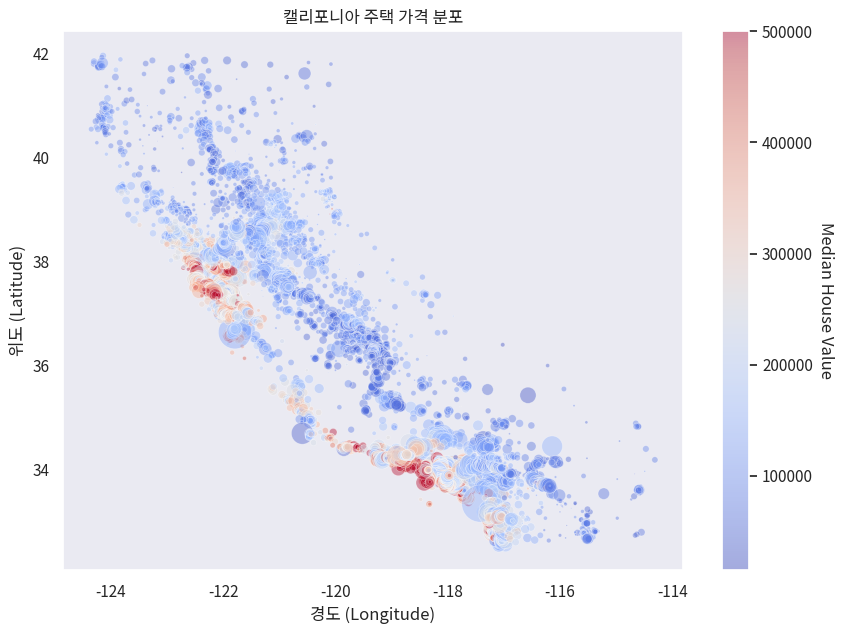

In [431]:
plt.figure(figsize=(10, 7))

scatter = plt.scatter(data=df, x='longitude', y='latitude',
                      alpha=0.4, 
                      s=df['population']/50,   
                      c=df['median_house_value'], 
                      cmap='coolwarm',edgecolors='w', linewidth=0.5)

cbar = plt.colorbar(scatter)
cbar.set_label('Median House Value', rotation=270, labelpad=15)

plt.xlabel('경도 (Longitude)')
plt.ylabel('위도 (Latitude)')
plt.title('캘리포니아 주택 가격 분포')
plt.show()

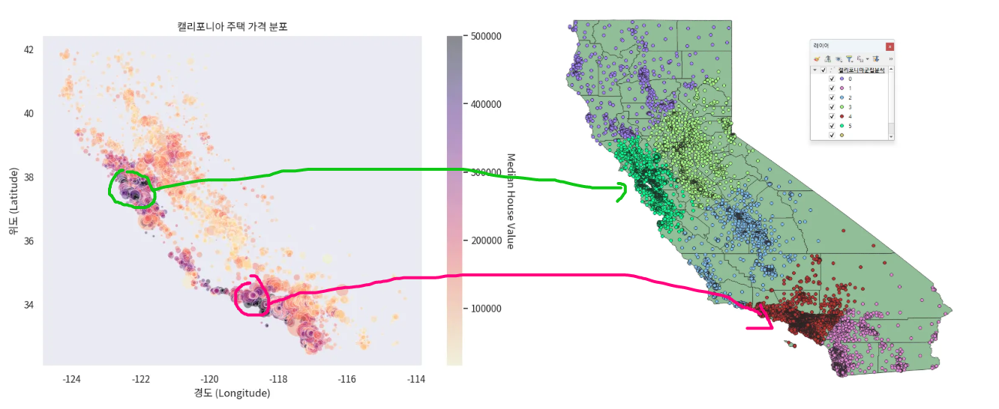

- 클러스터 5번, 4번에 해당하는 지역이 고가의 주택들이 모여있는 곳으로 판별됨
    - 해안, 대도시에 해당하는 지역
    - 고가 주택은 해안 및 대도시 인접 군집에 집중되어 있는 것을 확인할 수 있으며 지리적 위치가 주택 가격과 매우 크게 작용한다는 것을 알 수 있다.
    - 위의 근거는 군집으로 나눠야하는 이유로써 사용될 수 있음
- 위도와 경도 데이터는 직접 쓰는 것이 아닌 지역의 요인들을 담고있는 대리 변수라고 볼 수 있음.
    - 간접적으로 지역적 요인을 반영하는 대리 변수!
    - 왜 비싸? 라기보단 어디가 비싸? 를 대답하게 해주는 변수라고 할 수 있음


### 미션 5. 소득은 정말로 집값을 결정할까?
- 1. median_income(중위 가구 소득)에 따라 median_house_value가 다른지 시각화하고, 선형성과 강도를 평가함
- 2. 산점도와 함께 회귀선을 그려 관계의 형태를 관찰
- 3. 상관계수(Pearson)를 계산하고 정말로 소득이 집값의 주 결정 요인인가?를 비판적으로 생각
- 4. 소득 수준에 따른 주택가격 불평등 문제를 해석 관점에서 논의

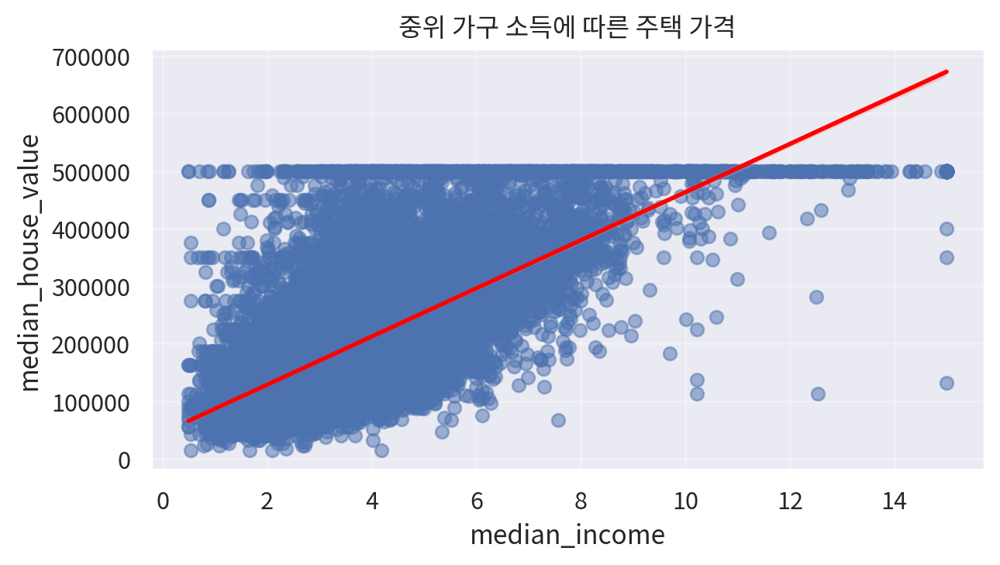

In [432]:
width_px = 1280
height_px = 720
rows = 1
cols = 1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize=figsize, dpi=my_dpi)

sb.regplot(data=df, x='median_income', y='median_house_value',
           scatter_kws={'alpha':0.5},
           line_kws={'color':'red', 'linewidth':2})
plt.title('중위 가구 소득에 따른 주택 가격')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
plt.close()

50만에 상한선이 걸려있으니까.. log 치환한 걸로 다시 시도
- 소득 증가에 따라 주택 가격이 상승하긴 하는데 동일한 소득 수준에서 주택 가격의 분산이 큼(위아래로 많이 퍼져있는 것을 알 수 있음)
- 소득이 높아져도 집값은 다른 요인이 많을 것임 (50만 달러 상한선에서의 수평선이 존재하기 때문)

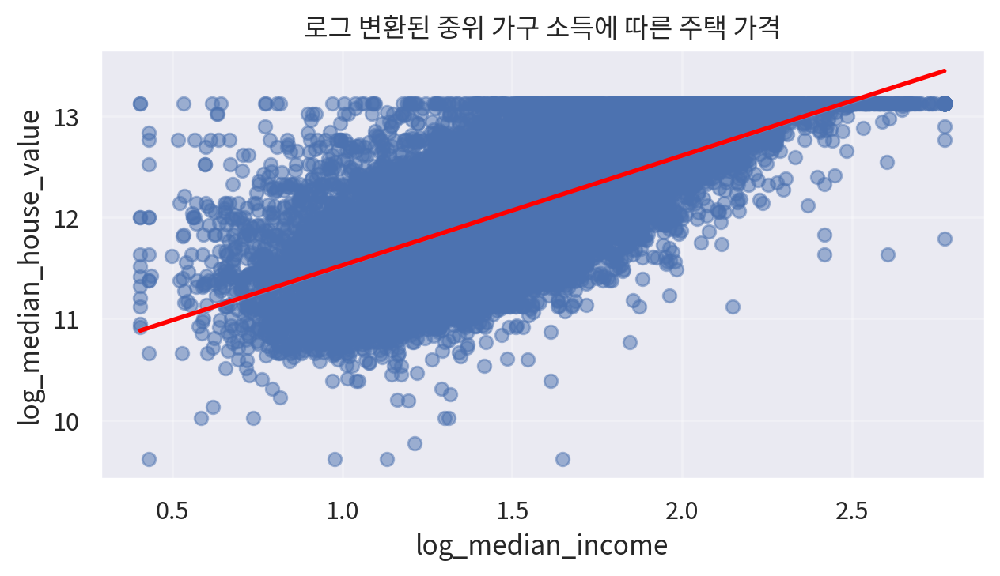

In [433]:
#median_income, median_house_value를 로그 변환한 뒤 산점도와 회귀선 그리기
df2= df.copy()
df2['log_median_income'] = np.log1p(df2['median_income'])
df2['log_median_house_value'] = np.log1p(df2['median_house_value'])
df2['log_total_rooms'] = np.log1p(df2['total_rooms'])
df2['log_total_bedrooms'] = np.log1p(df2['total_bedrooms'])
df2['log_population'] = np.log1p(df2['population'])
df2['log_households'] = np.log1p(df2['households'])
width_px = 1280
height_px = 720
rows = 1
cols = 1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize=figsize, dpi=my_dpi)
sb.regplot(data=df2, x='log_median_income', y='log_median_house_value',
           scatter_kws={'alpha':0.5},
           line_kws={'color':'red', 'linewidth':2})
plt.title('로그 변환된 중위 가구 소득에 따른 주택 가격')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
plt.close()

- 원본으로 그린 산점도보다는 선형적으로 나타나지만, 극단값의 영향이 완화되어 생긴 현상
    - 비율로 계산할 수 있다는 것에 의의를 두어야함
    - (소득이 올라가니까 집값도 ~%로 올라가는구나 정도로 해석)

In [434]:
x = df2['log_median_income']
y = df2['log_median_house_value']

X = sm.add_constant(x)
model = sm.OLS(y, X).fit()
reset = linear_reset(model, power=2, use_f=True)

#선형성 적합 여부(True=적합, False=부적합)
linearity_ok = reset.pvalue > 0.05
print(f"Ramsey RESET Test : {'선형성 적합' if linearity_ok else '선형성 위반'} (p-value: {reset.pvalue:.4f})")


Ramsey RESET Test : 선형성 위반 (p-value: 0.0000)


- 여기서 의미하는 선형성 위반은 소득이 집값을 설명하지 못한다는 것이 아니라 소득과 주택 가격 간의 관계가 다른 지역 효과 및 여러 요인의 영향을 함께 받기 때문이라고 생각해야함.

In [435]:
import pandas as pd
data = df2[['log_median_income','log_median_house_value']]
results = {}

for col in data.columns:
    temp = data[col].dropna()

    #왜도 계산
    skew_original = temp.skew()

    # Z-scoore 기반 이상치 탐지 (|z| > 3)
    z_scores = zscore(temp)
    outlier_count = int(np.sum(np.abs(z_scores) > 3))

    #로그 변환 후 왜도 계산(음수 대비 + 1)
    data_log = np.log1p(temp - temp.min() + 1)
    skew_log = data_log.skew()

    #로그 변환 필요 여부 판단
    need_log = (abs(skew_original) > 1) and (abs(skew_log) < abs(skew_original))

    results[col] = {
        'original_skew': skew_original,
        'log_skew': skew_log,
        'outliers(|z| > 3)': outlier_count,
        'log_recommend': need_log
    }

results_df = pd.DataFrame(results).T
display(results_df)

# 이상치 점검 결과
outlier_flag = len(results_df[results_df['outliers(|z| > 3)'] >0])>0
if outlier_flag:
    print("이상치가 발견되어 스피어만 상관계수 사용")
else:
    print("이상치가 발견되지 않아 피어슨 상관계수 사용")

,original_skew,log_skew,outliers(|z| > 3),log_recommend
log_median_income,0.224597,-0.146669,122,False
log_median_house_value,-0.172571,-0.507881,16,False


이상치가 발견되어 스피어만 상관계수 사용


In [436]:
spearman_r, spearman_p = spearmanr(df2['log_median_income'], df2['log_median_house_value'])
"staticstic: {0:.3f}, p-value: {1:.3f}, {2}가설 채택".format(spearman_r, spearman_p, "대립" if spearman_p <= 0.05 else "귀무")

'staticstic: 0.677, p-value: 0.000, 대립가설 채택'

- 귀무가설 : 소득은 집값의 주결정요인이 아니다.
- 대립가설 : 소득은 집값의 주결정요인이다.
    - 대립가설 채택
- 소득 수준에 따른 주택가격 불평등 문제를 해석 관점에서 논의하세요
    - 소득이 높지 않은 가구의 주택 가격이 비싼 이유에 대해 알아볼 필요가 있음.
    - 소득이 오를수록 주택 가격도 비싸지는 것으로 보아 주 요인이라고는 볼 수 있음.
    - 저소득 구간에서 고가의 주택이 몇몇 보이지만 대부분 저가의 주택으로 구성됨
        - 이는 선택할 수 있는 주택 가격의 범위가 제한적이라고 볼 수 있음.
    - 고소득 구간으로 갈 수록 주거 선택지가 많아짐
        - 양극화가 일어남
    - 같은 소득이지만 주택 가격의 차이가 많이 남
        - 소득 수준은 주택 가격의 주된 요인이라고 할 수 있지만, 다른 요인의 유무가 주택 가격 형성에 기여를 하고 있다는 것을 알 수 있음.

### 미션 6. 주택 특성은 소수일까, 다수일까?
- 1. total_rooms, total_bedrooms, households, median_house_age, population의 분포를 확인
- 2. 각 변수별로 생존자(정상) vs 이상치를 구분하고, 회귀에 미칠 영향을 평가
- 3. 일부 극단값(예: 매우 작은 방의 수, 매우 높은 인구밀도)이 전체 분석을 왜곡할 가능성을 검토

- 1990년대 캘리포니아 주택을 나타내는 변수들은 전반적으로 오른쪽으로 꼬리가 나타나며 소수의 극단적인 관측치를 포함하고 있음. 하지만 이러한 극단값들은 측정 오류보다는 지역 규모 및 주거 형태의 차이에서 발생한 구조적 특성으로 판단됨

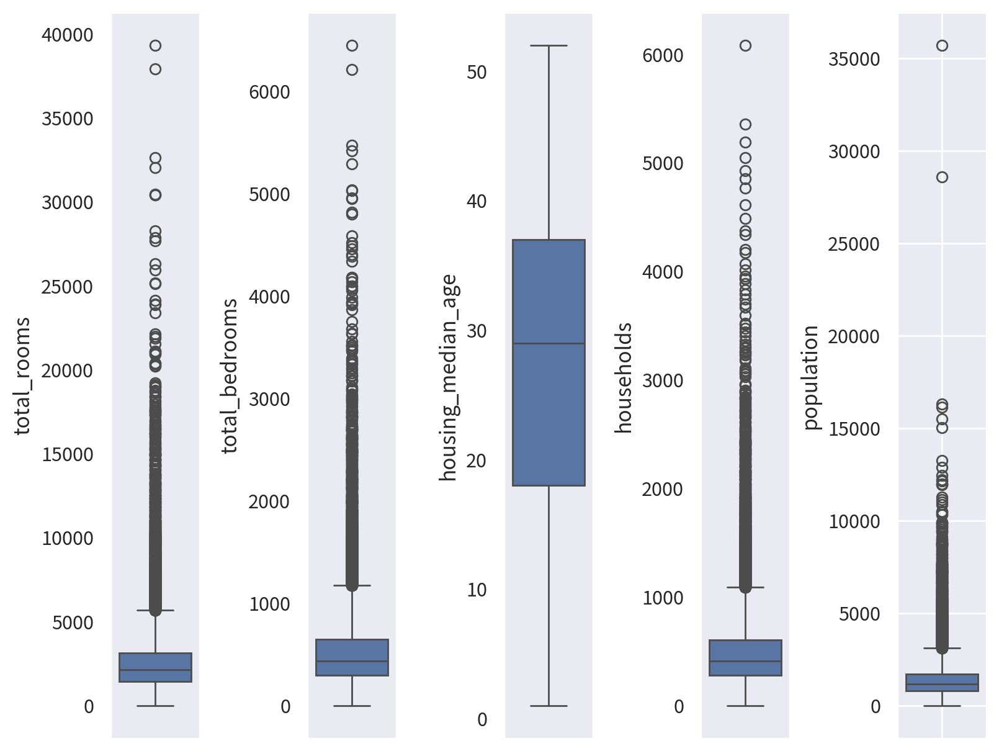

In [437]:
# 주요 변수의 이상치를 확인하기 위해서 최종 데이터 프레임(로그 적용)이 아닌 df_cleaned를 사용
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 1600             #그래프 가로 크기
height_px = 1200             #그래프 세로 크기
rows = 1                    #도화지의 행 수
cols = 5                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.boxplot(data=df2['total_rooms'],orient='v',ax=ax[0])
sb.boxplot(data=df2['total_bedrooms'],orient='v',ax=ax[1])
sb.boxplot(data=df2['housing_median_age'],orient='v',ax=ax[2])
sb.boxplot(data=df2['households'],orient='v',ax=ax[3])
sb.boxplot(data=df2['population'],orient='v',ax=ax[4])
# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용
plt.grid(True)

# 4) 출력
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

- total rooms : 극단값은 대규모 주거 단지 또는 인구 밀도가 높은 지역의 특성을 반영한 값으로 보임
- total_bedrooms : 지역 규모의 영향이 상당히 강한 변수, 소수의 대규모 주거 지역에서 높은 값이 나타남
- housing_median_age : 다른 변수들에 비해 안정적인 분포, 52라는 상한값이 존재함
- households: 극단값은 대도시 및 고밀도 지역을 반영(가구수를 의미하는 변수이므로), 지역 규모 차이에 따른 분포로 판단됨
- population : 지역 간 인구 규모 차이를 직접적으로 반영 -> 극단값은 분석 대상의 핵심 특성 중 유지하기로 결정

- 해당 프로젝트에 사용된 변수들은 관측치가 낮은 구간에 밀집된 다수형 분포를 가지며 소수의 극단값이 분포의 꼬리를 형성하는 구조임

- 결론 : 지역 규모와 주거 형태를 고려하여 극단값을 제거하지 않고 유지할 것임.

- 추가로 주택 특성은 끼리끼리 새로운 변수로 묶어서 사용할 수 있음


### 미션 7. 소득과 다른 특성은 독립적일까?
- 1. 주요 연속형 변수 간 상관행렬(median_income, housing_median_age, total_rooms, total_bedrooms, population, households,위도,경도)을 계산
- 2. 상관행렬을 히트맵으로 시각화하고, Variance Inflation Factor(VIF)로 다중공선성을 점검
- 3. 높은 상관이 보이는 변수 쌍(예: total_rooms vs total_bedrooms)에 대해, 이것이 모델 설계에 주는 함의를 논의
- 4. 공선성 완화 전략을 고민하세요 : 변수 제거, 결합지표 설계 등 "해석 우선" 관점에서 선택

In [438]:
df3 = df2.drop(columns=['ocean_proximity','CLUSTER_ID','median_house_value','median_income','log_median_house_value','total_rooms','total_bedrooms','population','households'])
skew_outlier={}
for col in df3.columns:
    temp = df3[col].dropna()
    skew_original = temp.skew()
    z_scores = zscore(temp)
    outlier_count = int(np.sum(np.abs(z_scores) > 3))

    data_log = np.log1p(temp - temp.min() + 1)
    skew_log = data_log.skew()

    skew_outlier[col]= {
        'original_skew': skew_original,
        # 'log_skew': skew_log,
        # df_final이 이미 로그 변환된 데이터 프레임이므로 log_skew는 불필요
        'outliers(|z| > 3)': outlier_count
    }
skew_outlier_df=DataFrame(skew_outlier).T
skew_outlier_df

,original_skew,outliers(|z| > 3)
longitude,-0.296141,0.0
latitude,0.464934,0.0
housing_median_age,0.061605,0.0
log_median_income,0.224597,122.0
log_total_rooms,-1.081242,311.0
log_total_bedrooms,-0.992813,305.0
log_population,-1.048037,307.0
log_households,-1.056801,316.0


In [439]:
rows = []

for a, b in combinations(df3.columns,2):
    x = df3[a]
    y = df3[b]

    # [1] 선형성 확인(Ramsey RESET)
    X = sm.add_constant(x)
    model = sm.OLS(y, X).fit()
    reset = linear_reset(model, power=2, use_f=True)
    linearity_ok = reset.pvalue>0.05

    # [2] 이상치 존재 여부(|z| > 3 기준)
    a_flag = skew_outlier_df.loc[a, 'outliers(|z| > 3)'] >0
    b_flag = skew_outlier_df.loc[b, 'outliers(|z| > 3)'] >0
    outlier_flag = a_flag or b_flag

    # [3] 상관계수 선택 및 계산
    if linearity_ok and not outlier_flag:
        chosen = 'pearson'
        corr, pval = pearsonr(x,y)
    else:
        chosen = 'spearman'
        corr,pval = spearmanr(x,y)

    # [4] 유의성 판단(p <= 0.05)
    significant = pval <= 0.05

    # [5] 상관 강도 계산
    abs_r = abs(corr)
    if abs_r >= 0.80:
        strength = 'Very strong'
    elif abs_r >= 0.60:
        strength = 'Strong'
    elif abs_r >= 0.40:
        strength = 'Medium'
    elif abs_r >= 0.20:
        strength = 'Weak'
    else:
        strength = 'Very weak'
    
    # [6] 행 추가
    rows.append({
        "var_a": a,
        "var_b": b,
        "linearity": linearity_ok,
        "outlier_flag": outlier_flag,
        "chosen": chosen,
        "corr": corr,
        "pval": pval,
        "significant": significant,
        "strength": strength
    })

summary_df = DataFrame(rows)
summary_df

,var_a,var_b,linearity,outlier_flag,chosen,corr,pval,significant,strength
0,longitude,latitude,False,False,spearman,-0.878908,0.000000e+00,True,Very strong
1,longitude,housing_median_age,False,False,spearman,-0.151840,1.205253e-105,True,Very weak
2,longitude,log_median_income,False,True,spearman,-0.010225,1.438699e-01,False,Very weak
3,longitude,log_total_rooms,False,True,spearman,0.041203,3.817272e-09,True,Very weak
4,longitude,log_total_bedrooms,False,True,spearman,0.063879,6.248559e-20,True,Very weak
5,longitude,log_population,False,True,spearman,0.124223,4.523354e-71,True,Very weak
6,longitude,log_households,True,True,spearman,0.060889,3.005110e-18,True,Very weak
7,latitude,housing_median_age,False,False,spearman,0.032984,2.406680e-06,True,Very weak
8,latitude,log_median_income,False,True,spearman,-0.088092,1.723795e-36,True,Very weak
9,latitude,log_total_rooms,True,True,spearman,-0.019288,5.829420e-03,True,Very weak


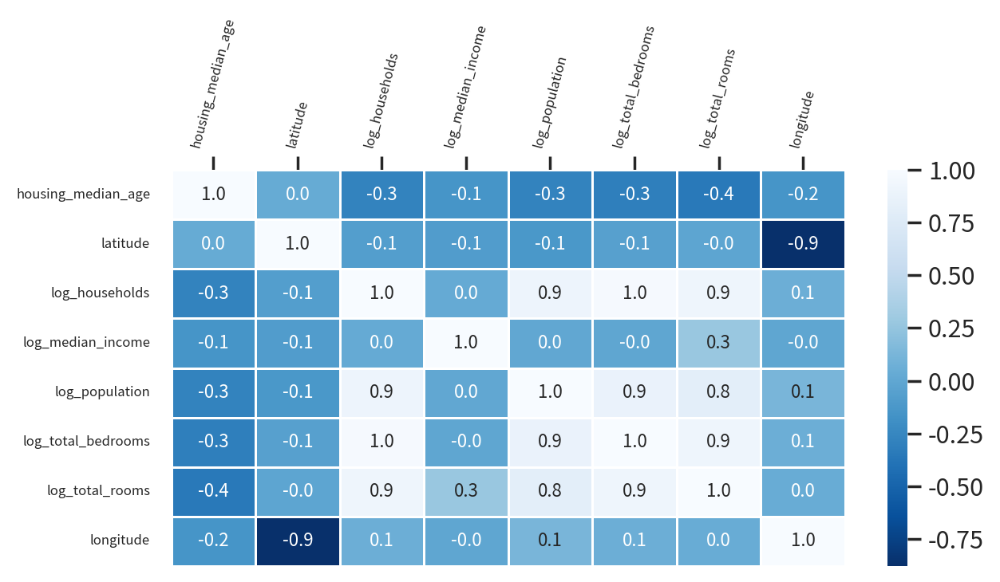

In [440]:
# 1) 등장하는 모든 변수 목록 추출
vars = sorted(set(summary_df['var_a']).union(summary_df['var_b']))

# 2) 빈 상관행렬 생성 (NaN으로 초기화)
corr_matrix = DataFrame(np.nan, index=vars, columns=vars)

# 3) summary_df 내용을 반영하여 대칭 행렬 채우기
for _, row in summary_df.iterrows():
    a, b, r = row['var_a'], row['var_b'], row['corr']
    corr_matrix.loc[a, b] = r
    corr_matrix.loc[b, a] = r # 대칭

# 4) 대각선 (diagonal)을 1로 설정
np.fill_diagonal(corr_matrix.values, 1)

# corr_matrix
width_px = 1280
height_px = 720
rows = 1
cols = 1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig,ax = plt.subplots(rows, cols, figsize=figsize, dpi=my_dpi)

sb.heatmap(data=corr_matrix, annot=True, fmt='0.1f', linewidth=0.5, cmap='Blues_r', annot_kws={'size':8})

ax.xaxis.tick_top()
ax.xaxis.set_tick_params(rotation=75, labelsize=6)
ax.yaxis.set_tick_params(labelsize=6)
plt.tight_layout()
plt.show()
plt.close()


- 연속형 변수 간 상관행렬을 확인한 결과
    - 일부 주택 규모 및 인구 관련 변수들 사이에는 매우 높은 양의 상관 관계가 나타남
        - (population, total_bedrooms, total_rooms)
        - 해당 변수들이 동일한 구조적 정보를 중복적으로 반영함을 알 수 있음
    - median_income의 경우 다른 주택 특성 및 변수들과 상대적으로 낮은 상관관계를 보여 독립적으로 설명할 수 있음을 알 수 있음
    - housing_median_age는 주택 규모 변수들과 약한 음의 상관관계를 보이며, 지역 개발 시기와 주거 형태의 차이를 반영하는 변수로 해석할 수 있음.
    - 위도와 경도는 캘리포니아의 공간적 형태를 함께 표현하고 있는 변수로 볼 수 있음
- 이후 회귀 분석에서는 다중공선성을 해결하기 위해 변수를 선택하거나 제거할 필요가 있음.

### 미션 8. 어떤 변수가 가격과 가장 가까울까?
- 1. median_house_value와 연속형 변수들의 상관을 계산
- 2. Pearson과 Spearman을 모두 계산하고, 비교해 무엇이 더 적합한지 이유 적기
- 3. 각 변수의 관계를 물리,사회적 언어로 해석하고(예: 소득이 높을수록 비싼 주택 지역, 오래된 주택은 더 저렴), 인과성을 말할 수 있는지 비판적으로 평가

In [441]:
#median_house_value와 연속형 변수들간의 상관 계산
df4 = df2.copy()
df4.drop(columns=['ocean_proximity','CLUSTER_ID','median_house_value','median_income','total_rooms','total_bedrooms','population','households'], inplace=True)
for col in df4.columns:
    if col == 'log_median_house_value' :
        continue

    x = df4[col]
    y = df4['log_median_house_value']
    spearman_r, spearman_p = spearmanr(x,y)
    print(f"{col}와 log_median_house_value의 스피어만 상관계수: {spearman_r:.3f}, p-value: {spearman_p:.3f}, {'대립' if spearman_p <= 0.05 else '귀무'}가설 채택")

longitude와 log_median_house_value의 스피어만 상관계수: -0.070, p-value: 0.000, 대립가설 채택
latitude와 log_median_house_value의 스피어만 상관계수: -0.166, p-value: 0.000, 대립가설 채택
housing_median_age와 log_median_house_value의 스피어만 상관계수: 0.075, p-value: 0.000, 대립가설 채택
log_median_income와 log_median_house_value의 스피어만 상관계수: 0.677, p-value: 0.000, 대립가설 채택
log_total_rooms와 log_median_house_value의 스피어만 상관계수: 0.205, p-value: 0.000, 대립가설 채택
log_total_bedrooms와 log_median_house_value의 스피어만 상관계수: 0.086, p-value: 0.000, 대립가설 채택
log_population와 log_median_house_value의 스피어만 상관계수: 0.003, p-value: 0.681, 귀무가설 채택
log_households와 log_median_house_value의 스피어만 상관계수: 0.112, p-value: 0.000, 대립가설 채택


- median_income이 매우 강한 양의 상관을 보임 -> 가장 가까운 변수
    - 소득 수준이 높은 지역일수록 고가 주택이 형성될 확률이 올라감
- total_rooms는 0.2로 약한 양의 상관을 보임
    - 단독 요인으로서의 설명을 하기에는 부족함
- households는 0.112로 약한 양의 상관
    - 가구 수가 많은 지역일수록 주택 가격이 높은 것을 확인하였지만 영향력이 있지 않음
- housing_median_age - 매우 약한 양의 상관 (0.075)
    - 오래된 주택이 반드시 저렴한 것은 아님 -> 지역 특성에 따라 노후 주택의 가치가 다르게 형성됨
- latitude/longitude - 약한 음의 상관 
    - 개별 좌표로 보기보다는 함께 사용하여 지리적 위치에 따른 지역 효과(대리변수)를 반영해야함
- total_bedrooms - 매우 약한 상관 (0.086)
    - 침실 수는 직접적인 연관성이 없다고 볼 수 있으며 다른 주택 규모 변수와 중복된 정보를 제공하는것을 확인함
- population - 유의하지 않은 변수
    - 인구 규모는 주택 가격과 통계적으로 유의미하지 않은 상관관계를 보이며 인구가 많다고 해서 주택 가격이 높다고 단정할 수 없다.

### 미션 9. 상관관계는 곧 원인일까?
- 상관이 높다 != 원인이다
- 예: 위도/경도와 주택가격의 높은 상관이 정말 위치 자체가 가격을 결정하는가, 아니면 위치가 소득 수준이 높은 지역을 나타내는 대리 변수인가?
- 데이터 수집 시점(1990년), 지역 편향, 측정 누락(학군 질, 교통 접근성, 범죄율 등)이 결론에 주는 한계를 서술하세요.

- 소득이 집값과 강한 상관관계를 보인것은 사실임. 계수가 0.677이라고는 하지만, 소득만이 집값을 결정하는 것은 아님. 소득이 높기 때문에 집값이 높아야만해!! 는 아닌 것을 알아야 하고, 위도와 경도 역시 그 자체로 집 값이 정해지는 것이 아니라 고소득층이 해당 위도 경도에 밀집해있다는 뜻으로 받아들여야함.
- 데이터 수집 시점인 1990년은 분석 시점인 현재(2025년)와는 35년이라는 시간 간극이 존재함. 이는 현 시장에 반영하기엔 노후된 데이터라고 생각이 됨. 또한, 집 값을 결정하는 요인이라고 하기엔 학군 질, 교통 접근성, 범죄율 등 고려해야하는 요인이 수없이도 많음. 빠진 데이터가 많을 뿐더러 캘리포니아만의 데이터이기 때문에 **1990년대의 캘리포니아 집값을 결정했던 요인** 이라고 했을 때만 유의미한 데이터 분석이라고 볼 수 있음.

### 미션 10. 주택 가격을 설명하는 회귀모형 설계
- median_house_value(또는 변환값)를 종속변수로 하는 다중선형회귀(OLS)를 설계한다.
- 변수 선택,스케일/변환 이유를 설명하고 싶어서 관점으로 글로 남긴다.
- statsmodels의 OLS를 사용하여 회귀모형을 적합하고, 모형 요약(summary)을 통해 계수, p-value, 신뢰구간을 확인한다.
- 적합도 지표를 확인한다: R^2/Adj. R^2, RMSE/MAE를 계산하고 1990년 주택 가격 맥락에서 해석한다.
- 공선성은 상관행렬,VIF로 점검하고, 필요 시 변수 제거,결합지표로 완화한다.

In [442]:
def ols_report(tbl, data):
    """
    OLS summary(tbl)와 데이터프레임(data)을 받아 회귀계수 표(rdf),
    모델 적합도 요약(result_report), 모형 보고 문장(model_report),
    변수별 보고 리스트(variable_reports)를 반환한다.

    Parameters
    ----------
    tbl : statsmodels.iolib.summary.Summary
        sm.OLS(...).fit().summary()의 결과로 생성된 summary 객체
    data : pandas.DataFrame
    종속변수와 독립변수를 모두 포함한 데이터프레임.

    Returns
    -------
    tuple
        (회귀계수 DataFrame, 적합도 요약 문자열, 모형 보고 문자열, 변수별 보고 리스트)
    """
    #독립변수 이름(상수항 제외)
    xnames = [n for n in fit.model.exog_names if n != 'const']

    #독립변수 부분 데이터(VIF 계산용)
    indi_df = data.filter(xnames).copy()
    indi_df.insert(0, 'const', 1.0)

    #독립변수 결과를 누적
    variables = []
    for i, v in enumerate(tbl.tables[1].data):
        #한 행의 변수명 추출 후 목록에 있는지 확인
        name = v[0].strip()
        if name not in xnames:
            continue

        #VIF 계산을 위해 열 인덱스 조회
        j = list(indi_df.columns).index(name)
        vif = variance_inflation_factor(indi_df.values, j)

        #유의확률과 별표 표시 함수
        p = float(v[4].strip())
        stars = lambda p:(
            "***" if p < 0.001 else
            "**" if p < 0.01 else
            "*" if p < 0.05 else
            ""
        )

        #한 변수에 대한 보고 정보 추가
        variables.append({
            "종속변수": yname,
            "독립변수": name,
            "B": v[1].strip(),
            "표준오차": v[2].strip(),
            "Beta": float(fit.params[name]) * data[name].std() / data[yname].std(ddof=1),
            "t": "%s%s" %(v[3].strip(), stars(p)),
            "p-value": p,
            "공차" : 1/vif,
            "vif": vif
        })
    rdf = DataFrame(variables)

    #summary 표에서 적합도 정보를 key-value로 추출

    result_dict={}
    for i in [0,2]:
        for item in tbl.tables[i].data:
            n = len(item)
            for i in range(0,n,2):
                key = item[i].strip()[:-1]
                value = item[i+1].strip()
                if not key or not value:
                    continue

                result_dict[key]=value

    #적합도 보고 문자열 생성
    result_report = f"R({result_dict['R-squared']}), R^2({result_dict['Adj. R-squared']}), F({result_dict['F-statistic']}, p={result_dict['Prob (F-statistic)']}), 유의확률({result_dict['Prob (F-statistic)']}), Durbin-Watson({result_dict['Durbin-Watson']})" 

    #모형 보고 문자열 생성
    tpl = "%s에 대하여 %s로 예측하는 회귀분석을 실시한 결과, 이 회귀모형은 통계적으로 %s(F(%s,%s) = %s, p %s 0.05)."
    model_report = tpl %(
        rdf['종속변수'][0],
        ",".join(list(rdf['독립변수'])),
        "유의하다" if float(result_dict['Prob (F-statistic)']) <= 0.05 else "유의하지 않다",
        result_dict['Df Model'],
        result_dict['Df Residuals'],
        result_dict['F-statistic'],
        "<=" if float(result_dict['Prob (F-statistic)']) <= 0.05 else ">"
    )

    #변수별 보고 문장 리스트 구성
    variable_reports = []
    s = "%s의 회귀계수는 %s(p %s 0.05)로, %s에 대하여 %s 예측변인인 것으로 나타났다."

    for i in rdf.index:
        row = rdf.iloc[i]
        variable_reports.append(s %(row['독립변수'],
            row['B'],
            "<=" if float(row['p-value']) < 0.05 else ">",
            row['종속변수'],
            "유의한" if float(row['p-value']) < 0.05 else "유의하지 않은"))
    return rdf, result_report, model_report, variable_reports


In [443]:
df5 = df2[df2['ocean_proximity']!='ISLAND'].copy()
df5= pd.get_dummies(df5, columns=['ocean_proximity'], drop_first=True, dtype=int)
# df5 = pd.get_dummies(df5, columns=['CLUSTER_ID'], drop_first=True, dtype=int)
# df5.info()
df6 = df5.drop(['median_income','median_house_value','latitude','longitude','CLUSTER_ID','households','total_bedrooms','total_rooms','population','log_total_bedrooms','log_households'], axis=1)
df6.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20428 entries, 0 to 20639
Data columns (total 8 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   housing_median_age          20428 non-null  int64  
 1   log_median_income           20428 non-null  float64
 2   log_median_house_value      20428 non-null  float64
 3   log_total_rooms             20428 non-null  float64
 4   log_population              20428 non-null  float64
 5   ocean_proximity_INLAND      20428 non-null  int64  
 6   ocean_proximity_NEAR BAY    20428 non-null  int64  
 7   ocean_proximity_NEAR OCEAN  20428 non-null  int64  
dtypes: float64(4), int64(4)
memory usage: 1.4 MB


In [444]:
yname= 'log_median_house_value'
y = df6[yname]
x = df6.drop([yname], axis=1)

x_input = sm.add_constant(x)
fit = sm.OLS(y, x_input).fit()
tbl1 = fit.summary()
print(tbl1)

rdf,r,m,v = ols_report(tbl1, df6)
display(rdf)
print(m)

                              OLS Regression Results                              
Dep. Variable:     log_median_house_value   R-squared:                       0.654
Model:                                OLS   Adj. R-squared:                  0.653
Method:                     Least Squares   F-statistic:                     5503.
Date:                        금, 16 1 2026   Prob (F-statistic):               0.00
Time:                            14:22:19   Log-Likelihood:                -6645.3
No. Observations:                   20428   AIC:                         1.331e+04
Df Residuals:                       20420   BIC:                         1.337e+04
Df Model:                               7                                         
Covariance Type:                nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

,종속변수,독립변수,B,표준오차,Beta,t,p-value,공차,vif
0,log_median_house_value,housing_median_age,0.0034,0.000,0.075356,16.238***,0.000,0.787749,1.269439
1,log_median_house_value,log_median_income,0.8178,0.008,0.515354,104.070***,0.000,0.691856,1.445387
2,log_median_house_value,log_total_rooms,0.2301,0.007,0.303387,31.419***,0.000,0.181960,5.495713
3,log_median_house_value,log_population,-0.2052,0.007,-0.265415,-28.491***,0.000,0.195491,5.115327
4,log_median_house_value,ocean_proximity_INLAND,-0.5291,0.006,-0.432937,-87.693***,0.000,0.696069,1.436639
5,log_median_house_value,ocean_proximity_NEAR BAY,-0.0020,0.008,-0.001103,-0.245,0.806,0.836959,1.194802
6,log_median_house_value,ocean_proximity_NEAR OCEAN,0.0167,0.007,0.009804,2.223*,0.026,0.872312,1.146378


log_median_house_value에 대하여 housing_median_age,log_median_income,log_total_rooms,log_population,ocean_proximity_INLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN로 예측하는 회귀분석을 실시한 결과, 이 회귀모형은 통계적으로 유의하다(F(7,20420) = 5503., p <= 0.05).


- R^2 : 0.654 = 전체 주택 가격을 65.4% 설명함
- log_median_income : 0.8178
    - 주택 가격과 가장 가까운 변수로 소득이 1% 증가 시 주택 가격 0.82% 증가
- ocean_proximity:
    - INLAND : -0.481 = 내륙 지역은 해안 대비 52% 낮은 가격을 형성함
    - NEAR BAY : -0.020 = BAY근처는 가격이 2%가량 낮게 형성됨 (1H OCEAN 대비)
    - NEAR OCEAN : 0.0167 = 해안은 가격이 1.6%가량 높게 형성됨 (1H OCEAN 대비)
- housing_median_age : 0.0034
    - 주택 나이가 1년 증가 시 주택 가격 0.34% 증가
    - 입지가 좋은 지역의 오래된 주택의 효과가 반영된 거 같음
- > 전체 데이터를 대상으로 회귀분석한 결과 주택 가격을 64% 설명하며 통계적으로 유의하였다. 특히 소득은 가장 주택 가격과 가까운 변수로 소득 증가가 주택 가격 상승과 비례적으로 연결되는 것으로 나타났다. 또한 해안 접근성은 소득과 독립적으로 유의한 가격 상승을 형성하며 내륙 지역은 해안 대비 가격 패널티를 보이고 있다. 이는 캘리포니아 주택 시장에서 가격이 주택의 물리적 특성보다는 지역의 사회경제적, 공간적 특성에 의해 주로 결정됨을 보이고 있다.

In [445]:
reset_res = linear_reset(fit, power=2, use_f=True)
print(f"RESET F-statistic: {reset_res.fvalue:.4f}")
print(f"p-value: {reset_res.pvalue:.4f}")

if reset_res.pvalue < 0.05:
    print("선형성/기능형 위배 가능성이 있음 (5% 유의수준)")
else:
    print("선형성 가정 위배 근거 없음 (5% 유의수준)")

RESET F-statistic: 7.7754
p-value: 0.0053
선형성/기능형 위배 가능성이 있음 (5% 유의수준)


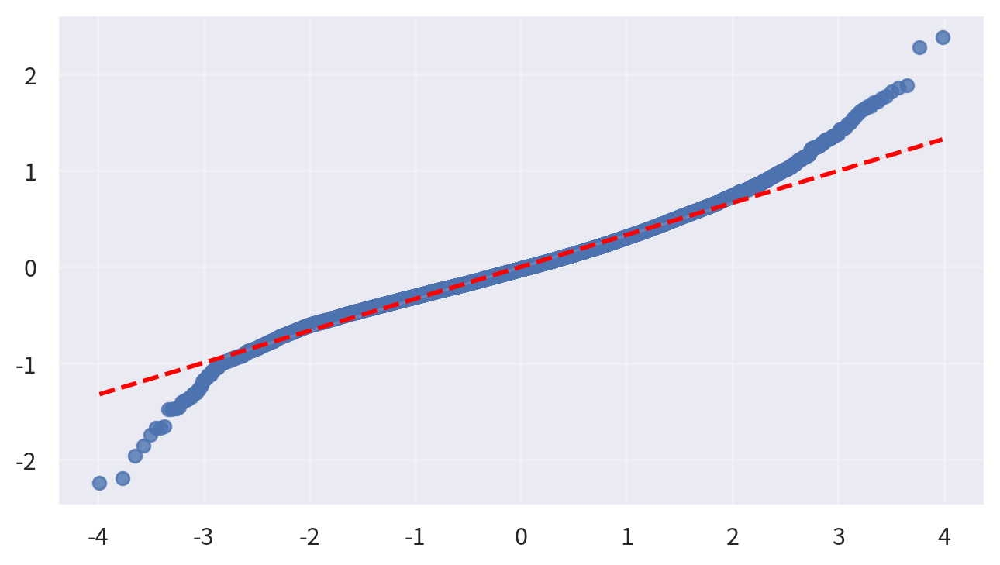

In [446]:
(x, y), _ = probplot(fit.resid)

width_px = 1280
height_px = 720
rows=1
cols=1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, dpi=my_dpi, figsize=figsize)

sb.regplot(x=x, y=y, line_kws={'color':'red',
                               'linestyle':'--',
                               'linewidth':2
                               })

ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
plt.close()

- 저가, 고가에서 이탈이 나타나지만, 이는 다양한 요인을 반영해야함을 알 수 있으며 중앙부에서는 안정적임을 알 수 있다.
- 캘리포니아주 특성상 도심지와 부도심지의 집값의 차이가 심할 것 같다고 생각하여 군집별로 분석이 필요하다고 생각함

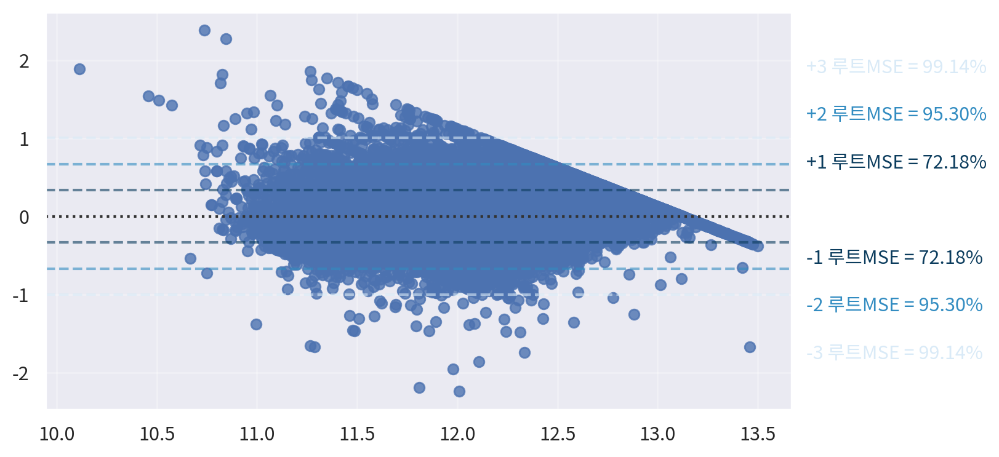

In [447]:
mse_sq = fit.mse_resid
mse_root = np.sqrt(mse_sq)
r = fit.resid       #잔차

r1 = r[(r>-mse_root) & (r<mse_root)].count() / r.count() * 100
r2 = r[(r>-2*mse_root) & (r<2*mse_root)].count() / r.count() * 100
r3 = r[(r>-3*mse_root) & (r<3*mse_root)].count() / r.count() * 100

mse_r = [r1, r2, r3]
colors = ["#0b3C5D", "#328CC1", "#D9EAF7"]

xmax = fit.fittedvalues.max()
ymin = fit.fittedvalues.min()

width_px = 1600
height_px = 720
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(1, 1, dpi=my_dpi, figsize=figsize, constrained_layout=True)

sb.residplot(x=fit.fittedvalues, y=fit.resid)

ax.grid(True, alpha=0.3)

for i, c in enumerate(colors):
    k= i + 1

    y_pos = k*mse_root
    ax.axhline(y=y_pos, color=c, linestyle="--", alpha=0.6)
    ax.axhline(y=-y_pos, color=c, linestyle="--", alpha=0.6)

    ax.text(x=1.02, y=0.5 + 0.12*k,
            s=f"+{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)
    
    ax.text(x=1.02, y=0.5 - 0.12*k,
            s=f"-{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)

plt.show()
plt.close()

- 고가의 주택으로 갈 수록 상한선이 존재함을 알 수 있음 (다양한 요인의 분석이 필요함)

In [448]:
if len(origin) < 5000:
    method = "Shapiro-Wilk"
    stat, p = shapiro(fit.resid)
    print(f"{method} statistic: {stat:.4f}, p-value:{p:.4f}")
    violated=p<0.05
else:
    method = "Anderson-Darling"
    ad_res = anderson(fit.resid, dist='norm')
    crit_levels = ad_res.significance_level.tolist()
    crit_values = ad_res.critical_values.tolist()
    crit_5 = crit_values[crit_levels.index(5.0)] if 5.0 in crit_levels else None
    print(f"{method} statistic: {ad_res.statistic:.4f}, 5% 임계값: {crit_5:.4f}")
    violated = crit_5 is not None and ad_res.statistic > crit_5

print("정규성 가정 위배 가능성이 있음 (5% 유의수준)" if violated else "정규성 가정 위배 근거 없음 (5% 유의수준)")

Anderson-Darling statistic: 65.0100, 5% 임계값: 0.7870
정규성 가정 위배 가능성이 있음 (5% 유의수준)


In [449]:
# Breusch-Pagan Test
names = ['LM statistic', 'LM p-value', 'F Statistic', 'F p-value']
bp_test = het_breuschpagan(fit.resid, fit.model.exog)
bp = DataFrame(bp_test, index=names, columns=['value'])

# p-value는 F p-value를 기준으로 사용
p_bp = bp.loc['F p-value','value']

print(f"Breusch-Pagna statistic: {bp.loc['F Statistic','value']:.3f}, p-value: {p_bp:.3f}")
print(f"{'이분산성 존재(등분산 아님)' if p_bp <= 0.05 else '등분산성 만족'}")

Breusch-Pagna statistic: 185.409, p-value: 0.000
이분산성 존재(등분산 아님)


In [450]:
dw = durbin_watson(fit.resid)

if 1.5<= dw<= 2.5:
    interpretation = "잔차는 독립성을 만족함(자기상관 없음)"
elif dw<1.5:
    interpretation = "잔차는 양(+)의 자기상관이 존재할 가능성 있음(독립성 위반)"
else:
    interpretation = "잔차는 음(-)의 자기상관이 존재할 가능성 있음(독립성 위반)"

print(f"Durbin-Watson: {dw:.3f}")
print(interpretation)

Durbin-Watson: 0.839
잔차는 양(+)의 자기상관이 존재할 가능성 있음(독립성 위반)


In [451]:
m

'log_median_house_value에 대하여 housing_median_age,log_median_income,log_total_rooms,log_population,ocean_proximity_INLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN로 예측하는 회귀분석을 실시한 결과, 이 회귀모형은 통계적으로 유의하다(F(7,20420) = 5503., p <= 0.05).'

In [452]:
print("\n".join(v))

housing_median_age의 회귀계수는 0.0034(p <= 0.05)로, log_median_house_value에 대하여 유의한 예측변인인 것으로 나타났다.
log_median_income의 회귀계수는 0.8178(p <= 0.05)로, log_median_house_value에 대하여 유의한 예측변인인 것으로 나타났다.
log_total_rooms의 회귀계수는 0.2301(p <= 0.05)로, log_median_house_value에 대하여 유의한 예측변인인 것으로 나타났다.
log_population의 회귀계수는 -0.2052(p <= 0.05)로, log_median_house_value에 대하여 유의한 예측변인인 것으로 나타났다.
ocean_proximity_INLAND의 회귀계수는 -0.5291(p <= 0.05)로, log_median_house_value에 대하여 유의한 예측변인인 것으로 나타났다.
ocean_proximity_NEAR BAY의 회귀계수는 -0.0020(p > 0.05)로, log_median_house_value에 대하여 유의하지 않은 예측변인인 것으로 나타났다.
ocean_proximity_NEAR OCEAN의 회귀계수는 0.0167(p <= 0.05)로, log_median_house_value에 대하여 유의한 예측변인인 것으로 나타났다.


- housing_median_age : 오래된 주택 -> 입지가 좋은 경우일 것임 (군집별 해석을 통해 알 수 있음)
- log_median_income : 0.8178로 소득 1% 증가 -> 집 값 0.82% 증가 -> 소득 수준이 가격 형성의 핵심
- log_total_rooms : 0.2301로 방 수가 많을수록 주택 가격 증가율이 높음 (집이 크면 비쌈)
- log_population : 인구가 많을수록 주택 가격은 오히려 낮아짐 (밀도 증가하면 가격이 떨어짐)
- ocean_proximity_INLAND : -0.5291로 내륙은 해안에 비해 유의하게 낮은 수준을 보임
- ocean_proximity_NEAR BAY : -0.0020 해당 지역의 조건을 확인할 필요가 있음 (BAY 근처는 집값이 떨어지는 경향이 있음)
- ocean_proximity_NEAR OCEAN : 0.0469 집 값이 올라가는 경향

### 미션 11. 회귀계수는 무엇을 말해주나?
- 1. 계수(또는 표준화 계수)와 신뢰구간, 방향,크기를 해석
- 2. 소득이 1만달러 늘면 주택 가격이 어떻게 바뀌는가, 주택이 1년 오래될 때마다 가격이 얼마나 떨어지는가 처럼 물리/사회적 의미로 번역
- 3. 변환 변수가 있다면, 변환을 감안한 해석을 명확히 씀
- 4. 표준화 계수(베타)와 비표준화 계수를 병행 제시하고, 단위/변환을 고려한 해석 문장을 명확히 작성
- 5. 위도/경도 계수가 통계적으로 유의하다면, 이것이 지역의 숨은 특성을 어떻게 대리하는지 해석

- housing_median_age : 주택 나이가 1년 지나면 집값이 0.26퍼 상승함
    - 오래된 주택이 보통 도심, 해안, 입지 좋은 곳에 위치해있을 수 있음
- log_median_income : 소득이 1% 증가하면 집값은 0.93% 증가함
    - 소득 증가 -> 집값 증가 할 확률 증가
- ocean_proximity 더미: <1H ocean과의 비교된 계수 
    - INLAND의 경우 <1H ocean지역보다 집값이 48% 낮게 형성이 된다.
    - NEAR BAY의 경우 <1H ocean 지역보다 집값이 4% 높게 형성이 된다.
    - NEAR OCEAN의 경우 <1H OCEAN 지역보다 집값이 4.7% 높게 형성이 된다.

클러스터 포함해서 돌려보기

In [453]:
df7 = df2[df2['ocean_proximity']!='ISLAND'].copy()
df7= pd.get_dummies(df7, columns=['ocean_proximity'], drop_first=True, dtype=int)
df7 = pd.get_dummies(df7, columns=['CLUSTER_ID'], drop_first=True, dtype=int)
# df5.info()
df8 = df7.drop(['median_income','median_house_value','latitude','longitude','households','total_bedrooms','total_rooms','population','log_total_bedrooms','log_households'], axis=1)
df8.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20428 entries, 0 to 20639
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   housing_median_age          20428 non-null  int64  
 1   log_median_income           20428 non-null  float64
 2   log_median_house_value      20428 non-null  float64
 3   log_total_rooms             20428 non-null  float64
 4   log_population              20428 non-null  float64
 5   ocean_proximity_INLAND      20428 non-null  int64  
 6   ocean_proximity_NEAR BAY    20428 non-null  int64  
 7   ocean_proximity_NEAR OCEAN  20428 non-null  int64  
 8   CLUSTER_ID_1                20428 non-null  int64  
 9   CLUSTER_ID_2                20428 non-null  int64  
 10  CLUSTER_ID_3                20428 non-null  int64  
 11  CLUSTER_ID_4                20428 non-null  int64  
 12  CLUSTER_ID_5                20428 non-null  int64  
dtypes: float64(4), int64(9)
memory usage

In [454]:
yname= 'log_median_house_value'
y = df8[yname]
x = df8.drop([yname], axis=1)

x_input = sm.add_constant(x)
fit = sm.OLS(y, x_input).fit()
tbl1 = fit.summary()
print(tbl1)

# rmf,r,m,v = ols_report(tbl1, df8)
# display(rmf)
# print(m)

                              OLS Regression Results                              
Dep. Variable:     log_median_house_value   R-squared:                       0.693
Model:                                OLS   Adj. R-squared:                  0.693
Method:                     Least Squares   F-statistic:                     3841.
Date:                        금, 16 1 2026   Prob (F-statistic):               0.00
Time:                            14:22:20   Log-Likelihood:                -5410.3
No. Observations:                   20428   AIC:                         1.085e+04
Df Residuals:                       20415   BIC:                         1.095e+04
Df Model:                              12                                         
Covariance Type:                nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

소득은 뺄 수 없으니 그냥 진행, NEAR BAY P-VALUE가 0.05 이상이어서 제거하고 진행
- R^2 : 69.3% 설명하고 있음
- 소득은 가장 핵심변수임 -> 소득이 1% 증가 시 집값은 0.71% 상승함
- 방 수가 증가하면 가격이 상승함 (집이 크면 가격이 상승하는 듯)
- 인구 증가율이 크면 집값이 하락함 -> 사람이 많으면 밀도가 증가하여 주거 환경이 저하되는 현상
- 집의 나이가 1년 지날 시 집 값은 0.15%씩 증가함 (입지가 우수한 지역에 오래된 주택이 밀집해 있음)
- 내륙 지역은 해안 인접 지역(1H OCEAN)에 비해 44% 낮게 형성됨
- BAY 근처는 감소하는 경향
- 해안 근처는 해안 인접 지역 대비 집 값이 13% 높게 형성됨
- CLUSTER_ID에 따라 같은 소득, 같은 해안 조건이라도 군집에 따라 가격 수준이 달라짐
    - 0번 클러스터에 비해 모든 클러스터에서 증가하는 모습
    - 특히 5,4번 클러스터는 0번과 비교하였을때 크게 차이가 남
    - 주택 가격은 유사한 지역 특성의 군집 단위로 형성되는 시장을 가짐
- > 군집을 포함하지 않은 모델보다 R^2이 상승하였으며 소득이 가장 중요하지만 같은 소득이라도 위치에 따라 가격 수준이 달라지는 것을 확인할 수 있음.

- 위의 회귀계수에서도 볼 수 있듯이 소득이 가장 핵심변수라면, CLUSTER_ID별로 회귀 모형을 만들어도 똑같이 소득이 가장 가까운 변수일 지 확인
- 지역별로 집값이 비싼 곳이 정말 해안 근처인지, 지역별로도 내륙 지역의 집값이 싸게 형성 되어 있는지, 해안 지역으로 묶인 곳에서는 정말 해안에 가까울 수록 집값이 비싸게 형성되는지 등등 알아볼 것이 정말 많음.
- CLUSTER_ID별 데이터 프레임 형성 후 회귀 모델 만들어보기

In [455]:
reset_res = linear_reset(fit, power=2, use_f=True)
print(f"RESET F-statistic: {reset_res.fvalue:.4f}")
print(f"p-value: {reset_res.pvalue:.4f}")

if reset_res.pvalue < 0.05:
    print("선형성/기능형 위배 가능성이 있음 (5% 유의수준)")
else:
    print("선형성 가정 위배 근거 없음 (5% 유의수준)")

RESET F-statistic: 34.5753
p-value: 0.0000
선형성/기능형 위배 가능성이 있음 (5% 유의수준)


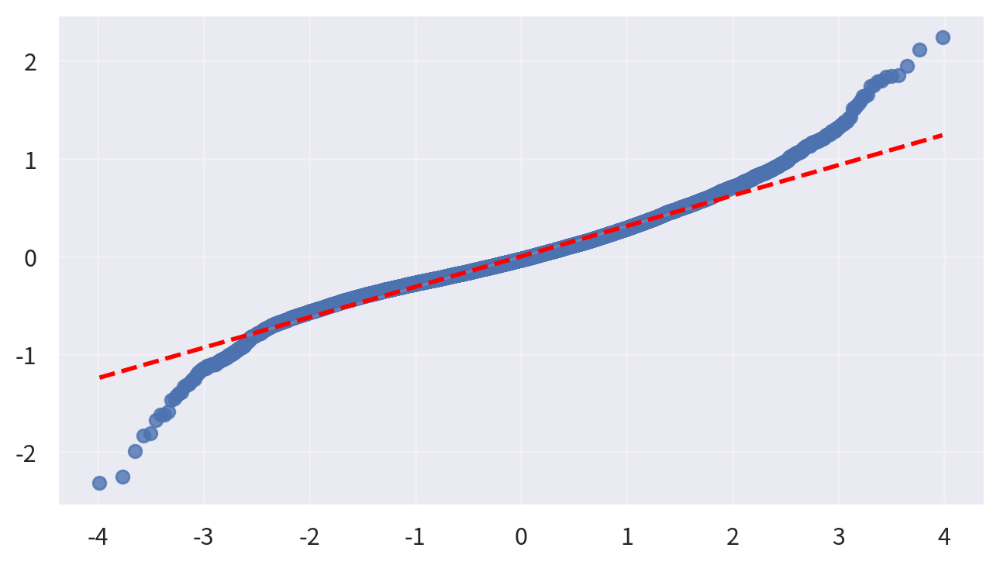

In [456]:
(x, y), _ = probplot(fit.resid)

width_px = 1280
height_px = 720
rows=1
cols=1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, dpi=my_dpi, figsize=figsize)

sb.regplot(x=x, y=y, line_kws={'color':'red',
                               'linestyle':'--',
                               'linewidth':2
                               })

ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
plt.close()

- 위치 정보를 포함하더라도 저가, 고가에서는 이탈이 큰 것을 보아 다양한 요인의 해석이 필요함을 알 수 있음.

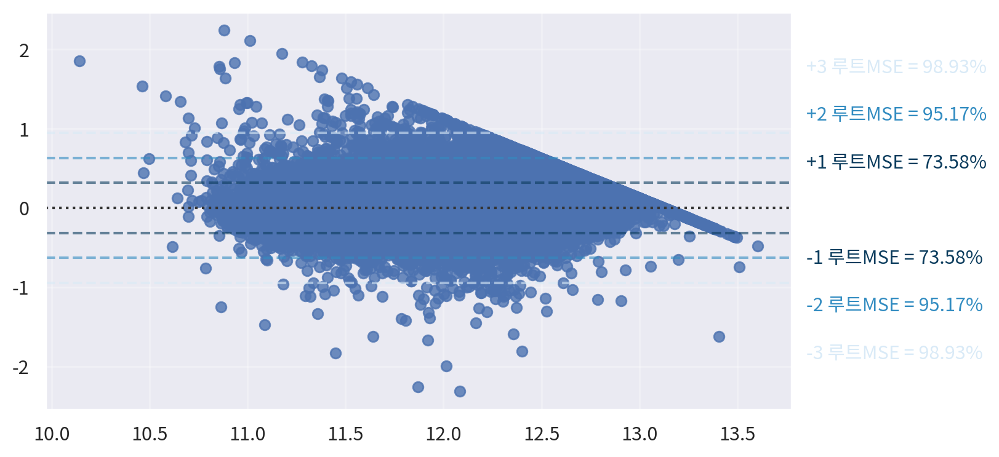

In [457]:
mse_sq = fit.mse_resid
mse_root = np.sqrt(mse_sq)
r = fit.resid       #잔차

r1 = r[(r>-mse_root) & (r<mse_root)].count() / r.count() * 100
r2 = r[(r>-2*mse_root) & (r<2*mse_root)].count() / r.count() * 100
r3 = r[(r>-3*mse_root) & (r<3*mse_root)].count() / r.count() * 100

mse_r = [r1, r2, r3]
colors = ["#0b3C5D", "#328CC1", "#D9EAF7"]

xmax = fit.fittedvalues.max()
ymin = fit.fittedvalues.min()

width_px = 1600
height_px = 720
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(1, 1, dpi=my_dpi, figsize=figsize, constrained_layout=True)

sb.residplot(x=fit.fittedvalues, y=fit.resid)

ax.grid(True, alpha=0.3)

for i, c in enumerate(colors):
    k= i + 1

    y_pos = k*mse_root
    ax.axhline(y=y_pos, color=c, linestyle="--", alpha=0.6)
    ax.axhline(y=-y_pos, color=c, linestyle="--", alpha=0.6)

    ax.text(x=1.02, y=0.5 + 0.12*k,
            s=f"+{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)
    
    ax.text(x=1.02, y=0.5 - 0.12*k,
            s=f"-{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)

plt.show()
plt.close()

- 잔차 또한 상한선이 사라진 것은 아니라서 위치정보를 포함했다고 하여 기존 전체 모델과 달라진 점은 찾을 수 없음

In [458]:
if len(origin) < 5000:
    method = "Shapiro-Wilk"
    stat, p = shapiro(fit.resid)
    print(f"{method} statistic: {stat:.4f}, p-value:{p:.4f}")
    violated=p<0.05
else:
    method = "Anderson-Darling"
    ad_res = anderson(fit.resid, dist='norm')
    crit_levels = ad_res.significance_level.tolist()
    crit_values = ad_res.critical_values.tolist()
    crit_5 = crit_values[crit_levels.index(5.0)] if 5.0 in crit_levels else None
    print(f"{method} statistic: {ad_res.statistic:.4f}, 5% 임계값: {crit_5:.4f}")
    violated = crit_5 is not None and ad_res.statistic > crit_5

print("정규성 가정 위배 가능성이 있음 (5% 유의수준)" if violated else "정규성 가정 위배 근거 없음 (5% 유의수준)")

Anderson-Darling statistic: 110.7908, 5% 임계값: 0.7870
정규성 가정 위배 가능성이 있음 (5% 유의수준)


In [459]:
# Breusch-Pagan Test
names = ['LM statistic', 'LM p-value', 'F Statistic', 'F p-value']
bp_test = het_breuschpagan(fit.resid, fit.model.exog)
bp = DataFrame(bp_test, index=names, columns=['value'])

# p-value는 F p-value를 기준으로 사용
p_bp = bp.loc['F p-value','value']

print(f"Breusch-Pagna statistic: {bp.loc['F Statistic','value']:.3f}, p-value: {p_bp:.3f}")
print(f"{'이분산성 존재(등분산 아님)' if p_bp <= 0.05 else '등분산성 만족'}")

Breusch-Pagna statistic: 101.874, p-value: 0.000
이분산성 존재(등분산 아님)


In [460]:
dw = durbin_watson(fit.resid)

if 1.5<= dw<= 2.5:
    interpretation = "잔차는 독립성을 만족함(자기상관 없음)"
elif dw<1.5:
    interpretation = "잔차는 양(+)의 자기상관이 존재할 가능성 있음(독립성 위반)"
else:
    interpretation = "잔차는 음(-)의 자기상관이 존재할 가능성 있음(독립성 위반)"

print(f"Durbin-Watson: {dw:.3f}")
print(interpretation)

Durbin-Watson: 0.870
잔차는 양(+)의 자기상관이 존재할 가능성 있음(독립성 위반)


#### CLUSTER_ID 0번의 회귀모델 진행


In [461]:
# CLUSTER_ID 0번 군집의 회귀분석
df_cluster_0 = df2[df2['CLUSTER_ID']==0].copy()
df_cluster_0.drop(columns=['CLUSTER_ID'], inplace=True)
df_cluster_0 = df_cluster_0.drop(df_cluster_0[df_cluster_0['ocean_proximity']=='ISLAND'].index)
# print(df_cluster_0['ocean_proximity'].value_counts())
df_cluster_0= pd.get_dummies(df_cluster_0, columns=['ocean_proximity'], drop_first=True, dtype=int)
# df_cluster_0.info()
df_cluster_0_final = df_cluster_0.drop(['latitude','longitude','median_income','households','total_rooms','total_bedrooms','median_house_value','population','log_total_bedrooms','log_households'], axis=1)

In [462]:
yname= 'log_median_house_value'
y = df_cluster_0_final[yname]
x = df_cluster_0_final.drop([yname], axis=1)

x_input = sm.add_constant(x)
fit = sm.OLS(y, x_input).fit()
tbl1_cluster0 = fit.summary()
print(tbl1_cluster0)

# rdf,r,m,v = ols_report(tbl1_cluster0, df_cluster_0_final)
# display(rdf)
# print(m)

                              OLS Regression Results                              
Dep. Variable:     log_median_house_value   R-squared:                       0.350
Model:                                OLS   Adj. R-squared:                  0.344
Method:                     Least Squares   F-statistic:                     60.39
Date:                        금, 16 1 2026   Prob (F-statistic):           7.72e-60
Time:                            14:22:21   Log-Likelihood:                -72.092
No. Observations:                     681   AIC:                             158.2
Df Residuals:                         674   BIC:                             189.8
Df Model:                               6                                         
Covariance Type:                nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

- R^2 : 0.350 -> 표본 수가 681개로 많지 않음, 군집 내부 분석 특징(설명력이 낮음)
    - 전체 모델에 비해 낮아진 이유 : k-means로 위치, 소득, 주택 특성 등으로 묶인 집단임
        - 군집 내부의 특성을 알아보는 것이기 때문에 R^2은 떨어지는게 정상
- housing_median_age : 오래될수록 가격이 하락함 (0.69%), 전체 모델에서의 회귀계수는 0.11% 상승이었지만 0번 군집에서는 오히려 하락하는 것을 알 수 있음.
    - 외곽, 내륙형 군집의 특성으로 판단됨
- log_median_income : 전체 모델보다 회귀계수가 작은 것을 알 수 있음(전체모델 0.86%)
    - 소득의 영향력이 캘리포니아 전체를 대상으로 한 것보다 작은 지역임(완화된 지역)
- log_total_rooms : 방 수가 많을수록 가격이 비싸지는 지역임
- log_population : 사람이 많아질수록 가격이 감소하는 경향
- ocean_proximity_NEAR OCEAN : 전체 모델은 해안이면 1H ocean 보다 비싸게 형성되는 경향이 있었는데, 오히려 0번 군집은 1H ocean보다 싸게 형성이 됨
    - 해당 지역의 다른 이유가 존재할 것(관광지이거나, 데이터에선 찾을 수 없는 이유)
- > CLUSTER 0의 회귀 모형은 주택 가격 변동의 34.7% 설명하고 있으며, 전체 데이터 기반 모델에 비해 낮은 설명력을 보임. 이는 군집 분석을 통해 군집 내부 변동만을 설명하고자 하였기 때문에 나타난 현상임. 또한 해당 군집은 전체 모델과 다른 방향의 회귀 계수가 나타남에 있어 다양한 요인에 의해 주택 가격이 형성되는 이질적인 지역 특성을 나타내고 있음.

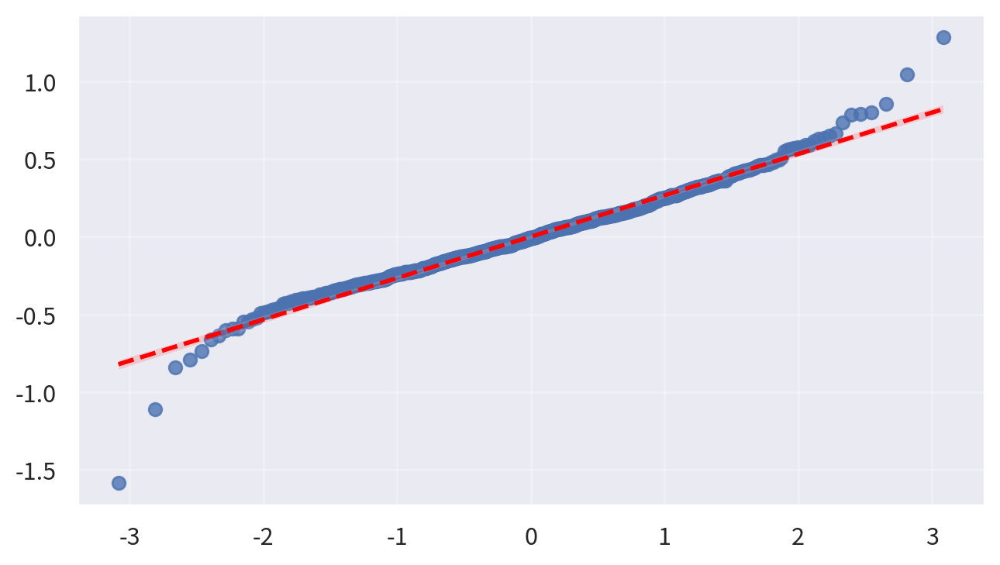

In [463]:
(x, y), _ = probplot(fit.resid)

width_px = 1280
height_px = 720
rows=1
cols=1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, dpi=my_dpi, figsize=figsize)

sb.regplot(x=x, y=y, line_kws={'color':'red',
                               'linestyle':'--',
                               'linewidth':2
                               })
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
plt.close()

- CLUSTER 0의 회귀선은 선형성을 띄고 있지만 동일한 소득 수준에서도 주택 가격의 분산이 크게 나타남. 이는 소득이 가격에 미치는 영향이 존재하지만, 0번 군집에서는 추가적인 다양한 요인이 주택 가격 형성에 작용하고 있다는 것을 알 수 있다.
- 전체 데이터를 대상으로 한 분석에 비해 소득 대비 주택 가격의 변동성은 적게 나타남 (2~3구간), 다른 군집에 비해 고소득 구간의 이질성이 상대적으로 작은 것으로 해석됨.


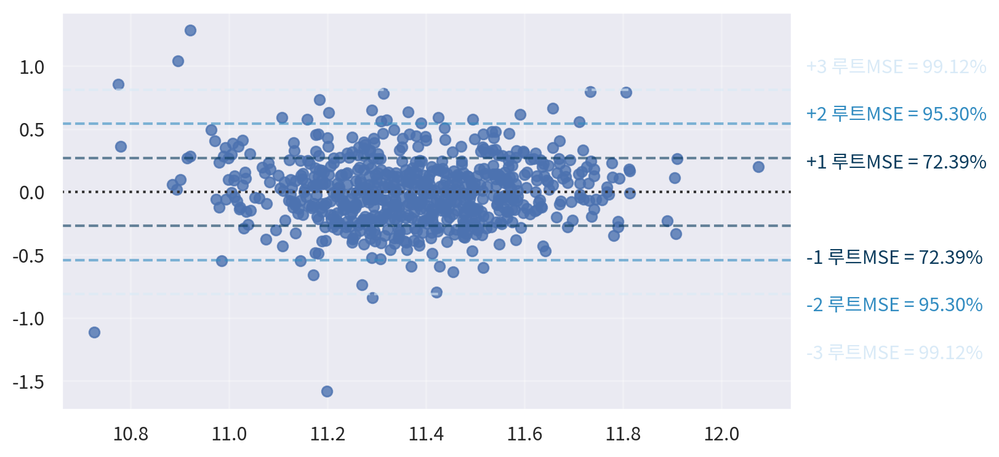

In [464]:
mse_sq = fit.mse_resid
mse_root = np.sqrt(mse_sq)
r = fit.resid       #잔차

r1 = r[(r>-mse_root) & (r<mse_root)].count() / r.count() * 100
r2 = r[(r>-2*mse_root) & (r<2*mse_root)].count() / r.count() * 100
r3 = r[(r>-3*mse_root) & (r<3*mse_root)].count() / r.count() * 100

mse_r = [r1, r2, r3]
colors = ["#0b3C5D", "#328CC1", "#D9EAF7"]

xmax = fit.fittedvalues.max()
ymin = fit.fittedvalues.min()

width_px = 1600
height_px = 720
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(1, 1, dpi=my_dpi, figsize=figsize, constrained_layout=True)

sb.residplot(x=fit.fittedvalues, y=fit.resid)

ax.grid(True, alpha=0.3)

for i, c in enumerate(colors):
    k= i + 1

    y_pos = k*mse_root
    ax.axhline(y=y_pos, color=c, linestyle="--", alpha=0.6)
    ax.axhline(y=-y_pos, color=c, linestyle="--", alpha=0.6)

    ax.text(x=1.02, y=0.5 + 0.12*k,
            s=f"+{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)
    
    ax.text(x=1.02, y=0.5 - 0.12*k,
            s=f"-{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)

plt.show()
plt.close()

- 잔차 분석 결과 예측 오차의 약 72%가 +-1루트MSE 범위 내에 분포하며 96%가 +-2루트MSE 이내에 포함되어 예측 오차는 전반적으로 안정적인 수준임.
- 0을 중심으로 고르게 분포하여 특정 구간에서 과대, 과소 추정은 보이지 않음.
- 설명력은 낮지만 예측 오차는 안정적이다.

#### CLUSTER_1 회귀 모델 진행

In [465]:
# CLUSTER_ID 1번 군집의 회귀분석
df_cluster_1 = df2[df2['CLUSTER_ID']==1].copy()
df_cluster_1.drop(columns=['CLUSTER_ID'], inplace=True)
df_cluster_1 = df_cluster_1.drop(df_cluster_1[df_cluster_1['ocean_proximity']=='ISLAND'].index)
df_cluster_1= pd.get_dummies(df_cluster_1, columns=['ocean_proximity'], drop_first=True, dtype=int)
# df_cluster_1.info()
df_cluster_1_final = df_cluster_1.drop(['latitude','longitude','median_income','total_bedrooms','median_house_value','households','log_total_bedrooms','log_households','population','total_rooms'], axis=1)

In [466]:
yname= 'log_median_house_value'
y = df_cluster_1_final[yname]
x = df_cluster_1_final.drop([yname], axis=1)

x_input = sm.add_constant(x)
fit = sm.OLS(y, x_input).fit()
tbl1_cluster1 = fit.summary()
print(tbl1_cluster1)

# rdf,r,m,v = ols_report(tbl1_cluster1, df_cluster_1_final)
# display(rdf)
# print(m)

                              OLS Regression Results                              
Dep. Variable:     log_median_house_value   R-squared:                       0.633
Model:                                OLS   Adj. R-squared:                  0.631
Method:                     Least Squares   F-statistic:                     611.0
Date:                        금, 16 1 2026   Prob (F-statistic):               0.00
Time:                            14:22:21   Log-Likelihood:                -552.02
No. Observations:                    2137   AIC:                             1118.
Df Residuals:                        2130   BIC:                             1158.
Df Model:                               6                                         
Covariance Type:                nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

- R^2 : 0.633, 표본 수 2137개 = CLUSTER 1은 약 63%의 설명력을 가지고 있음
- log_median_income : 0.7504, 소득이 1% 증가할 때 주택 가격 0.75% 증가
    - 소득이 집값을 결정하는데 가장 가까운 변수 (전체 모델과 유사)
- log_total_rooms : 0.3634, 방 수가 많아지면 가격이 올라갈 수 있음
- log_population : -0.3536, 사람이 많아지면 가격이 떨어짐 -> 밀도가 높아짐 -> 혼잡도가 올라가서 떨어지나?
- ocean_proximity : 
    - INLAND : -0.4093 = 해안 대비 감소하는 경향 -> 내륙은 집 값이 싼 경향이 있음
    - NEAR OCEAN : 해안으로 갈 수록 비싸지는 경향 
    - 입지 효과가 존재하는 군집 -> NEAR OCEAN, 1H OCEAN이 존재하는 지역으로 내륙의 경우 집 값이 쌈
- housing_median_age : 0.0017
    - 오래된 주택일수록 약간 비싸지는 경향
    - 입지 효과가 존재하므로 함께 나타나는 현상으로 보임
        - 노후 주택 = 입지가 좋은 지역 = 오래된 주택일 수록 비싸짐
- > CLUSTER 1의 회귀분석 결과 모형은 주택 가격 변동의 63.3% 설명하고 있으며 특히 전체 모델과 유사한 회귀 계수를 보여주고 있다. 소득은 가장 가까운 변수로 나타났으며 해안 접근성 또한 유의미한 영향을 미치는 것으로 확인되고 있다. 전체 모델에서는 확인할 수 없었던 total_rooms, population이 유의미한 변수로 사용되었으며, 주택 규모는 가격 상승 요인으로, 인구 밀도는 가격 하락 요인으로 작용하여 CLUSTER 1번 군집은 구조화된 주택 시장 특성을 지니고 있는 것으로 보인다.

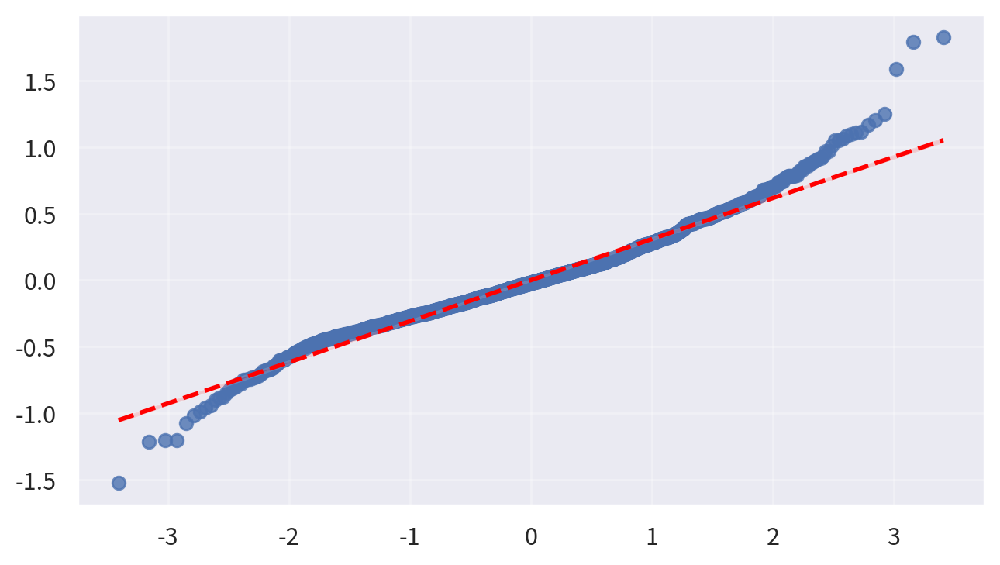

In [467]:
(x, y), _ = probplot(fit.resid)

width_px = 1280
height_px = 720
rows=1
cols=1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, dpi=my_dpi, figsize=figsize)

sb.regplot(x=x, y=y, line_kws={'color':'red',
                               'linestyle':'--',
                               'linewidth':2
                               })

ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
plt.close()

- 잔차는 전반적으로 정규분포 가정을 잘 만족하는 모습
- 우측 상단, 좌측 하단에서는 일부 이탈함
    - 일부 고가, 저가 주택에서 예측 오차가 상대적으로 크게 나타남
    - 전체 모델과 유사한 예측 모형
- 중앙부에서는 정규성 가정이 충족되며, 양쪽 꼬리에서 일부 이탈이 일어나지만 소수의 극단치로 판단됨. 따라서 본 회귀 모형은 통계적 가정 측면에서 비교적 안정적인 것으로 판단됨.

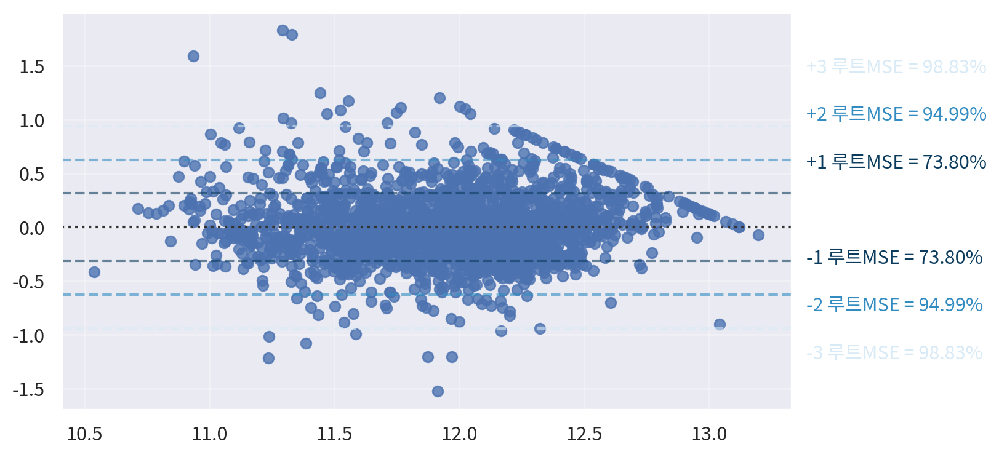

In [468]:
mse_sq = fit.mse_resid
mse_root = np.sqrt(mse_sq)
r = fit.resid       #잔차

r1 = r[(r>-mse_root) & (r<mse_root)].count() / r.count() * 100
r2 = r[(r>-2*mse_root) & (r<2*mse_root)].count() / r.count() * 100
r3 = r[(r>-3*mse_root) & (r<3*mse_root)].count() / r.count() * 100

mse_r = [r1, r2, r3]
colors = ["#0b3C5D", "#328CC1", "#D9EAF7"]

xmax = fit.fittedvalues.max()
ymin = fit.fittedvalues.min()

width_px = 1600
height_px = 720
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(1, 1, dpi=my_dpi, figsize=figsize, constrained_layout=True)

sb.residplot(x=fit.fittedvalues, y=fit.resid)

ax.grid(True, alpha=0.3)

for i, c in enumerate(colors):
    k= i + 1

    y_pos = k*mse_root
    ax.axhline(y=y_pos, color=c, linestyle="--", alpha=0.6)
    ax.axhline(y=-y_pos, color=c, linestyle="--", alpha=0.6)

    ax.text(x=1.02, y=0.5 + 0.12*k,
            s=f"+{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)
    
    ax.text(x=1.02, y=0.5 - 0.12*k,
            s=f"-{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)

plt.show()
plt.close()

- 잔차 분석 결과 예측 오차의 73%가 +-1루트MSE범위 내에 분포하여 전반적인 예측 안정성은 양호함.
- 다만 예측 값이 높은 구간에서는 잔차가 음의 방향으로 편향되는 모습이 관찰되어 고가 주택의 경우 모형이 가격을 다소 과대평가하는 한계가 존재함
    - 고가 주택의 가격 형성에 추가적인 비관측 요인이 작용할 가능성을 의미함

#### CLUSTER_ID 2번 회귀 분석 진행

In [469]:
# CLUSTER_ID 2번 군집의 회귀분석
df_cluster_2 = df2[df2['CLUSTER_ID']==2].copy()
df_cluster_2.drop(columns=['CLUSTER_ID'], inplace=True)
df_cluster_2 = df_cluster_2.drop(df_cluster_2[df_cluster_2['ocean_proximity']=='ISLAND'].index)
df_cluster_2= pd.get_dummies(df_cluster_2, columns=['ocean_proximity'], drop_first=True, dtype=int)
# df_cluster_2.info()
df_cluster_2_final = df_cluster_2.drop(['latitude','longitude','median_income','median_house_value','total_bedrooms','total_rooms','households','log_total_bedrooms','log_households','population'], axis=1)

In [470]:
yname= 'log_median_house_value'
y = df_cluster_2_final[yname]
x = df_cluster_2_final.drop([yname], axis=1)

x_input = sm.add_constant(x)
fit = sm.OLS(y, x_input).fit()
tbl1_cluster2 = fit.summary()
print(tbl1_cluster2)

# rdf,r,m,v = ols_report(tbl1_cluster2, df_cluster_2_final)
# display(rdf)
# print(m)

                              OLS Regression Results                              
Dep. Variable:     log_median_house_value   R-squared:                       0.774
Model:                                OLS   Adj. R-squared:                  0.773
Method:                     Least Squares   F-statistic:                     981.6
Date:                        금, 16 1 2026   Prob (F-statistic):               0.00
Time:                            14:22:22   Log-Likelihood:                -269.78
No. Observations:                    1726   AIC:                             553.6
Df Residuals:                        1719   BIC:                             591.7
Df Model:                               6                                         
Covariance Type:                nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

- R^2 : 0.774, 표본 수: 1726개 
- log_median_income = 0.7006
    - 소득이 1% 증가 시 주택 가격 0.70% 증가
- log_total_rooms = 0.2349
    - 방 수가 늘어나면 집 값이 늘어나는 경향 (집이 크기가 가격에 영향을 주는 지역)
- log_population = -0.2738
    - 사람이 많아지면 집 값이 싸지는 경향 (인구 밀도에 따라 집 값에 영향이 있음)
- ocean_proximity:
    - INLAND : -0.7988 = 해안 대비 내륙 지역 주택은 가격이 79% 낮게 형성됨(1H OCEAN 대비)
    - NEAR OCEAN : 0.1175 = 1H OCEAN 대비 가격이 11% 높게 형성됨
    - 해안과 내륙 구분이 명확한 지역
- housing_median_age : -0.0016
    - 오래될수록 가격이 하락됨 (전체 모델 회귀계수와는 반대 방향)
    - 신축 여부가 중요한 지역
- population : - 방향
    - 밀도 증가 시 집 값은 떨어지는 경향이 있음(혼잡도에 민감하다고 볼 수 있음)
    - CLUSTER 2는 소득 + 입지 + 혼잡도가 명확하게 작용됨
- > CLUSTER 2의 회귀분석 결과 모형은 주택 가격 변동의 약 77.4%를 설명하여 현재 군집별 분석 중 가장 높은 설명력을 보인다. 중위 가구 소득은 가장 가까운 변수로 나타났으며 해안 접근성과 내륙 여부 또한 주택 가격에 큰 영향을 미치는 것으로 확인된다. 집의 나이와 인구 밀도는 가격 하락 요인으로 작용하며, CLUSTER 2번 군집이 소득 과 입지, 주거 환경의 질에 민감한 주택 시장 구조를 지니고 있음을 보인다.

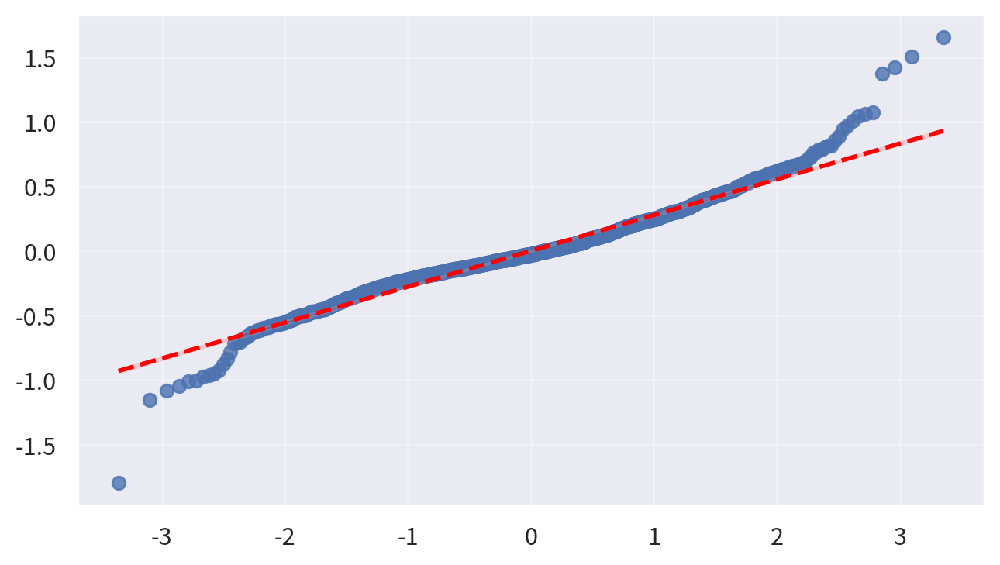

In [471]:
(x, y), _ = probplot(fit.resid)

width_px = 1280
height_px = 720
rows=1
cols=1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, dpi=my_dpi, figsize=figsize)

sb.regplot(x=x, y=y, line_kws={'color':'red',
                               'linestyle':'--',
                               'linewidth':2
                               })

ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
plt.close()

- 잔차의 정규성은 양쪽 꼬리를 제외하면 만족한다고 볼 수 있으며 극단값에서는 이탈이 관찰되는데, 주택 가격에 영향을 미치는 다른 다양한 요인들이 존재하지만 반영이 되지 않았다고 해석할 수 있다.

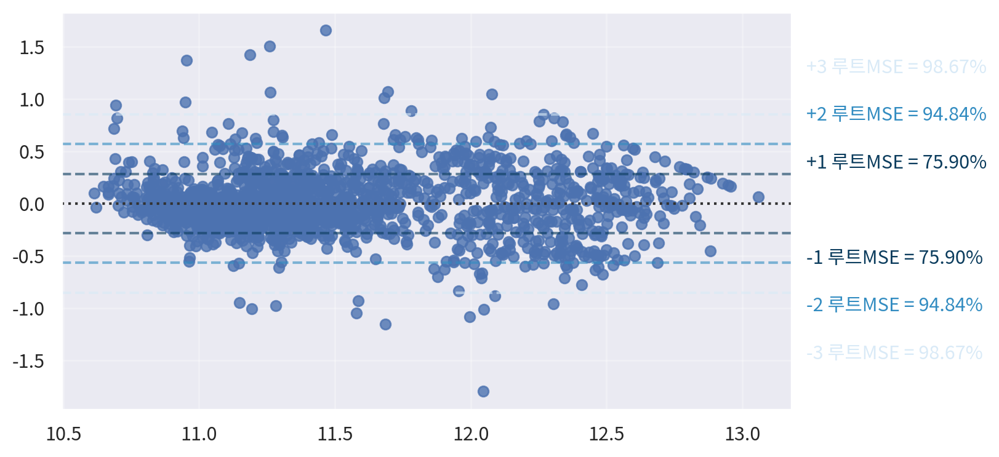

In [472]:
mse_sq = fit.mse_resid
mse_root = np.sqrt(mse_sq)
r = fit.resid       #잔차

r1 = r[(r>-mse_root) & (r<mse_root)].count() / r.count() * 100
r2 = r[(r>-2*mse_root) & (r<2*mse_root)].count() / r.count() * 100
r3 = r[(r>-3*mse_root) & (r<3*mse_root)].count() / r.count() * 100

mse_r = [r1, r2, r3]
colors = ["#0b3C5D", "#328CC1", "#D9EAF7"]

xmax = fit.fittedvalues.max()
ymin = fit.fittedvalues.min()

width_px = 1600
height_px = 720
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(1, 1, dpi=my_dpi, figsize=figsize, constrained_layout=True)

sb.residplot(x=fit.fittedvalues, y=fit.resid)

ax.grid(True, alpha=0.3)

for i, c in enumerate(colors):
    k= i + 1

    y_pos = k*mse_root
    ax.axhline(y=y_pos, color=c, linestyle="--", alpha=0.6)
    ax.axhline(y=-y_pos, color=c, linestyle="--", alpha=0.6)

    ax.text(x=1.02, y=0.5 + 0.12*k,
            s=f"+{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)
    
    ax.text(x=1.02, y=0.5 - 0.12*k,
            s=f"-{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)

plt.show()
plt.close()

- 잔차 분석 결과 0을 중심으로 분포하여 회귀 모형의 가정을 충족하는 것으로 보인다.
- 주택 가격이 높은 구간에서는 분산이 증가하는 이분산성 경향이 관찰되었으며 고가 주택일 수록 비정형적 가격 결정 요인의 영향이 커지는 것을 유추할 수 있다.

#### CLUSTER_ID 3번 진행

In [473]:
# CLUSTER_ID 3번 군집의 회귀분석
df_cluster_3 = df2[df2['CLUSTER_ID']==3].copy()
df_cluster_3.drop(columns=['CLUSTER_ID'], inplace=True)
#df_cluster_3은 INLAND만 존재함 (2324개), 따라서 더 이상 분석하지 않음
df_cluster_3 = df_cluster_3.drop(columns=['ocean_proximity'])
# df_cluster_3['ocean_proximity'].value_counts()
# df_cluster_3 = df_cluster_3.drop(df_cluster_3[df_cluster_3['ocean_proximity']=='ISLAND'].index)
# df_cluster_3= pd.get_dummies(df_cluster_3, columns=['ocean_proximity'], drop_first=True, dtype=int)
# df_cluster_3.info()
df_cluster_3_final = df_cluster_3.drop(['latitude','longitude','median_income','median_house_value','total_bedrooms','households','total_rooms','log_total_bedrooms','log_households','population'], axis=1)

In [474]:
yname= 'log_median_house_value'
y = df_cluster_3_final[yname]
x = df_cluster_3_final.drop([yname], axis=1)

x_input = sm.add_constant(x)
fit = sm.OLS(y, x_input).fit()
tbl1_cluster3 = fit.summary()
print(tbl1_cluster3)

# rdf,r,m,v = ols_report(tbl1_cluster3, df_cluster_3_final)
# display(rdf)
# print(m)

                              OLS Regression Results                              
Dep. Variable:     log_median_house_value   R-squared:                       0.463
Model:                                OLS   Adj. R-squared:                  0.462
Method:                     Least Squares   F-statistic:                     495.8
Date:                        금, 16 1 2026   Prob (F-statistic):          1.30e-308
Time:                            14:22:22   Log-Likelihood:                -460.73
No. Observations:                    2307   AIC:                             931.5
Df Residuals:                        2302   BIC:                             960.2
Df Model:                               4                                         
Covariance Type:                nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------

- R^2 : 0.463, 표본 수 : 2307개 
    - 통계적으로는 유의한 모델
- log_median_income : 소득 1% 증가 시 0.75% 증가 , 주택 가격과 가장 가까운 변수
- housing_median_age : -0.0038 = 주택이 오래될수록 가격 하락, 내륙 지역에서는 신축이 더 비싸다고 볼 수 있음 (3번 군집에는 INLAND만 존재하기 때문에 가능한 해석)
- log_population : 인구 밀도가 높을수록 가격 하락 - 도시 중심이 아닌 내륙 지역의 특성을 반영함
    - 인구가 많다는 것이 입지가 좋다는 것이 아님
- log_total_rooms : 0.1730, 방 수가 많아지면 집 값이 올라감 (집이 커지면 집 값이 올라가는 경향)
- > 3번 군집은 INLAND 지역으로만 구성되어 있어 지리적 요인의 변별력이 제한되어 있으며 설명력이 다른 군집에 비해 낮게 나타남. 내륙 지역임에도 소득은 가장 집값을 잘 설명하는 변수로 나타났으며 주택 노후도와 인구 규모 또한 유의한 영향을 미치는 것으로 나타남. 내륙 지역 주택 시장이 입지보다는 거주 여건과 경제적 수준에 의해 가격이 형성됨을 알 수 있음.

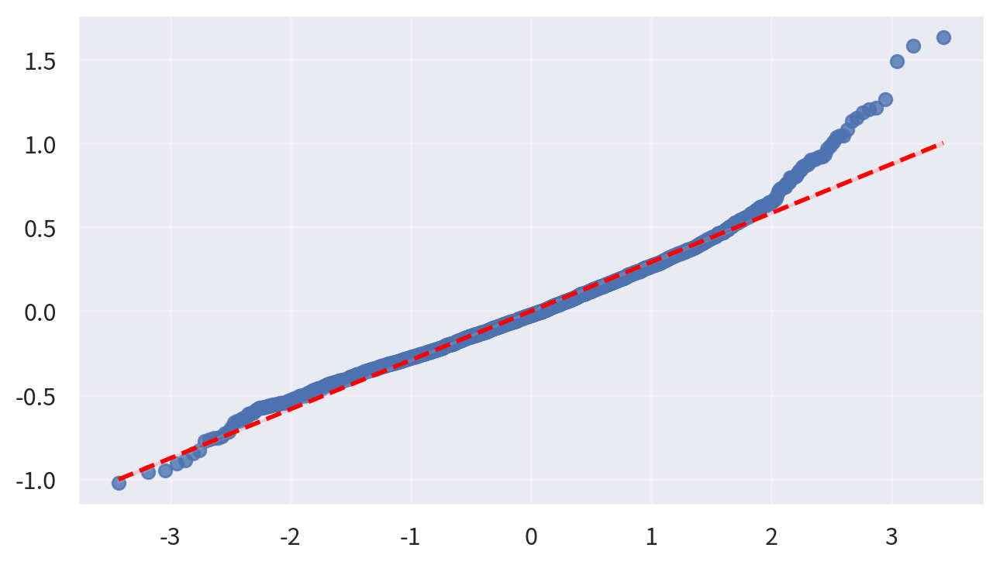

In [475]:
(x, y), _ = probplot(fit.resid)

width_px = 1280
height_px = 720
rows=1
cols=1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, dpi=my_dpi, figsize=figsize)

sb.regplot(x=x, y=y, line_kws={'color':'red',
                               'linestyle':'--',
                               'linewidth':2
                               })

ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
plt.close()

- 잔차는 전반적으로 안정적이지만, 고가 주택에서 이탈이 있음을 알 수 있음. 이는 고가 주택의 설명하는 변수가 부족하다는 것을 보여줌 (다양한 요인이 존재함)

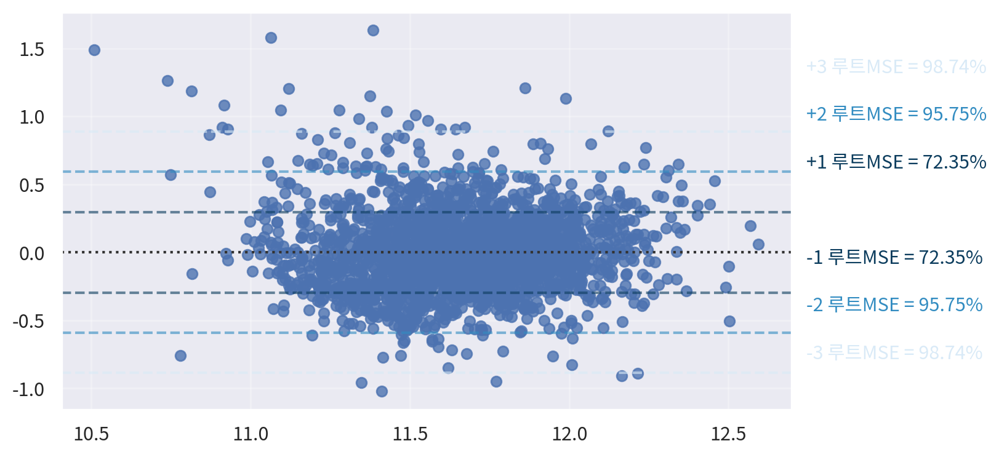

In [476]:
mse_sq = fit.mse_resid
mse_root = np.sqrt(mse_sq)
r = fit.resid       #잔차

r1 = r[(r>-mse_root) & (r<mse_root)].count() / r.count() * 100
r2 = r[(r>-2*mse_root) & (r<2*mse_root)].count() / r.count() * 100
r3 = r[(r>-3*mse_root) & (r<3*mse_root)].count() / r.count() * 100

mse_r = [r1, r2, r3]
colors = ["#0b3C5D", "#328CC1", "#D9EAF7"]

xmax = fit.fittedvalues.max()
ymin = fit.fittedvalues.min()

width_px = 1600
height_px = 720
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(1, 1, dpi=my_dpi, figsize=figsize, constrained_layout=True)

sb.residplot(x=fit.fittedvalues, y=fit.resid)

ax.grid(True, alpha=0.3)

for i, c in enumerate(colors):
    k= i + 1

    y_pos = k*mse_root
    ax.axhline(y=y_pos, color=c, linestyle="--", alpha=0.6)
    ax.axhline(y=-y_pos, color=c, linestyle="--", alpha=0.6)

    ax.text(x=1.02, y=0.5 + 0.12*k,
            s=f"+{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)
    
    ax.text(x=1.02, y=0.5 - 0.12*k,
            s=f"-{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)

plt.show()
plt.close()

- 잔차의 경우 전반적으로 안정적인 예측력을 보여주지만, 저가 및 고가 구간에서는 잔차 분산이 증가하여 개별 주택의 특수한 요인을 충분히 설명하지 못하는 한계가 발견됨. 

#### CLUSTER_ID 4번 회귀분석

In [477]:
# CLUSTER_ID 4번 군집의 회귀분석
df_cluster_4 = df2[df2['CLUSTER_ID']==4].copy()
df_cluster_4.drop(columns=['CLUSTER_ID'], inplace=True)
print(df_cluster_4['ocean_proximity'].value_counts())
df_cluster_4 = df_cluster_4.drop(df_cluster_4[df_cluster_4['ocean_proximity']=='ISLAND'].index)
df_cluster_4= pd.get_dummies(df_cluster_4, columns=['ocean_proximity'], drop_first=True, dtype=int)
# df_cluster_4.info()
df_cluster_4_final = df_cluster_4.drop(['latitude','longitude','median_income','median_house_value','total_bedrooms','total_rooms','households','population','log_total_bedrooms','log_households'], axis=1)

ocean_proximity
<1H OCEAN     6698
INLAND        1532
NEAR OCEAN     568
ISLAND           5
Name: count, dtype: int64


In [478]:
yname= 'log_median_house_value'
y = df_cluster_4_final[yname]
x = df_cluster_4_final.drop([yname], axis=1)

x_input = sm.add_constant(x)
fit = sm.OLS(y, x_input).fit()
tbl1_cluster4 = fit.summary()
print(tbl1_cluster4)

# rdf,r,m,v = ols_report(tbl1_cluster4, df_cluster_4_final)
# display(rdf)
# print(m)

                              OLS Regression Results                              
Dep. Variable:     log_median_house_value   R-squared:                       0.579
Model:                                OLS   Adj. R-squared:                  0.579
Method:                     Least Squares   F-statistic:                     2016.
Date:                        금, 16 1 2026   Prob (F-statistic):               0.00
Time:                            14:22:22   Log-Likelihood:                -2222.0
No. Observations:                    8798   AIC:                             4458.
Df Residuals:                        8791   BIC:                             4508.
Df Model:                               6                                         
Covariance Type:                nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

- R^2 : 0.579 = 군집 내 주택 가격 변동을 57.9% 설명함
- log_median_income : 0.6138 = 소득이 1% 증가 시 0.61% 증가함
- log_total_rooms : 0.3412 = 방이 많아지면(집이 커지면) 집 가격이 올라감
- log_population : -0.3252 = 사람이 많아지면 집 값이 떨어지는 경향
- ocean_proximity:
    - INLAND : -0.4484 = 내륙 지역은 <1H ocean 대비 45% 낮게 형성됨
        - 동일한 소득과 주택 특성을 가정하더라도 내륙 지역은 해안 접근성이 있는 지역보다 낮은 가격을 형성함
        - 입지가 중요한 군집
    - NEAR OCEAN : 1h ocean에 비해 10.4% 높게 형성됨
        - 해안 접근성은 가격 상승 요인으로 속함
- housing_median_age : 0.0021 
    - 주택이 오래될수록 가격이 올라감 -> 입지가 좋은 지역이라고 생각할 수 있음
- > 소득 수준과 해안 접근성이 중요한 지역이며 내륙 여부가 가격에 영향을 크게 미치는 것으로 보임

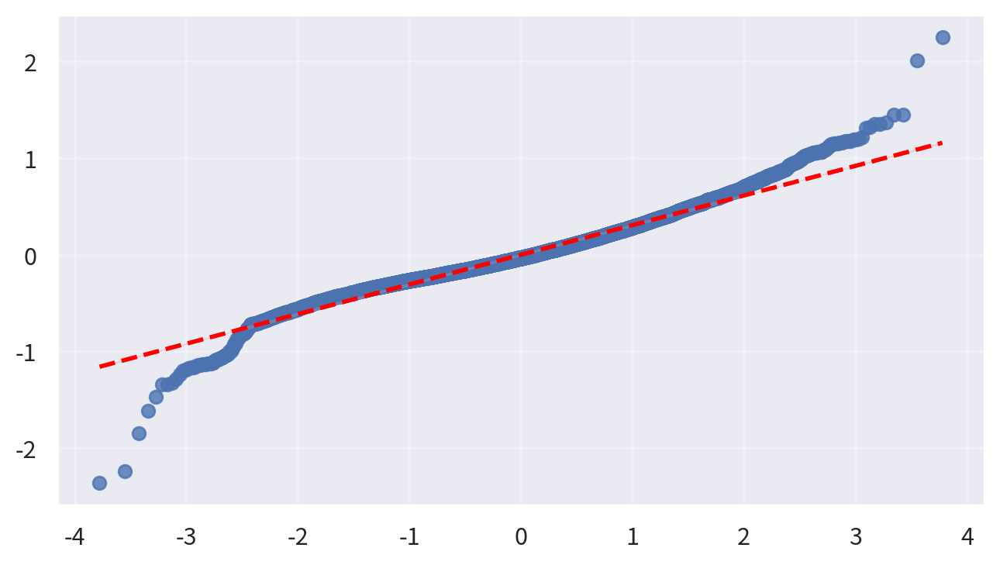

In [479]:
(x, y), _ = probplot(fit.resid)

width_px = 1280
height_px = 720
rows=1
cols=1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, dpi=my_dpi, figsize=figsize)

sb.regplot(x=x, y=y, line_kws={'color':'red',
                               'linestyle':'--',
                               'linewidth':2
                               })

ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
plt.close()

- 잔차는 전반적으로 안정적이지만, 저가 및 고가 주택에서 이탈이 있음을 알 수 있음. 이는 저가 및 고가 주택의 설명하는 변수가 부족하다는 것을 보여줌 (다양한 요인이 존재함)

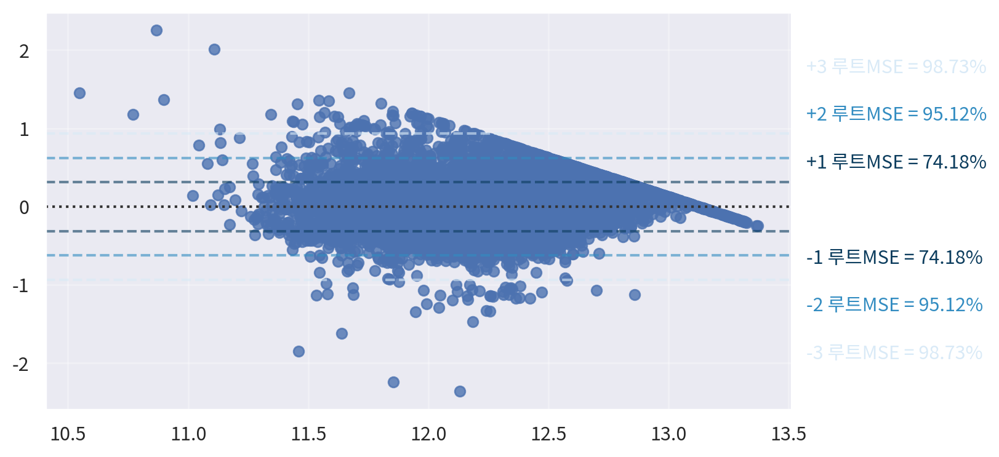

In [480]:
mse_sq = fit.mse_resid
mse_root = np.sqrt(mse_sq)
r = fit.resid       #잔차

r1 = r[(r>-mse_root) & (r<mse_root)].count() / r.count() * 100
r2 = r[(r>-2*mse_root) & (r<2*mse_root)].count() / r.count() * 100
r3 = r[(r>-3*mse_root) & (r<3*mse_root)].count() / r.count() * 100

mse_r = [r1, r2, r3]
colors = ["#0b3C5D", "#328CC1", "#D9EAF7"]

xmax = fit.fittedvalues.max()
ymin = fit.fittedvalues.min()

width_px = 1600
height_px = 720
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(1, 1, dpi=my_dpi, figsize=figsize, constrained_layout=True)

sb.residplot(x=fit.fittedvalues, y=fit.resid)

ax.grid(True, alpha=0.3)

for i, c in enumerate(colors):
    k= i + 1

    y_pos = k*mse_root
    ax.axhline(y=y_pos, color=c, linestyle="--", alpha=0.6)
    ax.axhline(y=-y_pos, color=c, linestyle="--", alpha=0.6)

    ax.text(x=1.02, y=0.5 + 0.12*k,
            s=f"+{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)
    
    ax.text(x=1.02, y=0.5 - 0.12*k,
            s=f"-{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)

plt.show()
plt.close()

- 잔차 분석 결과 중간 가격대 주택에 대해 안정적인 예측력을 보이고, 대부분의 관측치가 +-2MSE범위 내에 포함되어 있음. 하지만 고가 주택 구간에서는 잔차 분산이 증가하여 개별 주택의 특수한 입지, 환경 요인이 추가적으로 작용함을 유추해볼 수 있음.

#### CLUSTER_ID 5번 회귀분석

In [481]:
# CLUSTER_ID 5번 군집의 회귀분석
df_cluster_5 = df2[df2['CLUSTER_ID']==5].copy()
df_cluster_5.drop(columns=['CLUSTER_ID'], inplace=True)
print(df_cluster_5['ocean_proximity'].value_counts())
df_cluster_5 = df_cluster_5.drop(df_cluster_5[df_cluster_5['ocean_proximity']=='ISLAND'].index)
df_cluster_5= pd.get_dummies(df_cluster_5, columns=['ocean_proximity'], drop_first=True, dtype=int)
# df_cluster_5.info()
df_cluster_5_final = df_cluster_5.drop(['latitude','longitude','median_income','median_house_value','total_bedrooms','households','total_rooms','population','log_total_bedrooms','log_households'], axis=1)

ocean_proximity
NEAR BAY      2270
<1H OCEAN     1423
NEAR OCEAN     674
INLAND         412
Name: count, dtype: int64


In [482]:
yname= 'log_median_house_value'
y = df_cluster_5_final[yname]
x = df_cluster_5_final.drop([yname], axis=1)

x_input = sm.add_constant(x)
fit = sm.OLS(y, x_input).fit()
tbl1_cluster5 = fit.summary()
print(tbl1_cluster5)

# rdf,r,m,v = ols_report(tbl1_cluster5, df_cluster_5_final)
# display(rdf)
# print(m)

                              OLS Regression Results                              
Dep. Variable:     log_median_house_value   R-squared:                       0.529
Model:                                OLS   Adj. R-squared:                  0.529
Method:                     Least Squares   F-statistic:                     766.2
Date:                        금, 16 1 2026   Prob (F-statistic):               0.00
Time:                            14:22:23   Log-Likelihood:                -1216.2
No. Observations:                    4779   AIC:                             2448.
Df Residuals:                        4771   BIC:                             2500.
Df Model:                               7                                         
Covariance Type:                nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

- R^2 : 0.529 = 현재 군집 내의 주택 가격 변동의 53% 설명
    - 소득, 입지 요인 외에도 다양한 비관측 요인이 많다(이질성이 큰 지역임)
- log_median_income : 0.7722 = 소득이 1% 증가시 집값 0.77 증가함
- log_total_rooms : 0.2654 = 방 수가 많아지면 집 값이 오름
- log_population : -0.2211 = 사람이 많아지면 집 값이 떨어짐
- ocean_proximity
    - NEAR OCEAN : 0.1895
        - 해안 인접 지역은 1H OCEAN 대비 19% 높게 형성됨
        - 해안에는 가격이 더 붙는 것을 알 수 있음.
    - INLAND : -0.2441
        - 다른 군집에 비해 내륙의 감소 폭이 적음
        - 해당 입지가 INLAND라고 하지만 다른 군집에 비해 해안과의 거리가 가깝다고 유추해볼 수 있음.
    - NEAR BAY : -0.0398
        - BAY 인접 지역은 1H OCEAN 대비 4%가량 낮게 형성됨
- housing_median_age : 0.0057
    - 주택 연식이 증가하면 가격이 상승함 
    - 오래된 주택이 아닌 입지에 대한 해석이 필요 -> 도심 접근성이 높은 지역 혹은 인프라가 좋은 지역
- > 5번 군집은 소득에 의해 크게 영향을 받으며 해안 접근성 또한 유의미한 주택 가격 결정 요인으로 보임.

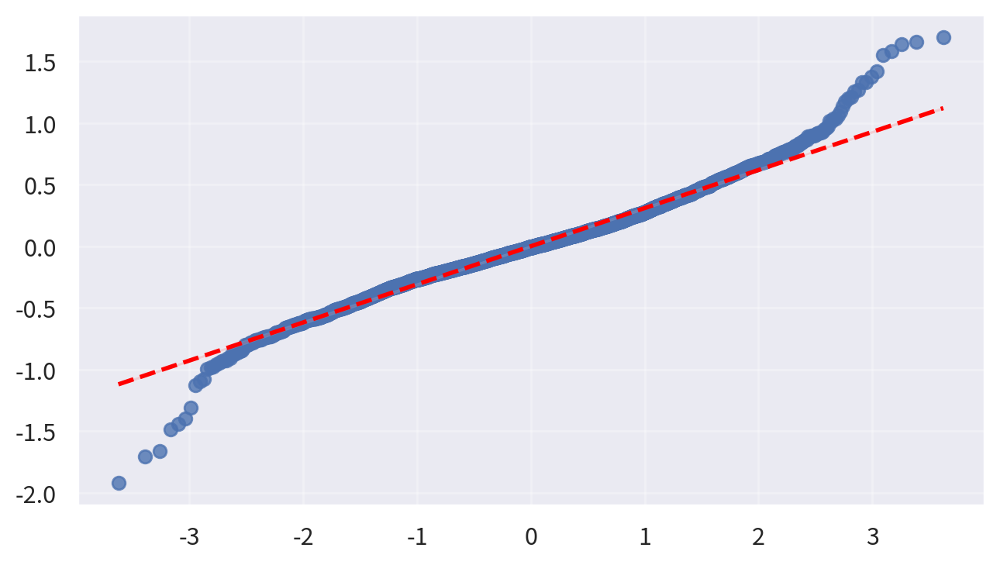

In [483]:
(x, y), _ = probplot(fit.resid)

width_px = 1280
height_px = 720
rows=1
cols=1
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, dpi=my_dpi, figsize=figsize)

sb.regplot(x=x, y=y, line_kws={'color':'red',
                               'linestyle':'--',
                               'linewidth':2
                               })

ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
plt.close()

- 잔차는 전반적으로 안정적이지만, 저가 및 고가 주택에서 이탈이 있음을 알 수 있음. 이는 저가 및 고가 주택의 설명하는 변수가 부족하다는 것을 보여줌 (다양한 요인이 존재함)

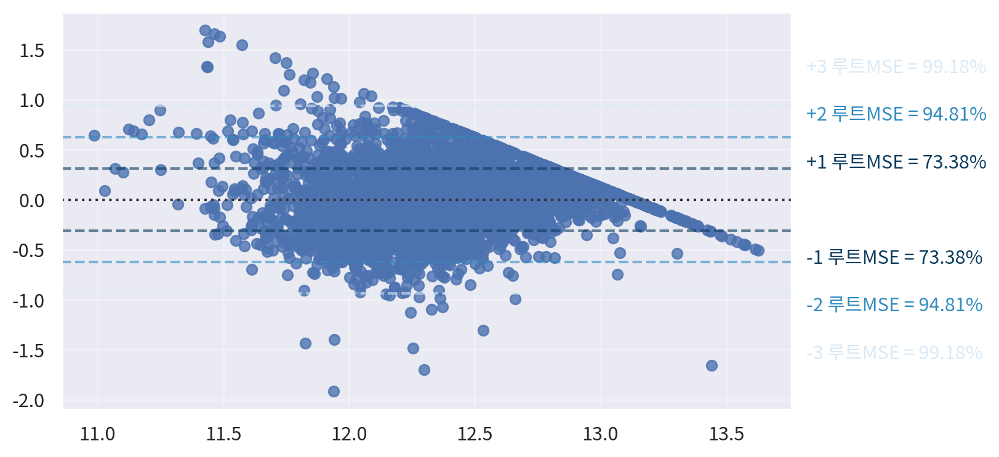

In [484]:
mse_sq = fit.mse_resid
mse_root = np.sqrt(mse_sq)
r = fit.resid       #잔차

r1 = r[(r>-mse_root) & (r<mse_root)].count() / r.count() * 100
r2 = r[(r>-2*mse_root) & (r<2*mse_root)].count() / r.count() * 100
r3 = r[(r>-3*mse_root) & (r<3*mse_root)].count() / r.count() * 100

mse_r = [r1, r2, r3]
colors = ["#0b3C5D", "#328CC1", "#D9EAF7"]

xmax = fit.fittedvalues.max()
ymin = fit.fittedvalues.min()

width_px = 1600
height_px = 720
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(1, 1, dpi=my_dpi, figsize=figsize, constrained_layout=True)

sb.residplot(x=fit.fittedvalues, y=fit.resid)

ax.grid(True, alpha=0.3)

for i, c in enumerate(colors):
    k= i + 1

    y_pos = k*mse_root
    ax.axhline(y=y_pos, color=c, linestyle="--", alpha=0.6)
    ax.axhline(y=-y_pos, color=c, linestyle="--", alpha=0.6)

    ax.text(x=1.02, y=0.5 + 0.12*k,
            s=f"+{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)
    
    ax.text(x=1.02, y=0.5 - 0.12*k,
            s=f"-{k} 루트MSE = {mse_r[i]:0.2f}%",
            transform=ax.transAxes,
            ha="left", va="center", fontsize=11, color=c)

plt.show()
plt.close()

- 오른쪽으로 갈 수록 잔차의 상단이 사라짐
    - 음의 잔차(과대추정)만 남는 구조 -> 잔차 분포가 비대칭임
    - 주택 가격의 상한이 존재하며 고가 주택을 과대추정하고 있음
        - 통계적으로 문제가 있는 것이 아닌 데이터 생성 구조의 문제가 존재함
- 정규성,선형성 가정이 부분적으로 붕괴되어 있음
    - 상한선 존재 여부 (median_house_value)
    - 고소득 해안 고가 지역에서 예측은 계속 상승하지만 실제 값은 상한선에 멈춰있음
        - 잔차가 음의 방향으로만 쌓임
- > 5번 군집은 적합값이 증가할수록 잔차의 상단이 제한되는 형태의 패턴이 관찰됨. 이는 고가 주택 구간에서 주택 가격이 상한값에 의해 제한되어 있으며 데이터 수집 구조에서 기인한 현상으로 해석됨.

In [485]:
# 군집별 평균/중앙값/분포 확인, 집값이 높은 순으로 정렬
df.groupby('CLUSTER_ID')[[
    'median_income',
    'total_bedrooms',
    'total_rooms',
    'population',
    'households',
    'housing_median_age',
    'median_house_value'
]].median().sort_values(by='median_house_value', ascending=False)


,median_income,total_bedrooms,total_rooms,population,households,housing_median_age,median_house_value
CLUSTER_ID,,,,,,,
5,4.13790,433.0,2228.0,1113.0,415.0,33.0,245300.0
4,3.71430,440.0,2086.0,1256.0,419.0,32.0,200000.0
1,3.25930,496.0,2378.0,1223.0,453.0,20.0,155300.0
3,2.98660,411.0,2049.0,1010.0,373.0,23.0,116700.0
2,2.69785,403.0,1993.5,1135.0,379.0,24.0,87500.0
0,2.34030,388.0,1896.0,887.0,338.0,22.0,85800.0


- 회귀 계수에서 소득이 가장 가까운 변수로 뽑힌만큼 군집간 차이에서도 소득이 커질수록 주택 가격 또한 커짐
- 집의 크기는 주택 가격을 잘 설명하지 못하는 변수임
    - 군집 1이 total_rooms, total_bedrooms가 가장 크지만 4,5보다 가격이 낮음
    - 큰 집 != 비싼 집 이라는 것
    - 캘리포니아 주택 가격은 물리적인 규모보다는 누가 사는 지역인가가 더 중요함
- population, households는 사람이 사는 밀도라고 해석해야함
    - 개별 모델에서 확인했듯이 계수 부호가 일관되지 않음
    - 주택 수요를 반영하는 변수로 가격을 설명하기엔 부족함
- CLUSTER 5 : 고소득, 중간규모, 고가 주택 핵심 지역
- CLUSTER 4 : 중고소득, 중고가, 안정적인 주거지역
- CLUSTER 1 : 대형 주택이 많지만 소득 가격은 중간인 지역
- CLUSTER (3,2) : 중저소득,중소형 주택, 전형적인 내륙지역
- CLUSTER (0) : 저소득,저가,가격이 가장 낮은 군집
- > 해당 데이터에서 주택 가격을 나누는 기준은 집의 크기, 규모보다는 어떤 소득 계층이 모여있는가가 중요하며 현재 분석에서 나눈 군집은 소득계층을 정확히 반영한 것으로 나타났다.

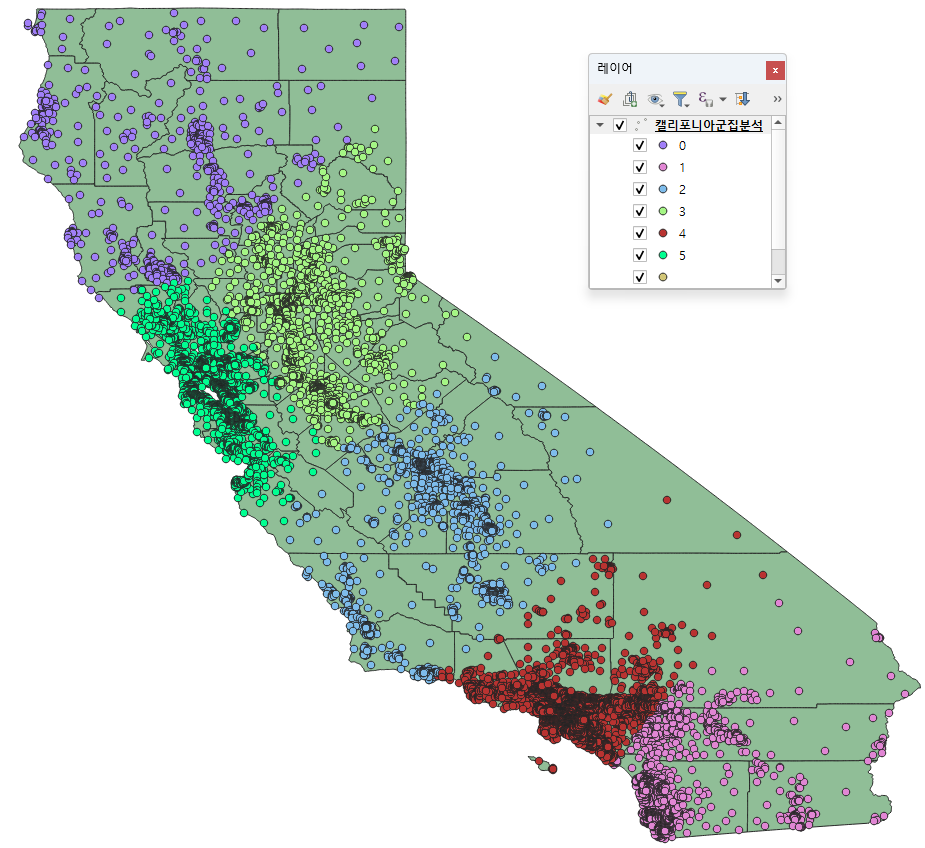

- 군집별 소득간 차이가 얼마나 날까?
- 군집내에서 소득간 차이는 얼마나 날까?
~~- 주택 가격이 가장 비싸게 형성되어있는 군집과 제일 싼 군집은 어떤 차이가 있을까?~~
- 가장 비싼 지역에서 집 값이 비싼 이유
- 가장 싼 지역에서 집 값이 싼 이유
<!-- - 가장 비싼 지역에서의 싼 집과 가장 싼 지역에서 비싼 집값의 차이
    - 그 둘의 차이로는 뭐가 차이나서 군집이 나뉘었는지? -->
- 주 도심지에서의 가장 싼집은 부도심지에서의 비싼집과의 차이가 어떤 것이 있을까?
- 비싼 집의 조건은 무엇일까?
    - 현재 프로젝트의 대 주제
        - 소득이 일단 요인으로 나오긴 함
- 군집별 집값을 정하는 요인 TOP 3 정하고 계수까지 정리해놓고 얘기하기
- 신축만이 비싼 가격을 형성하고 있을까?
- 방의 개수가 많으면 신축이든 구축이든 상관 없이 비쌀까?
    - 방의 개수 대비 신축(집의 나이로 계산해야함..) 비율 구축 비율로 집 값 보기
- 주 도심지에서의 큰집(방의 개수가 많은 집)과 부 도심지에서의 큰 집(방의 개수가 많은 집)은 가격이 어느정도 차이가 날까?
    - 주도심지에서의 작은집(방의 개수가 제일 작은 집)과 부도심지에서의 큰집은 가격이 비슷할까?
- 만약 우리가 집을 구한다면 주 도심지로 출근한다고 가정했을때 어디에 사는것이 가장 현명한 선택이 될까?
    -이건 최적 입지 선택이라 후순위
- 인구수가 많으면 집 값이 떨어질까?
- 캘리포니아의 주거 선호는 지역 유형에 따라 다를까?
    - 군집별로 선호하는 주거지 비교(소득이 핵심인 곳, 입지가 핵심인곳, 주택 규모가 핵심인 곳)
- 캘리포니아의 소득이 큰 사람들은 비싼집에 살고 있을까?
- 같은 군집 안에서도 소득 차이가 분명할까?
    - 그럼 얼마나 나는지, 소득에 따라 사는 집 값이 얼마나 차이가 나는지
    - 같은 해안가..에서도..소득 차이가 존재하나..? 존재한다면 집 값의 차이는..?

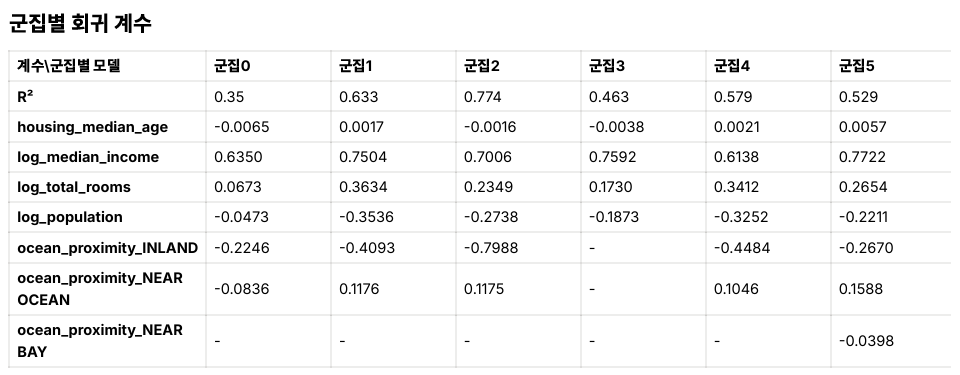
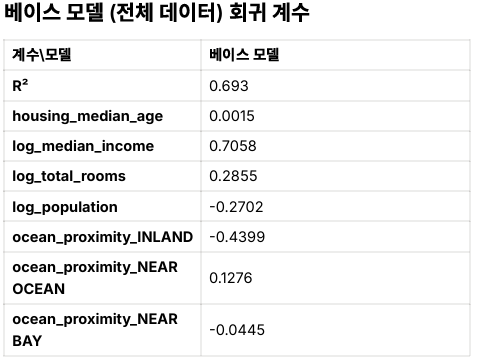

#### 가설 1. 1990년대 캘리포니아의 주거 선호는 지역 유형에 따라 다를까?
- 군집별로 선호하는 주거지 비교(소득이 핵심인 곳, 입지가 핵심인곳, 주택 규모가 핵심인 곳)
- 귀무가설 : 1990년대 캘리포니아의 주거 선호는 지역마다 다르지 않다.
- 대립가설 : 1990년대 캘리포니아의 주거 선호는 지역마다 다르다.

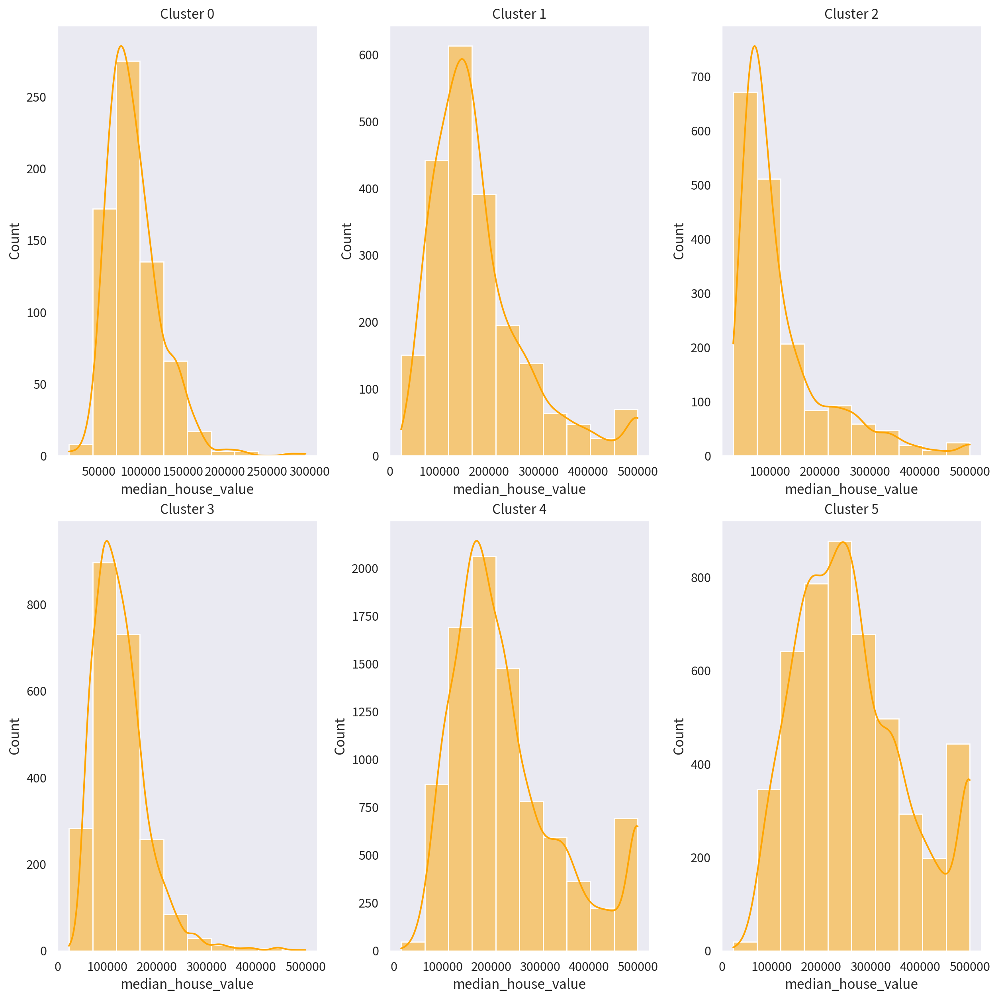

In [486]:
# print(df_cluster_0.info())
# print(df_cluster_1.info())
# print(df_cluster_2.info())
# print(df_cluster_3.info())
# print(df_cluster_4.info())
# print(df_cluster_5.info())
#1. median_house_value, median_income, housing_median_age, total_rooms 분포를 히스토그램/KDE로 확인 및 객관적 사실 서술
# 1) 그래프 초기화 (캔버스(fig)와 도화지(ax) 준비하기)
width_px = 2500             #그래프 가로 크기
height_px = 2500             #그래프 세로 크기
rows = 2                    #도화지의 행 수
cols = 3                    #도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize = figsize, dpi = my_dpi)

# 2) 그래프 그리기 -> seaborn 사용
sb.histplot(data=df_cluster_0, x='median_house_value', bins=10, kde=True, color='orange', ax=ax[0,0])
sb.histplot(data=df_cluster_1, x='median_house_value', bins=10, kde=True, color='orange', ax=ax[0,1])
sb.histplot(data=df_cluster_2, x='median_house_value', bins=10, kde=True, color='orange', ax=ax[0,2])
sb.histplot(data=df_cluster_3, x='median_house_value', bins=10, kde=True, color='orange',ax=ax[1,0])
sb.histplot(data=df_cluster_4, x='median_house_value', bins=10, kde=True, color='orange',ax=ax[1,1])
sb.histplot(data=df_cluster_5, x='median_house_value', bins=10, kde=True, color='orange',ax=ax[1,2])
# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용


# 4) 출력
# 그림마다 클러스터 번호 추가
ax[0,0].set_title('Cluster 0')
ax[0,1].set_title('Cluster 1')
ax[0,2].set_title('Cluster 2')
ax[1,0].set_title('Cluster 3')
ax[1,1].set_title('Cluster 4')
ax[1,2].set_title('Cluster 5')
plt.tight_layout()                      #여백 제거
# plt.savefig("myplot.png", dpi=my_dpi)   #생략 가능
plt.show()                              #그래프 화면 출력
plt.close()                             #그래프 작업 종료

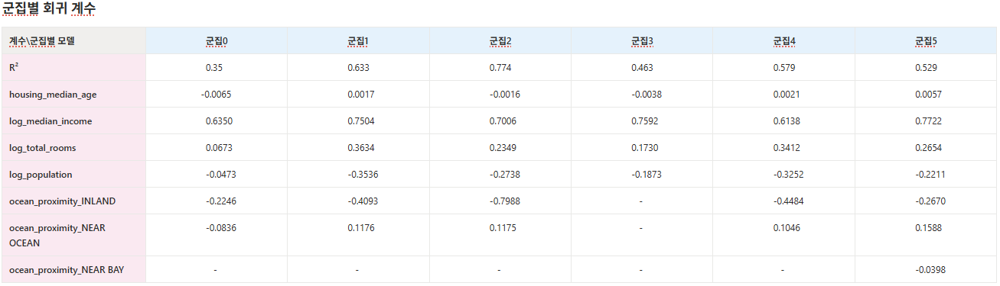

- 군집 5에서는 소득 변화에 따른 주택 가격의 변화가 가장 높게 나타나고, 이는 소득 수준이 주택 가격을 구분하는 시장 구조라고 할 수 있다.
- 군집 4에서는 소득의 영향력이 상대적으로 가장 낮아, 주택 가격이 소득 외의 다양한 요인에 의해 형성되는 복합적인 주거 시장 구조라고 할 수 있다.
- 주택 연령의 경우 군집마다 부호가 다른것을 확인할 수 있음.
    - 0,2,3 군집의 경우 주택의 환경, 관리 상태를 중요시하는 지역임
    - 1,4,5 군집의 경우 오히려 오래될 수록 오르는 경향이 있음 -> 주택의 환경, 관리 상태보다 입지가 더 중요하다는 것
- 방의 개수가 생각보다 영향력이 있는 군집 : 1,4 (회귀계수 0.3이상), 주거 환경의 질이 가격 형성에 중요한 요소로 작용함, 생활 공간의 크기와 쾌적성을 중요시 하는 지역
- 방의 개수가 중요하지 않은 군집 : 0,2,3,5 = 입지, 접근성, 환경이 더 중요시 되는 지역 -> 작은 집이라도 위치가 좋을경우 고가의 집값이 형성될 수 있음.
- 인구수의 영향을 받는 군집 : 1,4 (회귀계수 0.3 이상), 주택 가격에 부정적인 영향, 많이 밀집될수록 가격이 하락하는 경향이 존재함 
- 지리적 요인의 영향이 큰 군집 : 1,2,4 (회귀계수 0.3 이상), 특히 2번 군집은 가장 크게 나타났다. 이는 해당 지역에서 해안이라는 자연적 입지가 주택 가격을 형성하는 핵심 요인임을 알 수 있으며, 소득 외에도 입지 중심으로 주거 선호가 나타난다는 것을 알 수 있다. 

주거 선호도를 알기 위해 소득, 주거 환경, 입지로 나눠서 조사

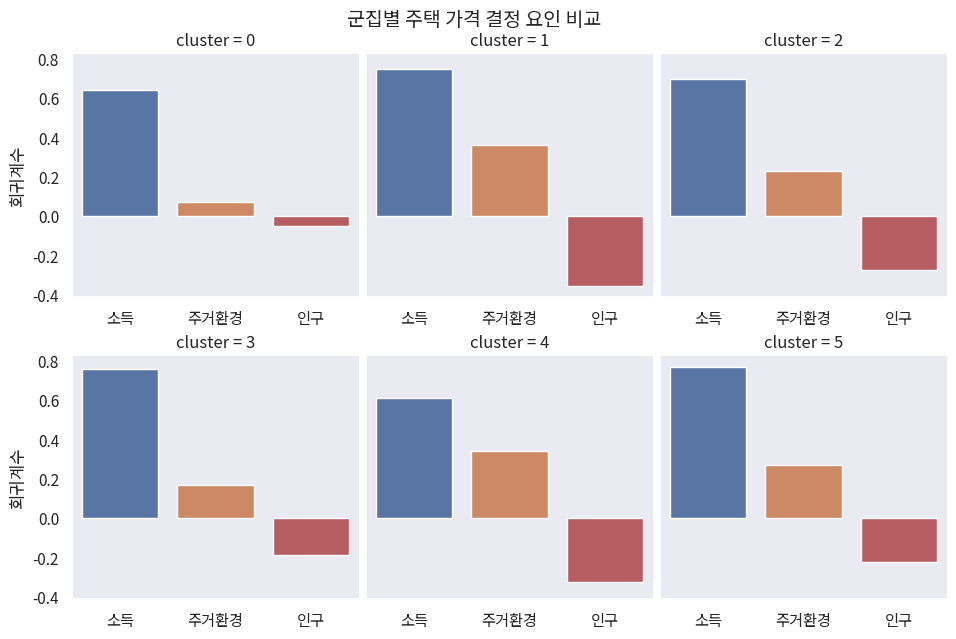

In [487]:
beta_df = pd.DataFrame({
    'cluster': [
        0,0,0,
        1,1,1,
        2,2,2,
        3,3,3,
        4,4,4,
        5,5,5
    ],
    'variable': [
        'log_median_income', 'log_total_rooms', 'log_population',
        'log_median_income', 'log_total_rooms', 'log_population',
        'log_median_income', 'log_total_rooms', 'log_population',
        'log_median_income', 'log_total_rooms', 'log_population',
        'log_median_income', 'log_total_rooms', 'log_population',
        'log_median_income', 'log_total_rooms', 'log_population'
    ],
    'beta': [
        # cluster 0
        0.64, 0.07, -0.0473,
        # cluster 1
        0.75, 0.36, -0.3536,
        # cluster 2
        0.70, 0.23, -0.2738,
        # cluster 3
        0.76, 0.17, -0.1873,
        # cluster 4
        0.61, 0.34, -0.3252,
        # cluster 5
        0.77, 0.27, -0.2211
    ]
})

var_map = {
    # 'housing_median_age': '주택 연식',
    'log_median_income': '소득',
    'log_total_rooms': '주거환경',
    'log_population': '인구'
}

beta_df['variable_kr'] = beta_df['variable'].map(var_map)

palette = {
    # '주택 연식': '#55A868',
    '소득': '#4C72B0',
    '주거환경': '#DD8452',
    '인구': '#C44E52'
}

g = sb.catplot(
    data=beta_df,
    x='variable_kr',
    y='beta',
    hue='variable_kr',
    col='cluster',
    kind='bar',
    col_wrap=3,
    height=3.2,
    aspect=1,
    palette=palette,
    legend=False
    )

g.fig.suptitle(
    '군집별 주택 가격 결정 요인 비교',
    fontsize=14
)
g.fig.subplots_adjust(
    top=0.88,     # 위 여백 (제목 공간)
    bottom=0.20,  # 아래 여백 (x축 라벨)
    hspace=0.35   # 위아래 그래프 간 간격
)

g.set_axis_labels('', '회귀계수')
for ax in g.axes.flat:
    ax.tick_params(axis='x', labelbottom=True)

plt.tight_layout()
plt.show()

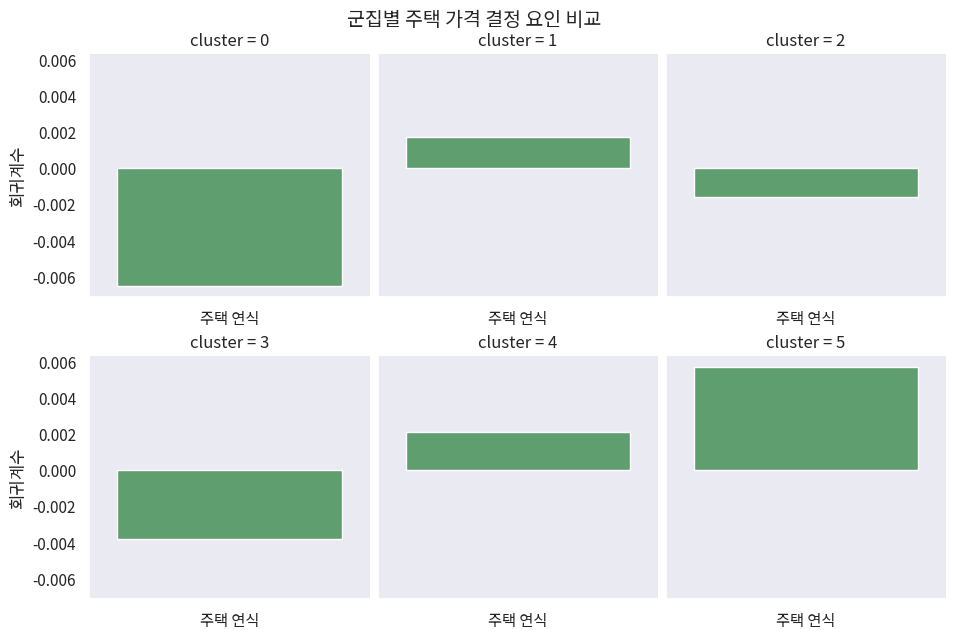

In [488]:
# 주택 연식 bar 그래프 그리기
# plt.figure(figsize=(6,4))
beta_df = pd.DataFrame({
    'cluster': [
        0,
        1,
        2,
        3,
        4,
        5
    ],
    'variable': [
        'housing_median_age',
        'housing_median_age',
        'housing_median_age',
        'housing_median_age',
        'housing_median_age',
        'housing_median_age'
    ],
    'beta': [
        -0.0065,
        0.0017,
        -0.0016,
        -0.0038,
        0.0021,
        0.0057
    ]
})
var_map = {
    'housing_median_age': '주택 연식',
}

beta_df['variable_kr'] = beta_df['variable'].map(var_map)
palette = {
    '주택 연식': '#55A868',
}

g = sb.catplot(
    data=beta_df,
    x='variable_kr',
    y='beta',
    hue='variable_kr',
    col='cluster',
    kind='bar',
    col_wrap=3,
    height=3.2,
    aspect=1,
    palette=palette,
    legend=False
    )

g.fig.suptitle(
    '군집별 주택 가격 결정 요인 비교',
    fontsize=14
)
g.fig.subplots_adjust(
    top=0.88,     # 위 여백 (제목 공간)
    bottom=0.20,  # 아래 여백 (x축 라벨)
    hspace=0.35   # 위아래 그래프 간 간격
)


g.set_axis_labels('', '회귀계수')
for ax in g.axes.flat:
    ax.tick_params(axis='x', labelbottom=True)


plt.tight_layout()
plt.show()

- 0번 군집은 저가,외곽형이면서 신축 의존 시장으로 판단됨 (신축 구매 가능성)
    - 소득 영향이 크지만 다른 군집들에 비해 낮은 편임
    - 방 개수의 영향은 6개 군집 중 가장 약함
    - 주택 연식은 음의 계수
    - 1,4 군집과 달리 방이 많아도 가격 프리미엄이 붙지 않음
    - 5번 군집처럼 고소득 경쟁 시장이 아닌것을 확인할 수 있음
    - > 집의 질보다 구매 가능 여부와 신축 여부가 핵심인 시장
- 1번 군집은 소득 + 주거 환경을 함께 고려하는 부도심으로 판단됨 (소득+집 규모)
    - 소득의 영향이 0번 군집보단 크고 5번 군집보단 작음
    - 주거 환경 회귀 계수는 군집 중 제일 큼
    - 인구 계수 절댓값 또한 큼 -> 혼잡 회피 성향이 강함
    - 주택 연식은 양의 계수
    - 0번 군집보다 집의 규모 가치가 훨씬 큼
    - > 소득과 주거환경을 동시에 고려하는 중산층 정착형 주거지로 신축 여부보다는 생활 여건이 가격을 좌우함.
- 2번 군집은 프리미엄 해안 인접, 저밀도 선호형 시장으로 판단됨 (입지 + 저밀도)
    - 소득 영향은 크지만 5번 군집보다는 작음
    - 인구 밀도에 매우 민감하고 5번 군집보다 신축 선호가 강함
    - 주택 연식은 음의 계수
    - > 소득 + 입지 + 저밀도가 동시에 요구되는 프리미엄 저밀도 거주지
- 3번 군집은 도심 핵심, 소득 절대 우위 시장으로 판단됨 (소득)
    - 소득 계수는 5번 군집과 함께 최상위에 위치함
    - 주거 환경 영향은 최하위권
    - 1,4 군집과 다르게 집의 규모의 의미가 작고 2번 군집보다 소득이 더 중요함
    - > 도심 특성상 소득 자체가 중요시되는 중심 상업,주거 혼합 지역
- 4번 군집은 가족형 주거환경 중심 LA 광역권으로 판단 (가족형 주거환경)
    - 소득 영향은 6개 군집 중 가장 낮음
    - 주거 환경 계수가 크고 인구 밀도 회피 성향이 강함
    - 주택 연식이 양의 계수임
    - 0번 군집과 다르게 방의 개수가 핵심 요인이면서 2,3군집보다 신축 집착이 적음
    - > 4번 군집은 주택 가격이 소득보다는 주거 환경과 정주 안정성에 의해 형성되는 가족 중심 주거지라고 판단됨
- 5번 군집은 초고가, 브랜드 입지 중심의 시장으로 판단됨(샌프란시스코 - 입지,브랜드 시장)
    - 소득 계수가 전체 중 제일 높음
    - 주거환경은 중간 수준
    - 인구 밀도 회피 성향이 존재
    - 주택 연식은 양의 계수
    - 2번 군집과 다르게 신축 선호가 약하고 3번 군집보다 입지 프리미엄이 강함
    - > 5번 군집은 주택 자체보다 입지와 소득에 의해 주택 가격을 결정하는 초고가 시장임


In [494]:
loc_price = (
    df
    .groupby(['CLUSTER_ID', 'ocean_proximity'])
    ['median_house_value']
    .mean()
    .reset_index()
)

loc_price


,CLUSTER_ID,ocean_proximity,median_house_value
0,0,<1H OCEAN,112187.500000
1,0,INLAND,86854.855292
2,0,NEAR OCEAN,95623.684211
3,1,<1H OCEAN,192268.840753
4,1,INLAND,112092.979920
5,1,NEAR OCEAN,200879.093839
6,2,<1H OCEAN,222616.502222
7,2,INLAND,83078.193146
8,2,NEAR OCEAN,252085.751152
9,3,INLAND,125893.238405


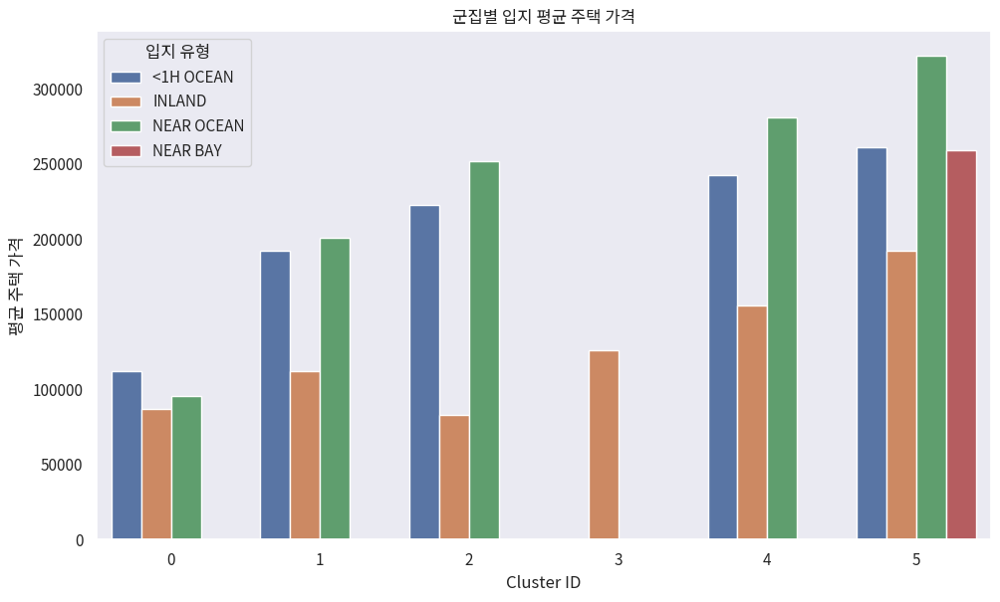

In [495]:
plt.figure(figsize=(10,6))

sb.barplot(
    data=loc_price[loc_price['ocean_proximity']!='ISLAND'],
    x='CLUSTER_ID',
    y='median_house_value',
    hue='ocean_proximity'
)

plt.title('군집별 입지 평균 주택 가격')
plt.ylabel('평균 주택 가격')
plt.xlabel('Cluster ID')
plt.legend(title='입지 유형')
plt.tight_layout()
plt.show()


- 군집별로 입지에 따라 평균 주택 가격이 다르며 군집별 회귀분석에서 입지 변수의 효과 차이를 설명하는 근거가 됨
- 해안에 가까울수록 평균 주택 가격이 높음
    - 캘리포니아 전반의 공통적 주거 선호도는 바다 접근성이 존재함
        - 하지만 차이의 크기가 군집마다 다름
        - CLUSTER 2에서 NEAR OCAN의 가격이 INLAND 대비 압도적으로 높음
            - INLAND 회귀계수 값이 -0.7988로 1H OCEAN 대비 매우 낮게 형성되는 모습
            - 입지 중심형 군집이라는 것을 알 수 있음
        - CLUSTER 1,4는 INLAND도 비교적 높은 가격을 형성하고 있음
            - 입지 + 주거환경이 함께 관여함
        - CLUSTER 0,3은 전체 가격 수준이 낮고 입지별 격차도 상대적으로 적음
            - 3번 클러스터는 특히 내륙지역임
            - > 기본 소득 자체가 낮은 지역 + 입지가 영향이 크지 않음
        - CLUSTER 5는 모든 입지 유형에서 가격이 가장 높음
            - 고소득 + 고입지 프리미엄 지역 -> 입지가 어디든 기본적으로 비쌈
- > 캘리포니아 주택 시장에서 입지 요인이 모든 지역에서 동일하게 작동하지 않음을 보여줌. 군집별로 입지에 따른 가격 가중치가 다르며 이는 주택 가격이 단일 요인에 의해 결정되기 보다는 지역의 공간적 구조와 사회경제적 특성의 결합에 의해 형성됨을 알 수 있음.
- 입지가 결정적인 곳 : INLAND의 계수가 크다는 곳
    - CLUSTER 2 :입지(해안 접근성)
- 입지 + 주거환경이 중요한 곳 : 입지효과도 크지만 주거환경 영향도 큰 곳
    - CLUSTER 1 : 소득 + 주거환경 + 입지
    - CLUSTER 4 : 주거환경 + 입지
- 소득, 주거환경이 더 중요한 곳 : 입지 간 가격 차이가 상대적으로 작고 소득,방 개수의 계수가 큰 곳
    - CLUSTER 5 : 소득
    - CLUSTER 0 : 소득 (입지 영향이 약함)
    - CLUSTER 3 : 소득 (입지 영향이 거의 없음, 내륙 지역)


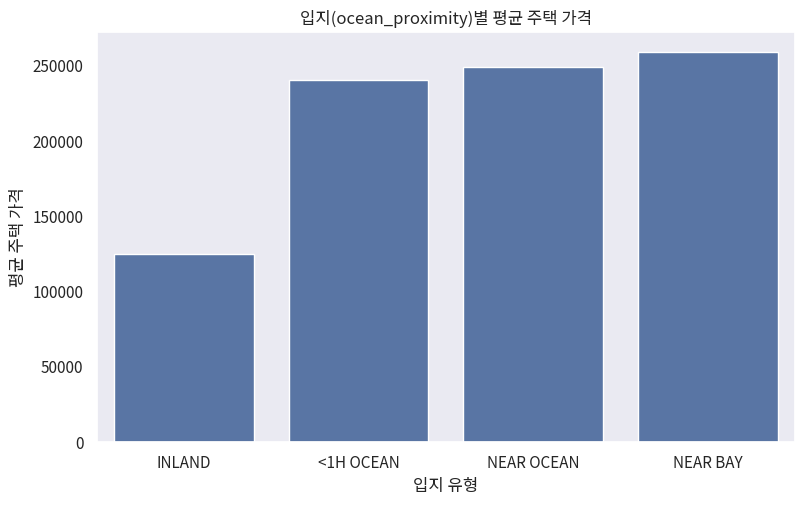

In [497]:
# 해안에 가까울수록 평균 주택 가격이 높은 이유 bar 그래프로  설명
loc_price = (
    df
    .groupby('ocean_proximity')
    ['median_house_value']
    .mean()
    .reset_index()
)
plt.figure(figsize=(8,5))
sb.barplot(
    data=loc_price[loc_price['ocean_proximity']!='ISLAND'],
    x='ocean_proximity',
    y='median_house_value',
    order=['INLAND', '<1H OCEAN', 'NEAR OCEAN', 'NEAR BAY']
)
plt.title('입지(ocean_proximity)별 평균 주택 가격')
plt.ylabel('평균 주택 가격')
plt.xlabel('입지 유형')
plt.tight_layout()
plt.show()


- 근데 NEAR BAY가 비싼 이유는 5번 군집에 한정해서 있는 데이터라 그럴 수 있음. 사실상 NEAR OCEAN 근처면 다른 군집에서도 비싸게 나타나는 것을 보아 바다 근처에 인프라가 좋거나 집값이 비싼 다른 이유가 있을 것임. 

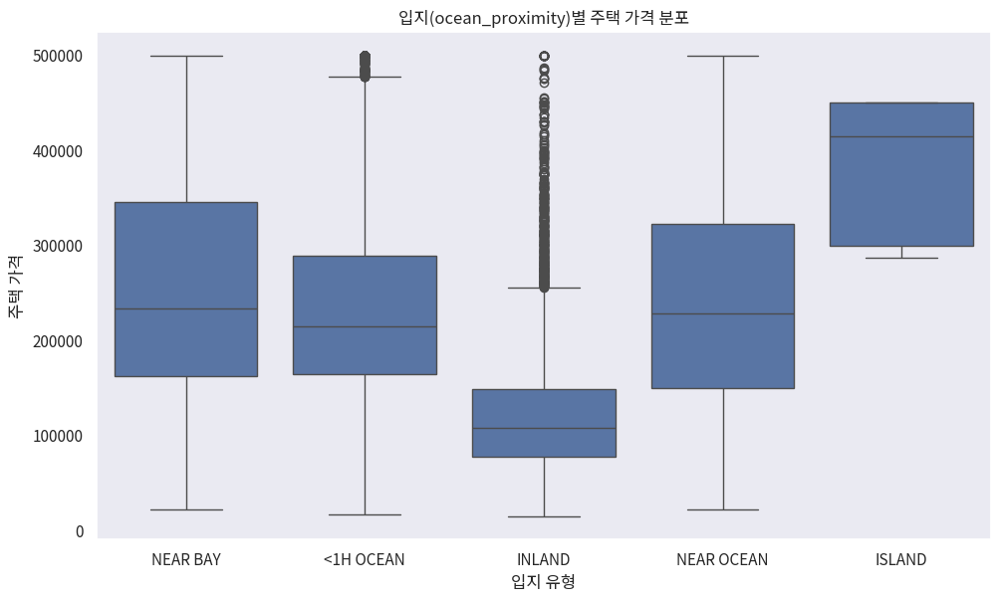

In [500]:
# 3. 입지는 모든 지역에서 동일한 프리미엄을 가질까?
plt.figure(figsize=(10,6))
sb.boxplot(x='ocean_proximity', y='median_house_value', data=df)
plt.title('입지(ocean_proximity)별 주택 가격 분포')
plt.ylabel('주택 가격')
plt.xlabel('입지 유형')
plt.tight_layout()
plt.show()

Text(0.5, 1.0, '군집별 INLAND 주택 가격 분포')

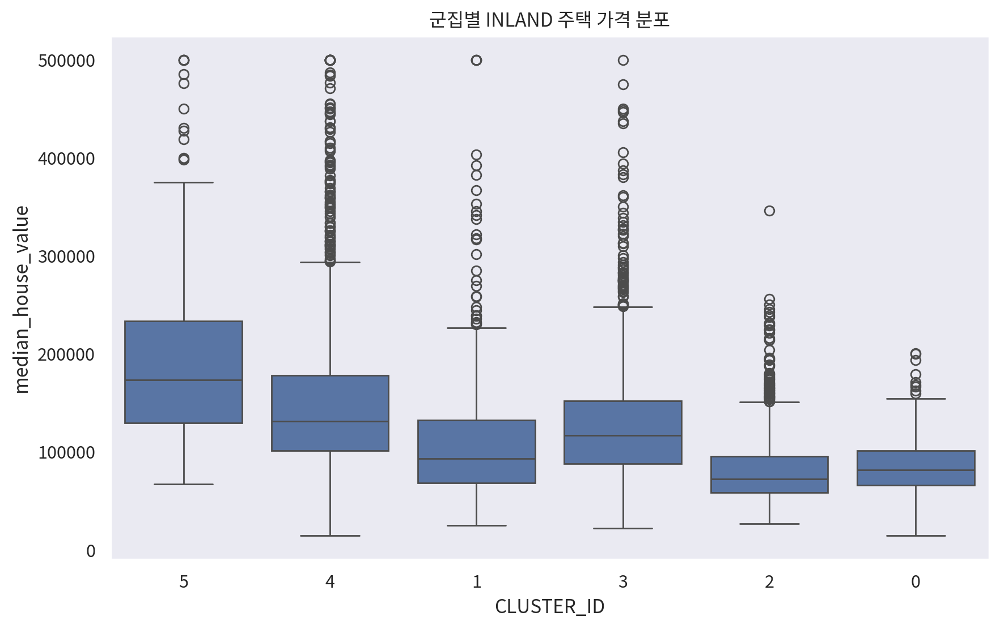

In [501]:
# CLUSTER별 INLAND 값 박스플롯
fig, axes = plt.subplots(1, 1, figsize=(10, 6), dpi=my_dpi)
sb.boxplot(x='CLUSTER_ID', y='median_house_value', data=df2[df
['ocean_proximity']=='INLAND'], order=[5, 4, 1, 3, 2, 0], ax=axes)
axes.set_title('군집별 INLAND 주택 가격 분포')  
# CLUSTER_ID 1번 군집의 회귀분석

Text(0.5, 1.0, '군집별 <1H OCEAN 주택 가격 분포')

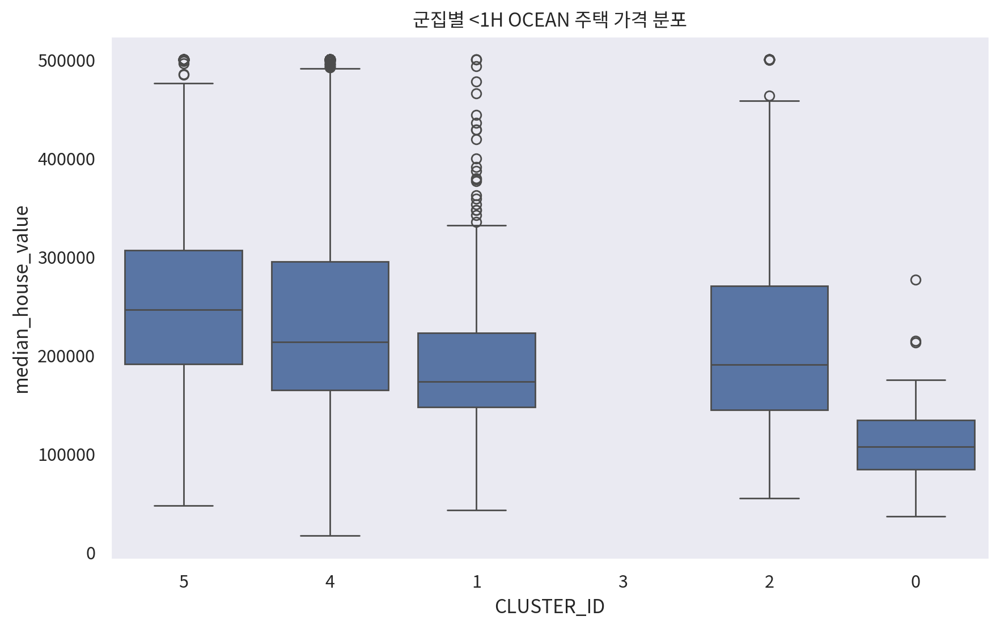

In [502]:
# CLUSTER별 INLAND 값 박스플롯
fig, axes = plt.subplots(1, 1, figsize=(10, 6), dpi=my_dpi)
sb.boxplot(x='CLUSTER_ID', y='median_house_value', data=df2[df
['ocean_proximity']=='<1H OCEAN'], order=[5, 4, 1, 3, 2, 0], ax=axes)
axes.set_title('군집별 <1H OCEAN 주택 가격 분포')  
# CLUSTER_ID 1번 군집의 회귀분석

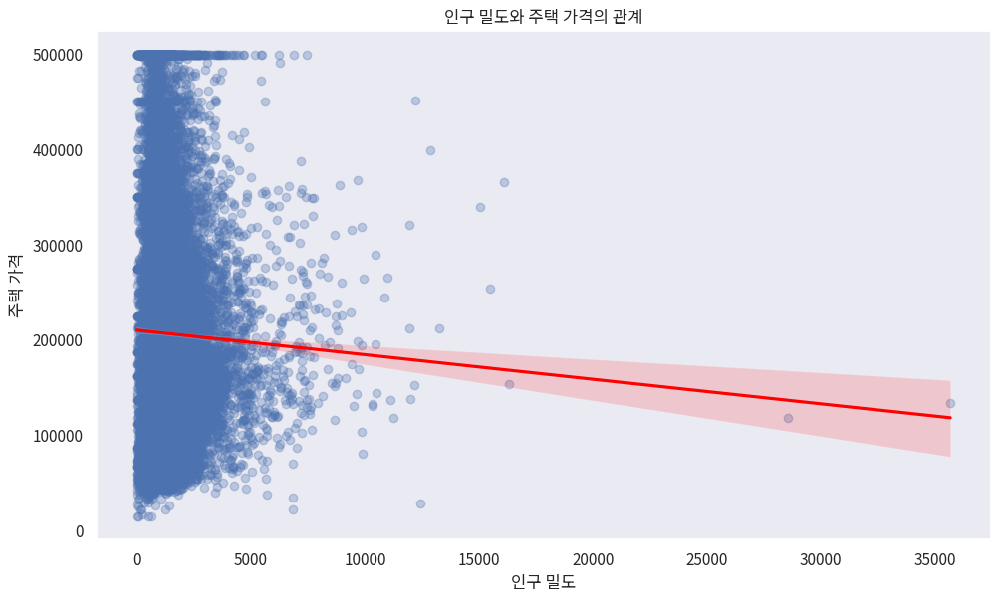

In [503]:
# 4. 인구 밀도는 주택 가격에 어떤 신호를 주고 있을까?
plt.figure(figsize=(10,6))
sb.regplot(x='population', y='median_house_value', data=df, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
plt.title('인구 밀도와 주택 가격의 관계')
plt.ylabel('주택 가격')
plt.xlabel('인구 밀도')
plt.tight_layout()
plt.show()

상협님꺼 넣으려고 봤는데 7번 문제가 아예 다른 문제라서 밑에 가설로 추가해서 넣을게요!

#### 가설 2. 부촌에서 침실비중이 높을수록 주택 가격에는 음의 영향을 미칠 것이다.

In [515]:
# df_sh는 상협님의 코드부분
df_sh = origin.copy()
df_sh['AveRooms'] = df_sh['total_rooms'] / df_sh['households']
df_sh['AveBedrms'] = df_sh['total_bedrooms'] / df_sh['households']
df_sh['AveOccup'] = df_sh['population'] / df_sh['households']
df_sh

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,CLUSTER_ID,AveRooms,AveBedrms,AveOccup
0,-122.23,37.88,41,880,129.0,322,126,8.3252,452600,NEAR BAY,5,6.984127,1.023810,2.555556
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,358500,NEAR BAY,5,6.238137,0.971880,2.109842
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,352100,NEAR BAY,5,8.288136,1.073446,2.802260
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,341300,NEAR BAY,5,5.817352,1.073059,2.547945
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,342200,NEAR BAY,5,6.281853,1.081081,2.181467
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,1665,374.0,845,330,1.5603,78100,INLAND,3,5.045455,1.133333,2.560606
20636,-121.21,39.49,18,697,150.0,356,114,2.5568,77100,INLAND,3,6.114035,1.315789,3.122807
20637,-121.22,39.43,17,2254,485.0,1007,433,1.7000,92300,INLAND,3,5.205543,1.120092,2.325635
20638,-121.32,39.43,18,1860,409.0,741,349,1.8672,84700,INLAND,3,5.329513,1.171920,2.123209


- 다중공선성 문제가 발생하는 집 관련 변수들을 변환
    - 가구당 평균 방 개수, 가구당 평균 침실 개수, 가구당 평균 인구수

In [516]:
fields = ['AveRooms', 'AveBedrms', 'housing_median_age', 'AveOccup', 'population']

df_sh[fields].describe().T

,count,mean,std,min,25%,50%,75%,max
AveRooms,20640.0,5.429000,2.474173,0.846154,4.440716,5.229129,6.052381,141.909091
AveBedrms,20433.0,1.097062,0.476104,0.333333,1.006029,1.048889,1.099631,34.066667
housing_median_age,20640.0,28.639486,12.585558,1.000000,18.000000,29.000000,37.000000,52.000000
AveOccup,20640.0,3.070655,10.386050,0.692308,2.429741,2.818116,3.282261,1243.333333
population,20640.0,1425.476744,1132.462122,3.000000,787.000000,1166.000000,1725.000000,35682.000000


C:\Users\itwill\AppData\Local\Temp\ipykernel_11052\1681435636.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.barplot(data=df_data, x='CLUSTER', y='Value', ax=ax, palette='viridis')


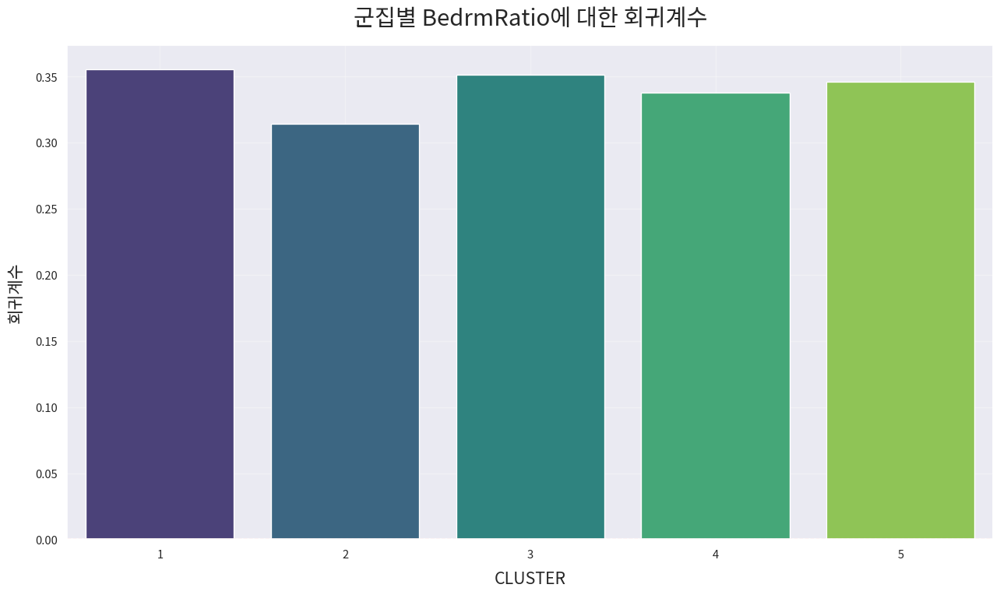

In [522]:
my_dpi = 96

# 1) 그래프 초기화 (캔바스(fig)와 도화지(ax) 준비하기)
width_px = 1280                  # 그래프 가로 크기
height_px = 760                 # 그래프 세로 크기
rows = 1                         # 도화지의 행 수
cols = 1                        # 도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize=figsize, dpi=my_dpi)

data = {
    'CLUSTER': [ '1', '2', '3', '4', '5'],
    'Value': [0.3557, 0.3145, 0.3512, 0.3380, 0.3461]
}
df_data = pd.DataFrame(data)

# 2) BoxPlot 그리기
sb.barplot(data=df_data, x='CLUSTER', y='Value', ax=ax, palette='viridis')

# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용
ax.grid(True, alpha=0.3)                                  # 배경 격자 표시/ 숨김 (테마에 따라 다름)
ax.axhline(0, color='red', linestyle='--', linewidth=1)
ax.set_title("군집별 BedrmRatio에 대한 회귀계수", fontsize=22,
             fontweight=1000, pad=20)
ax.set_xlabel("CLUSTER", fontsize=16, labelpad=10)
ax.set_ylabel("회귀계수", fontsize=16, labelpad=10)

# 4) 출력
plt.tight_layout()                          # 여백 제거
plt.show()                                  # 그래프 화면 출력
plt.close()  

- 캘리포니아에서는 침실 비중이 높을수록 더 높은 가격을 형성하는 시장임

C:\Users\itwill\AppData\Local\Temp\ipykernel_11052\2178760654.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.barplot(data=df_data, x='CLUSTER', y='Value', ax=ax, palette='viridis')


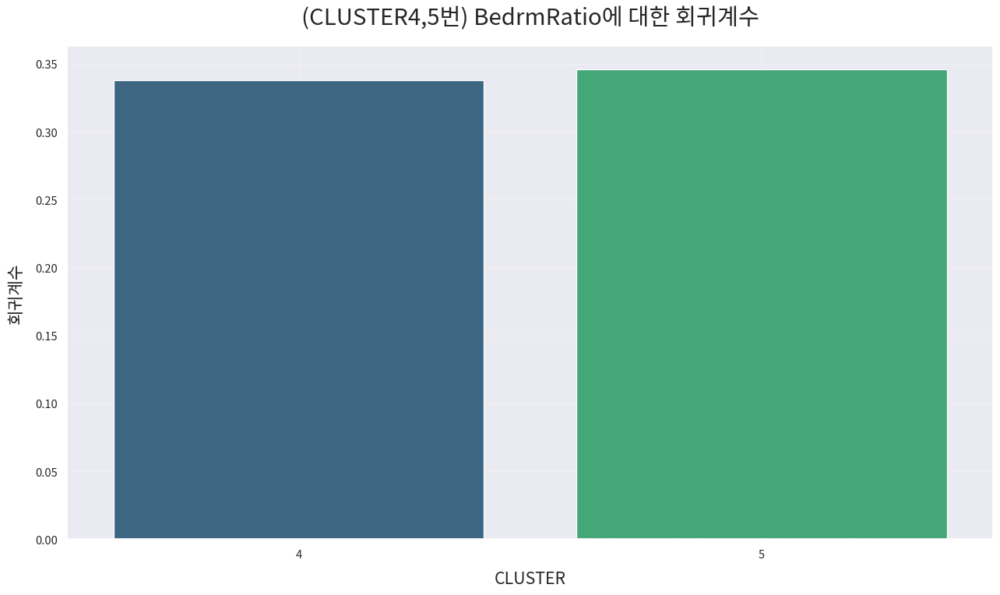

In [521]:
my_dpi = 96

# 1) 그래프 초기화 (캔바스(fig)와 도화지(ax) 준비하기)
width_px = 1280                  # 그래프 가로 크기
height_px = 760                 # 그래프 세로 크기
rows = 1                         # 도화지의 행 수
cols = 1                        # 도화지의 열 수
figsize = (width_px / my_dpi, height_px / my_dpi)
fig, ax = plt.subplots(rows, cols, figsize=figsize, dpi=my_dpi)

data = {
    'CLUSTER': ['4', '5'],
    'Value': [0.3380, 0.3461]
}
df_data = pd.DataFrame(data)

# 2) BoxPlot 그리기
sb.barplot(data=df_data, x='CLUSTER', y='Value', ax=ax, palette='viridis')

# 3) 그래프 꾸미기 -> 도화지(ax)에 직접 적용
ax.grid(True, alpha=0.3)                                  # 배경 격자 표시/ 숨김 (테마에 따라 다름)
ax.axhline(0, color='red', linestyle='--', linewidth=1)
ax.set_title("(CLUSTER4,5번) BedrmRatio에 대한 회귀계수", fontsize=22,
             fontweight=1000, pad=20)
ax.set_xlabel("CLUSTER", fontsize=16, labelpad=10)
ax.set_ylabel("회귀계수", fontsize=16, labelpad=10)

# 4) 출력
plt.tight_layout()                          # 여백 제거
plt.show()                                  # 그래프 화면 출력
plt.close()  

- 대도심의 경우 또한 침실 비중이 높을수록 주택 가격이 오르는 경향을 보임
- 부촌에서 침실비중이 높을수록 주택 가격에는 음의 영향을 미칠 것이다.
    - X -> 양의 영향을 미치는 것으로 판단됨